In [1]:
from __init__ import DATASET_PATH


import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor, plot_tree
from sklearn.metrics import mean_squared_error, mean_absolute_error, root_mean_squared_error, r2_score, PredictionErrorDisplay
from tqdm import tqdm

from sklearn.preprocessing import RobustScaler
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import PowerTransformer
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import SimpleImputer, KNNImputer, IterativeImputer
from sklearn.model_selection import cross_val_score, cross_validate, cross_val_predict
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import RepeatedKFold

from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import RFE
from sklearn.inspection import permutation_importance
from sklearn.feature_selection import SelectFromModel
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import PolynomialFeatures
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor



from main.constants import CATEGORICAL_ATTRIBUTES, CONTINUOUS_ATTRIBUTES, IGF, PROLACTIN, VITAMINE_D, PCO, inflammatory_attributes, carbohydrate_metabolism_attributes, vitamin_d_associated_features
from main.components.preprocessing_methods import remove_outliers, get_continuous_attributes_except, get_categorical_attributes_except, explore_all_variations_of_preprocessing
from main.components.hyperparameter_tuning_methods import hyperparameter_tuning_general, hyperparameter_tuning_linear, compare_random_states, train_model
from main.components.feature_importance_methods import get_feature_importance_lasso, get_feature_importance_tree, get_feature_importance_rf, get_feature_importance_knn, rename_importnace_col, merge_feature_importances, rank_importances, feature_selection_mutual_info_regression, recursive_feature_elimination, get_permutation_importance

import nest_asyncio
nest_asyncio.apply()

pd.set_option('display.max_columns', None) # enable showing all columns of the df
pd.set_option('display.max_rows', None)
pd.set_option("display.expand_frame_repr", True)
pd.set_option('display.width', 1000)
pd.set_option('display.max_colwidth', None)


In [2]:
dataset_file_path = DATASET_PATH
raw_df = pd.read_csv(dataset_file_path)
raw_df.sample(5)

,"PCO 0-healthy control, 1-PCOS, 2-FHA 3-POF, 4-High Andro",IGF-1 ng/ml (N: 100-311),proBNP,"AMH (ng/ml) *7,14=pmol/l",weight,height (cm),BMI,systolic BP (ciśnienie skurczowe),diastolic BP (ciśnienie rozskurczowe),Hypertension,Waist Circumference (WC),WC>88,Hip Circumference (HC),WHR (Waist/Hip ratio),"WHR>0,85 (WHO)","WHR>0,8 (NIDDK)",WHTR (Waist/Height Ratio),"WHTR>0,5","overweight/obesity 0-normal/low, 1-overweight, 2-obesity","irregular cycles (0-nie, 1-tak)","ovulation (0-brak, 1-obecna)","PCO ovary morfology in USG (0-brak, 1--obecna)","stromal hypertrophy in ovary (0-brak, 1-obecny)",acne,hirsutism,FG score (Ferriman-Gallway score - stopień androgenizacji),hyperandrogenism,elevated DHT,hypothyroidism,Volume of the thyroid Right Lobe,Volume of the thyroid Left Lobe,thyroid volume,"nodules 0-lack, 1-RL, 2-LL, 3-both",chronic thyroiditis,Vole of the Right Ovary,Volume of the Left Ovary,ovaries volume - total,follicules >12,WBC x10^3/ul,neutrophil x10^3/ul,lymphocytes x10^3/ul,monocytes x10^3/ul,eosinocytes x10^3/ul,basophils x10^3/ul,% neutrophil,% lymphocytes,% monocytes,%eosinocytes,%basophils,RBC x10^6ul,Hemoglobin [g/dl],hematocrit [%],HTC/Hb,MCV fl,MCH pg,MCHC g/dl,RDW-CV %,PLT x10^3/ul,PDW fl,MPV fl,P-LCR %,PLT/WBC,MPV/PLT,PLR,limf/mono,NLR (stosunek neutrofili do limfocytów),L/WCC (leukocyty do całkowitej liczby krwinek białych),eos/leukocyty,sodium mmol/l,potassium mmol/l,calcium mg/dl,phosphorus mg/dl,creatinine mg/dl,CRP mg/l,ALT U/l,AST U/l,Bilirubin mg/dl,CHOL mmol/l,CHOL>200,HDL mmol/l,HDL<50,LDL mmol/l,LDL>135,TG mmol/l,Atherogenic index (AI) (LDL-C/HDL-C),coronary risk index (CRI) (TG/HDL-C),VAI - Visceral adiposity index,BAI - Body adiposity index,LAP INDEX - Lipid accumulation product index,TyG Index - Trigliceride-glucose index,AIP -Atherogenic index of plasma,UIBC ug/dl,ferrum ug/dl,TIBC,TSAT,ferritin ng/ml,glucose 0 mg/dl,glucose 120 mg/dl,insulin 0 uU/ml,Insulin 120 uU/ml,HOMA,Matsuda,"QUICKI (N<0,357)",TSH mIU/L,FT3 pmol/l,FT4 pmol/l,Anty-TPO IU/ml,Anty-TG IU/ml,FSH mlU/ml,LH,LH/FSH,prolactin,DHEA-S ug/dl,testosterone nmol/l,T (ng/ml),T/SHBG,E(pg/ml)/T(ng/ml)/,Parathormone pg/ml,cortisol nmol/l 8:00,cortisol nmol/l 18:00,Estradiol pg/ml,SHBG nmol/l,SHBG>110,FTI (free testosterone index),ACTH pg/ml,HbA1c %,vitamin 25-OH D ng/ml,Androstendione ng/ml,17-OH-progesterone ng/ml,Dihydrotestosterone pg/ml (N<368),Testosterone/DHT,T/A (testosterone/androstendione),age
32,0,170.0,25.27,NaN,61.0,156.0,25.065746,102.0,75.0,0.0,75.0,0.0,90.0,0.833333,0.0,1.0,0.480769,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,21.0,1.0,0.0,1.0,3.094,0.048,3.142,0.0,0.0,6.06,6.90,12.96,0.0,4.68,2.57,1.47,0.45,0.15,0.04,54.9,31.4,9.6,3.2,0.9,4.24,12.4,35.9,2.895161,84.7,29.2,34.5,12.4,221.0,16.5,12.7,45.8,47.222222,0.057466,150.340136,3.266667,1.748299,0.314103,0.032051,145.0,4.15,9.78,4.48,0.67,1.0,10.0,13.0,1.97,4.65480,0.0,1.83606,0.0,2.560140,0.0,0.55321,1.394366,0.690141,0.505103,39.692308,9.40457,4.222849,-0.161062,266.0,74.0,339.0,22.0,30.0,95.0,91.0,6.07,19.35,1.423827,9.92,0.362199,2.90,4.70,21.08,8.0,11.0,6.9,5.0,0.724638,350.0,343.0,1.10,0.317003,0.033435,283.909089,56.14,376.0,148.0,90.0,32.9,0.0,3.46,19.10,4.6,28.0,2.18,2.87,270.0,0.004074,0.504587,32.0
498,1,118.0,30.33,6.613445,117.0,170.0,40.484429,NaN,NaN,NaN,130.0,1.0,107.0,1.214953,1.0,1.0,0.764706,1.0,2.0,1.0,1.0,1.0,0.0,0.0,0.0,NaN,1.0,1.0,1.0,8.925,6.300,15.225,2.0,1.0,15.98,10.00,25.98,1.0,12.87,7.57,3.99,0.79,0.48,0.04,58.9,31.0,6.1,3.7,0.3,5.22,14.7,44.1,3.000000,84.5,28.2,33.3,13.6,337.0,13.1,11.0,32.7,26.184926,0.032641,84.461153,5.050633,1.897243,0.310023,0.037296,143.0,4.44,9.47,2.87,0.73,1.9,50.0,34.0,0.26,5.68920,1.0,0.77580,1.0,2.999760,0.0,4.21117,3.866667,12.433333,11.708717,44.941176,303.20424,5.273276,1.094588,NaN,NaN,NaN,NaN,NaN,102.0,97.0,30.15,44.93,7.593333,2.73,0.286706,6.42,6.75,16.89,8.0,10.0,7.9,11.3,1.430380,398.0,371.0,1.90,0.547550,0.113772,54.789473,41.25,311.0,39.0,30.0,16.7,0.0,11.13,36.19,5.4,18.0,3.61,1.59,461.0,0.004121,0.526316,20.0
317,1,Na

### Handle `vitamine D ` outliers

Left only the values within the interval: [-13.35, 64.45]
Removed 6 outlier values of vitamin 25-OH D ng/ml -> 1.07 % of all the not null examples


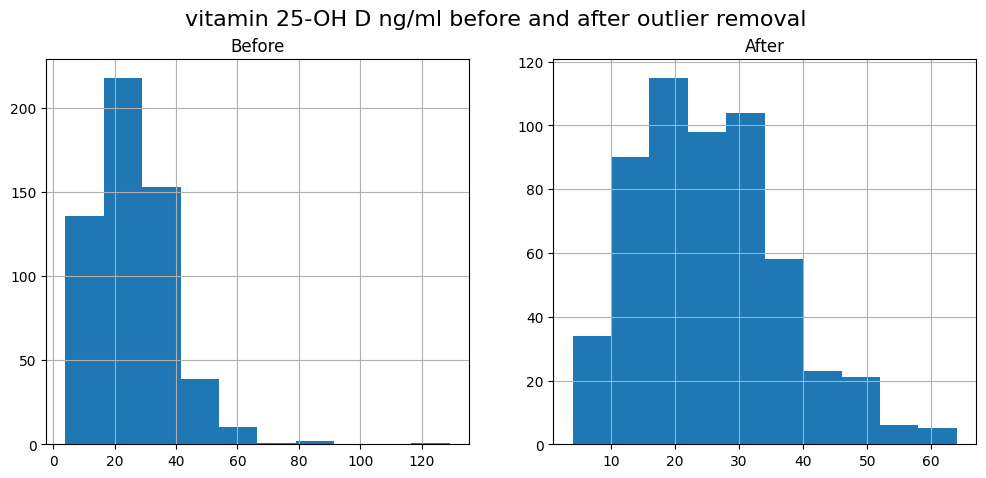

In [3]:
df = remove_outliers(raw_df, VITAMINE_D)

# Model selection for vitamin D

In [4]:
df_vit_d_cleaned = df.dropna(subset=[VITAMINE_D])

X_vit_d, y_vit_d = df_vit_d_cleaned.drop(columns=[VITAMINE_D]), df_vit_d_cleaned[VITAMINE_D]
X_train_vit_d, X_test_vit_d, y_train_vit_d, y_test_vit_d = train_test_split(X_vit_d, y_vit_d, test_size=0.2, random_state=42)

Best preprocessing techniques for vitamin D:

In [5]:
continuous_preprocessor_tree_hyperparam_tuning = Pipeline([('imputer', KNNImputer(n_neighbors=10))])
continuous_preprocessor_tree = Pipeline([('imputer',  IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10, n_jobs=-1), max_iter=10, initial_strategy='median'))])


continuous_preprocessor_hyperparam_tuning = Pipeline([('scaler', PowerTransformer()), ('imputer', KNNImputer(n_neighbors=10))])
continuous_preprocessor =  Pipeline([('scaler', PowerTransformer()), ('imputer', IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10, n_jobs=-1), max_iter=10, initial_strategy='median'))])


linear_continuous_preprocessor =  Pipeline([('scaler', PowerTransformer()),
                                            ('imputer', KNNImputer(n_neighbors=10)),
                                            ('poly',  PolynomialFeatures(degree=2, interaction_only=True))
                                            ])

categorical_preprocessor = Pipeline([
    ('imputer', IterativeImputer(estimator=KNeighborsClassifier(n_neighbors=10, n_jobs=-1), max_iter=40, initial_strategy='most_frequent')),
    ('one_hot_encoder', OneHotEncoder(handle_unknown='error', drop='if_binary'))
    ])

### preprocessing exploration

In [17]:

from sklearn.discriminant_analysis import StandardScaler
from sklearn.preprocessing import MinMaxScaler


models = [
        LinearRegression(),
        Lasso(),
        Ridge(),
        KNeighborsRegressor(),
        RandomForestRegressor(),
        DecisionTreeRegressor(),
        ]


continuous_preprocessings = {
    # 'Min Max': Pipeline([('scaler', MinMaxScaler()), ('imputer', KNNImputer(n_neighbors=10))]),
    # 'Standard Scaler': Pipeline([('scaler', StandardScaler()), ('imputer', KNNImputer(n_neighbors=10))]),
    # 'Power Transformer': Pipeline([('scaler', PowerTransformer()), ('imputer', KNNImputer(n_neighbors=10))]),
    
    'Min Max': Pipeline([('scaler', MinMaxScaler()), ('imputer', IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10, n_jobs=-1), max_iter=10, initial_strategy='median'))]),
    'Standard Scaler': Pipeline([('scaler', StandardScaler()), ('imputer', IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10, n_jobs=-1), max_iter=10, initial_strategy='median'))]),
    'Power Transformer': Pipeline([('scaler', PowerTransformer()), ('imputer', IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10, n_jobs=-1), max_iter=10, initial_strategy='median'))]),
}

categorical_preprocessings = {
    'ii_imputer': Pipeline([('imputer', IterativeImputer(estimator=KNeighborsClassifier(n_neighbors=10, n_jobs=-1), max_iter=10, initial_strategy='most_frequent')), ('one_hot_encoder', OneHotEncoder(handle_unknown='error', drop='if_binary'))]),
}


scores_df = explore_all_variations_of_preprocessing(X_train_vit_d, y_train_vit_d, VITAMINE_D, models, continuous_preprocessings, categorical_preprocessings)
scores_df.sort_values(by='neg_mean_absolute_error', ascending=True)

1/12 LinearRegression() Min Max ii_imputer [ -9.89817416 -10.53651685 -11.25421348 -10.43528054 -14.53693182
 -11.99824438 -10.95505618 -10.72542135 -12.078125   -11.82137784
  -9.72752809 -15.04002809 -11.49508427 -10.01775568 -10.19247159] 11.3808139550349
2/12 Lasso() Min Max ii_imputer [-9.12684653 -8.3055949  -8.84679109 -9.39756657 -9.36379641 -9.80356123
 -8.50608605 -8.80289469 -8.07714921 -9.82298335 -8.9290636  -9.44617281
 -9.19110646 -9.23089893 -8.31592572] 9.011095836009014
3/12 Ridge() Min Max ii_imputer [ -9.47523581  -9.38935455  -9.37479686  -8.93042856  -9.18217044
 -10.37226357  -9.41359059  -9.04260965  -8.60476507  -9.49051695
  -8.84708683  -9.04669496  -8.93290131  -8.43512037  -9.88055595] 9.227872765777798
4/12 KNeighborsRegressor() Min Max ii_imputer [-10.88988764  -9.39775281  -9.05617978  -9.525       -9.74090909
 -10.59775281  -9.39325843  -9.80674157  -9.09772727  -9.775
 -10.11235955  -9.94382022  -9.4494382   -9.74318182  -9.33636364] 9.724358188627853


,continuous_preprocessing,categorical_pteprocessing,model,neg_mean_absolute_error
9,Power Transformer,ii_imputer,Lasso(),8.585063
5,Standard Scaler,ii_imputer,Lasso(),8.592233
1,Min Max,ii_imputer,Lasso(),9.011096
2,Min Max,ii_imputer,Ridge(),9.227873
7,Standard Scaler,ii_imputer,KNeighborsRegressor(),9.367509
11,Power Transformer,ii_imputer,KNeighborsRegressor(),9.379389
3,Min Max,ii_imputer,KNeighborsRegressor(),9.724358
6,Standard Scaler,ii_imputer,Ridge(),10.230996
10,Power Transformer,ii_imputer,Ridge(),10.236343
0,Min Max,ii_imputer,LinearRegression(),11.380814


In [18]:

models = [
        LinearRegression(),
        Lasso(),
        Ridge(),
        KNeighborsRegressor(),
        RandomForestRegressor(),
        DecisionTreeRegressor(),
        ]


continuous_preprocessings = {
    # 'Min Max': Pipeline([('scaler', MinMaxScaler()), ('imputer', KNNImputer(n_neighbors=10))]),
    # 'Standard Scaler': Pipeline([('scaler', StandardScaler()), ('imputer', KNNImputer(n_neighbors=10))]),
    # 'Power Transformer': Pipeline([('scaler', PowerTransformer()), ('imputer', KNNImputer(n_neighbors=10))]),
    
    'Min Max': Pipeline([('scaler', MinMaxScaler()), ('imputer', IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10, n_jobs=-1), max_iter=10, initial_strategy='median'))]),
    'Standard Scaler': Pipeline([('scaler', StandardScaler()), ('imputer', IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10, n_jobs=-1), max_iter=10, initial_strategy='median'))]),
    'Power Transformer': Pipeline([('scaler', PowerTransformer()), ('imputer', IterativeImputer(estimator=KNeighborsRegressor(n_neighbors=10, n_jobs=-1), max_iter=10, initial_strategy='median'))]),
}

categorical_preprocessings = {
    'ii_imputer': Pipeline([('imputer', IterativeImputer(estimator=KNeighborsClassifier(n_neighbors=10, n_jobs=-1), max_iter=10, initial_strategy='most_frequent')), ('one_hot_encoder', OneHotEncoder(handle_unknown='error', drop='if_binary'))]),
}


scores_df = explore_all_variations_of_preprocessing(X_train_vit_d, y_train_vit_d, VITAMINE_D, models, continuous_preprocessings, categorical_preprocessings)
scores_df.sort_values(by='neg_mean_absolute_error', ascending=True)

1/18 LinearRegression() Min Max ii_imputer [ -9.89817416 -10.53651685 -11.25421348 -10.43528054 -14.53693182
 -11.99824438 -10.95505618 -10.72542135 -12.078125   -11.82137784
  -9.72752809 -15.04002809 -11.49508427 -10.01775568 -10.19247159] 11.3808139550349
2/18 Lasso() Min Max ii_imputer [-9.12684653 -8.3055949  -8.84679109 -9.39756657 -9.36379641 -9.80356123
 -8.50608605 -8.80289469 -8.07714921 -9.82298335 -8.9290636  -9.44617281
 -9.19110646 -9.23089893 -8.31592572] 9.011095836009014
3/18 Ridge() Min Max ii_imputer [ -9.47523581  -9.38935455  -9.37479686  -8.93042856  -9.18217044
 -10.37226357  -9.41359059  -9.04260965  -8.60476507  -9.49051695
  -8.84708683  -9.04669496  -8.93290131  -8.43512037  -9.88055595] 9.227872765777798
4/18 KNeighborsRegressor() Min Max ii_imputer [-10.88988764  -9.39775281  -9.05617978  -9.525       -9.74090909
 -10.59775281  -9.39325843  -9.80674157  -9.09772727  -9.775
 -10.11235955  -9.94382022  -9.4494382   -9.74318182  -9.33636364] 9.724358188627853


,continuous_preprocessing,categorical_pteprocessing,model,neg_mean_absolute_error
16,Power Transformer,ii_imputer,RandomForestRegressor(),8.548435
13,Power Transformer,ii_imputer,Lasso(),8.585063
7,Standard Scaler,ii_imputer,Lasso(),8.592233
4,Min Max,ii_imputer,RandomForestRegressor(),8.603156
10,Standard Scaler,ii_imputer,RandomForestRegressor(),8.628983
1,Min Max,ii_imputer,Lasso(),9.011096
2,Min Max,ii_imputer,Ridge(),9.227873
9,Standard Scaler,ii_imputer,KNeighborsRegressor(),9.367509
15,Power Transformer,ii_imputer,KNeighborsRegressor(),9.379389
3,Min Max,ii_imputer,KNeighborsRegressor(),9.724358


## Hyperparameter tuning

### Lasso + PF

Lasso with polynomial features

Fitting 15 folds for each of 9 candidates, totalling 135 fits
Best parameters: {'model__alpha': 1}
Best score (neg_mean_absolute_error): -8.710032970277023


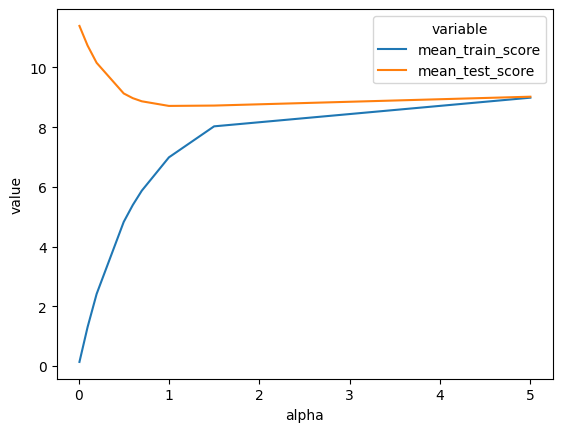

,alpha,mean_train_score,mean_test_score
0,0.01,0.140187,11.387913
1,0.1,1.305675,10.730554
2,0.2,2.414885,10.153626
3,0.5,4.827742,9.127120
4,0.6,5.390699,8.970097
5,0.7,5.872792,8.864744
6,1,6.987976,8.710033
7,1.5,8.026328,8.721792
8,5,8.985761,9.018594


In [ ]:
lasso_model = Lasso()

lasso_param_grid = {
    "model__alpha": [0.01, 0.1, 0.2, 0.5, 0.6, 0.7, 1, 1.5, 5],
}

vit_d_lasso_model_hyperparam_tuning_df = hyperparameter_tuning_linear(X_train_vit_d, y_train_vit_d, VITAMINE_D, Lasso(), linear_continuous_preprocessor, categorical_preprocessor, lasso_param_grid, main_parameter='alpha')
vit_d_lasso_model_hyperparam_tuning_df

C=0.5

### Lasso with regular features

Fitting 15 folds for each of 5 candidates, totalling 75 fits
Best parameters: {'model__alpha': 0.5}
Best score (neg_mean_absolute_error): -8.532784180369527


c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


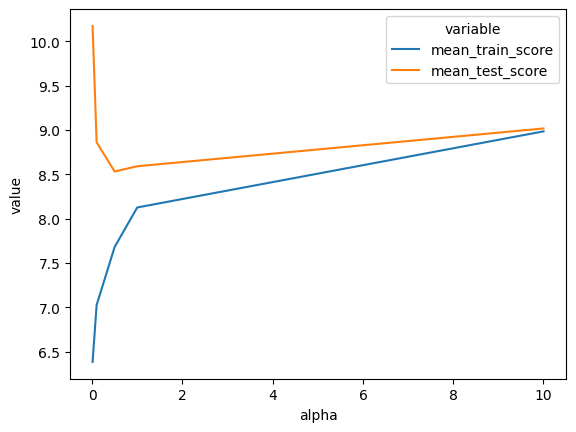

,alpha,mean_train_score,mean_test_score
0,0.01,6.385090,10.175282
1,0.1,7.027064,8.862401
2,0.5,7.683197,8.532784
3,1,8.127390,8.592373
4,10,8.985761,9.018594


In [8]:
lasso_model = Lasso()

lasso_param_grid = {
    "model__alpha": [0.01, 0.1, 0.5, 1, 10],
    }

vit_d_lasso_model_hyperparam_tuning_df = hyperparameter_tuning_linear(X_train_vit_d, y_train_vit_d, VITAMINE_D, Lasso(), continuous_preprocessor_hyperparam_tuning, categorical_preprocessor, lasso_param_grid, main_parameter='alpha')
vit_d_lasso_model_hyperparam_tuning_df

Selected alpha: 0.5

### Ridge + PF

Rigde + polynomial features

In [ ]:
ridge_param_grid = {
    "model__alpha": [0.000001, 0.01, 0.1, 1, 10, 50, 100, 200, 300, 500, 1000, 1000],
}

vit_d_ridge_model_hyperparam_tuning_df = hyperparameter_tuning_linear(X_train_vit_d, y_train_vit_d, VITAMINE_D, Ridge(), linear_continuous_preprocessor, categorical_preprocessor, ridge_param_grid, main_parameter='alpha')
vit_d_ridge_model_hyperparam_tuning_df

### Rigde

Fitting 15 folds for each of 6 candidates, totalling 90 fits
Best parameters: {'model__alpha': 500}
Best score (neg_mean_absolute_error): -8.483867729002244


c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


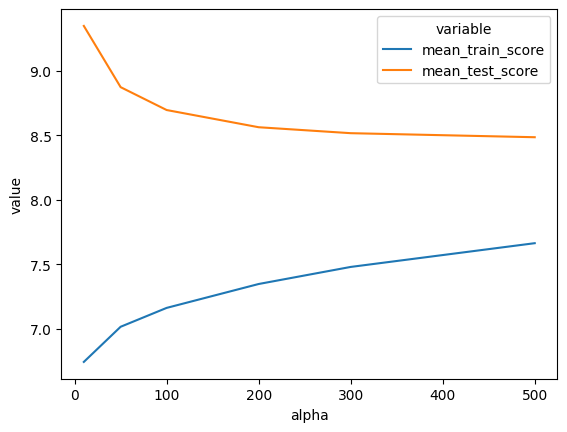

,alpha,mean_train_score,mean_test_score
0,10,6.745458,9.344962
1,50,7.017445,8.871240
2,100,7.163456,8.694264
3,200,7.348302,8.561145
4,300,7.480372,8.515124
5,500,7.664058,8.483868


In [9]:
ridge_param_grid = {
    "model__alpha": [10, 50, 100, 200, 300, 500],
}

vit_d_ridge_model_hyperparam_tuning_df = hyperparameter_tuning_linear(X_train_vit_d, y_train_vit_d, VITAMINE_D, Ridge(), continuous_preprocessor_hyperparam_tuning, categorical_preprocessor, ridge_param_grid, main_parameter='alpha')
vit_d_ridge_model_hyperparam_tuning_df

Best alpha: 100

### KNN


Fitting 15 folds for each of 7 candidates, totalling 105 fits
Best parameters: {'model__n_neighbors': 14}
Best score (neg_mean_absolute_error): -8.850297315044505


c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


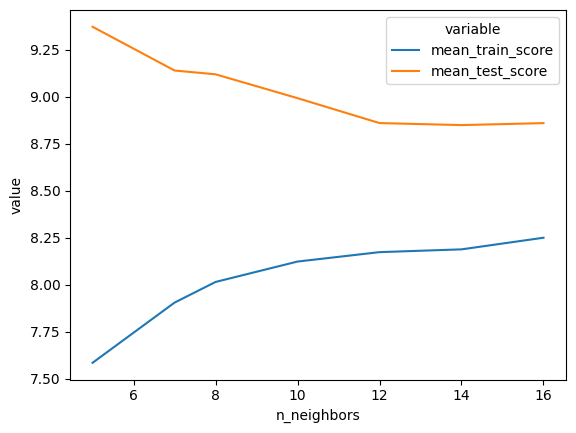

,n_neighbors,mean_train_score,mean_test_score
5,14,8.189375,8.850297
6,16,8.251229,8.860736
4,12,8.174540,8.861031
3,10,8.124504,8.993477
2,8,8.015984,9.120399
1,7,7.906167,9.140569
0,5,7.586090,9.373161


In [12]:
knn_model = KNeighborsRegressor()

knn_param_grid = {
    'model__n_neighbors': [5, 7, 8, 10, 12, 14, 16],  # Number of neighbors to consider
    # 'model__weights': ['uniform', 'distance'],  # Weight function used in prediction
    # 'model__algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],  # Algorithm used to compute the nearest neighbors
    # 'model__leaf_size': [20, 30, 40, 50],  # Leaf size passed to BallTree or KDTree
    # 'model__p': [1, 2]  # Power parameter for Minkowski metric (1 for Manhattan distance, 2 for Euclidean distance)
}

knn_hyperparam_tuning_df = hyperparameter_tuning_linear(X_train_vit_d, y_train_vit_d, VITAMINE_D, knn_model, continuous_preprocessor_hyperparam_tuning, categorical_preprocessor, knn_param_grid, main_parameter='n_neighbors')
knn_hyperparam_tuning_df.sort_values(by='mean_test_score')

In [ ]:
# knn_param_grid = {
#     'model__n_neighbors': [7, 12, 13, 14, 16],  # Number of neighbors to consider
#     # 'model__weights': ['uniform', 'distance'],  # Weight function used in prediction
#     'model__algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],  # Algorithm used to compute the nearest neighbors
#     'model__leaf_size': [20, 30, 40, 50],  # Leaf size passed to BallTree or KDTree
#     # 'model__p': [1, 2]  # Power parameter for Minkowski metric (1 for Manhattan distance, 2 for Euclidean distance)
# }

# vit_d_knn_model_hyperparam_tuning_df = hyperparameter_tuning_general(X_train_vit_d, y_train_vit_d, VITAMINE_D, knn_model, continuous_preprocessor, categorical_preprocessor, knn_param_grid)
# vit_d_knn_model_hyperparam_tuning_df.sort_values(by='mean_test_score')

### DecisionTreeRegressor

In [ ]:
tree_model = DecisionTreeRegressor()

tree_param_grid = {
    "model__criterion": ["absolute_error"],
    "model__max_depth": [8, 9, 10, 12],
    # "model__splitter": ["random", "best"],
    "model__min_samples_split": [15, 16, 17, 20],
    "model__min_samples_leaf": [20, 22, 25, 27],
    }

vit_d_tree_model_hyperparam_tuning_df = hyperparameter_tuning_general(X_train_vit_d, y_train_vit_d, VITAMINE_D, tree_model, continuous_preprocessor_tree_hyperparam_tuning, categorical_preprocessor, tree_param_grid)
vit_d_tree_model_hyperparam_tuning_df.sort_values(by='mean_test_score')

Fitting 15 folds for each of 64 candidates, totalling 960 fits
Best parameters: {'model__criterion': 'absolute_error', 'model__max_depth': 12, 'model__min_samples_leaf': 27, 'model__min_samples_split': 17}
Best score (neg_mean_absolute_error): -9.544982124616956


,params,mean_train_score,mean_test_score
62,"{'model__criterion': 'absolute_error', 'model__max_depth': 12, 'model__min_samples_leaf': 27, 'model__min_samples_split': 17}",7.197525,9.544982
61,"{'model__criterion': 'absolute_error', 'model__max_depth': 12, 'model__min_samples_leaf': 27, 'model__min_samples_split': 16}",7.197525,9.547255
45,"{'model__criterion': 'absolute_error', 'model__max_depth': 10, 'model__min_samples_leaf': 27, 'model__min_samples_split': 16}",7.197525,9.549149
60,"{'model__criterion': 'absolute_error', 'model__max_depth': 12, 'model__min_samples_leaf': 27, 'model__min_samples_split': 15}",7.197525,9.549511
29,"{'model__criterion': 'absolute_error', 'model__max_depth': 9, 'model__min_samples_leaf': 27, 'model__min_samples_split': 16}",7.197525,9.551783
47,"{'model__criterion': 'absolute_error', 'model__max_depth': 10, 'model__min_samples_leaf': 27, 'model__min_samples_split': 20}",7.200529,9.554503
28,"{'model__criterion': 'absolute_error', 'model__max_depth': 9, 'model__min_samples_leaf': 27, 'model__min_samples_split': 15}",7.186225,9.557763
14,"{'model__criterion': 'absolute_error', 'model__max_depth': 8, 'model__min_samples_leaf': 27, 'model__min_samples_split': 17}",7.197525,9.560891
44,"{'model__criterion': 'absolute_error', 'model__max_depth': 10, 'model__min_samples_leaf': 27, 'model__min_samples_split': 15}",7.197525,9.564611
63,"{'model__criterion': 'absolute_error', 'model__max_depth': 12, 'model__min_samples_leaf': 27, 'model__min_samples_split': 20}",7.186225,9.565288


In [ ]:
model = DecisionTreeRegressor(criterion="absolute_error", max_depth=10, min_samples_leaf=27, min_samples_split=15, splitter='random')

tuned_df = compare_random_states(X_train_vit_d, y_train_vit_d, model, VITAMINE_D, continuous_preprocessor, categorical_preprocessor)
tuned_df.sort_values(by='cv_mae', ascending=False).head(5)

100%|██████████| 99/99 [01:35<00:00,  1.03it/s]


,cv_mae
62,-9.07908
58,-9.187412
14,-9.191769
51,-9.192326
83,-9.193849


### Random Forest

In [11]:
param_grid_rf = {
    'model__n_estimators': [100, 200],
    'model__max_features': ['sqrt'],
    'model__max_depth': [None],
    'model__min_samples_split': [3, 5, 7],
    'model__min_samples_leaf': [3, 5, 7],
}

vit_d_rf_model_hyperparam_tuning_df = hyperparameter_tuning_general(X_train_vit_d, y_train_vit_d, VITAMINE_D, RandomForestRegressor(criterion="absolute_error"), continuous_preprocessor_tree_hyperparam_tuning, categorical_preprocessor, param_grid_rf)
vit_d_rf_model_hyperparam_tuning_df.sort_values(by='mean_test_score')

Fitting 15 folds for each of 18 candidates, totalling 270 fits


c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


Best parameters: {'model__max_depth': None, 'model__max_features': 'sqrt', 'model__min_samples_leaf': 5, 'model__min_samples_split': 5, 'model__n_estimators': 100}
Best score (neg_mean_absolute_error): -8.50634822948587


,params,mean_train_score,mean_test_score
8,"{'model__max_depth': None, 'model__max_features': 'sqrt', 'model__min_samples_leaf': 5, 'model__min_samples_split': 5, 'model__n_estimators': 100}",5.978499,8.506348
10,"{'model__max_depth': None, 'model__max_features': 'sqrt', 'model__min_samples_leaf': 5, 'model__min_samples_split': 7, 'model__n_estimators': 100}",5.966493,8.515382
14,"{'model__max_depth': None, 'model__max_features': 'sqrt', 'model__min_samples_leaf': 7, 'model__min_samples_split': 5, 'model__n_estimators': 100}",6.424724,8.521691
5,"{'model__max_depth': None, 'model__max_features': 'sqrt', 'model__min_samples_leaf': 3, 'model__min_samples_split': 7, 'model__n_estimators': 200}",5.267431,8.538247
6,"{'model__max_depth': None, 'model__max_features': 'sqrt', 'model__min_samples_leaf': 5, 'model__min_samples_split': 3, 'model__n_estimators': 100}",5.966766,8.538862
0,"{'model__max_depth': None, 'model__max_features': 'sqrt', 'model__min_samples_leaf': 3, 'model__min_samples_split': 3, 'model__n_estimators': 100}",5.181161,8.539258
12,"{'model__max_depth': None, 'model__max_features': 'sqrt', 'model__min_samples_leaf': 7, 'model__min_samples_split': 3, 'model__n_estimators': 100}",6.402951,8.544493
9,"{'model__max_depth': None, 'model__max_features': 'sqrt', 'model__min_samples_leaf': 5, 'model__min_samples_split': 5, 'model__n_estimators': 200}",5.974810,8.547194
1,"{'model__max_depth': None, 'model__max_features': 'sqrt', 'model__min_samples_leaf': 3, 'model__min_samples_split': 3, 'model__n_estimators': 200}",5.186588,8.551326
2,"{'model__max_depth': None, 'model__max_features': 'sqrt', 'model__min_samples_leaf': 3, 'model__min_samples_split': 5, 'model__n_estimators': 100}",5.204043,8.552651


In [ ]:
model = RandomForestRegressor(n_estimators=200, max_depth=10, max_features='sqrt', min_samples_leaf=5, min_samples_split=5, criterion='absolute_error')

tuned_df = compare_random_states(X_train_vit_d, y_train_vit_d, model, VITAMINE_D, continuous_preprocessor, categorical_preprocessor)
tuned_df.sort_values(by='cv_mae', ascending=False).head(5)

100%|██████████| 99/99 [09:45<00:00,  5.92s/it]


,cv_mae
13,-8.697161
16,-8.713622
7,-8.714204
61,-8.714876
72,-8.717986


#### SVR

In [ ]:
param_grid_svr = {
    'model__kernel': ['linear', 'rbf', 'poly'],
    'model__C': [0.1, 1, 10, 100],
    'model__gamma': [0.1, 1, 10],
    'model__degree': [2],
    'model__epsilon': [0.1, 0.2, 0.3],
}

vit_d_rf_model_hyperparam_tuning_df = hyperparameter_tuning_general(X_train_vit_d, y_train_vit_d, VITAMINE_D, SVR(), continuous_preprocessor, categorical_preprocessor, param_grid_svr)
vit_d_rf_model_hyperparam_tuning_df.sort_values(by='mean_test_score')

Fitting 15 folds for each of 108 candidates, totalling 1620 fits


Best parameters: {'model__C': 0.1, 'model__degree': 2, 'model__epsilon': 0.3, 'model__gamma': 0.1, 'model__kernel': 'linear'}
Best score (neg_mean_absolute_error): -8.871501308562694


,params,mean_train_score,mean_test_score
18,"{'model__C': 0.1, 'model__degree': 2, 'model__epsilon': 0.3, 'model__gamma': 0.1, 'model__kernel': 'linear'}",6.751976,8.871501
21,"{'model__C': 0.1, 'model__degree': 2, 'model__epsilon': 0.3, 'model__gamma': 1, 'model__kernel': 'linear'}",6.751976,8.871501
24,"{'model__C': 0.1, 'model__degree': 2, 'model__epsilon': 0.3, 'model__gamma': 10, 'model__kernel': 'linear'}",6.751976,8.871501
12,"{'model__C': 0.1, 'model__degree': 2, 'model__epsilon': 0.2, 'model__gamma': 1, 'model__kernel': 'linear'}",6.742408,8.876607
9,"{'model__C': 0.1, 'model__degree': 2, 'model__epsilon': 0.2, 'model__gamma': 0.1, 'model__kernel': 'linear'}",6.742408,8.876607
15,"{'model__C': 0.1, 'model__degree': 2, 'model__epsilon': 0.2, 'model__gamma': 10, 'model__kernel': 'linear'}",6.742408,8.876607
0,"{'model__C': 0.1, 'model__degree': 2, 'model__epsilon': 0.1, 'model__gamma': 0.1, 'model__kernel': 'linear'}",6.732536,8.884952
3,"{'model__C': 0.1, 'model__degree': 2, 'model__epsilon': 0.1, 'model__gamma': 1, 'model__kernel': 'linear'}",6.732536,8.884952
6,"{'model__C': 0.1, 'model__degree': 2, 'model__epsilon': 0.1, 'model__gamma': 10, 'model__kernel': 'linear'}",6.732536,8.884952
73,"{'model__C': 10, 'model__degree': 2, 'model__epsilon': 0.3, 'model__gamma': 0.1, 'model__kernel': 'rbf'}",2.352393,8.993749


## Best models for Vitamine D

#### Linear Regression

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


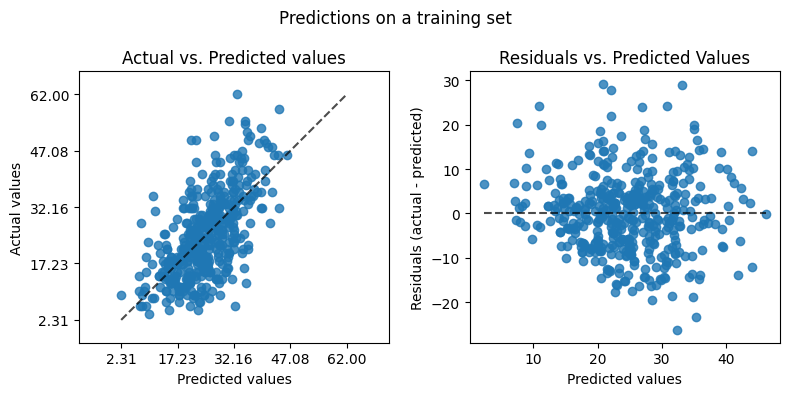

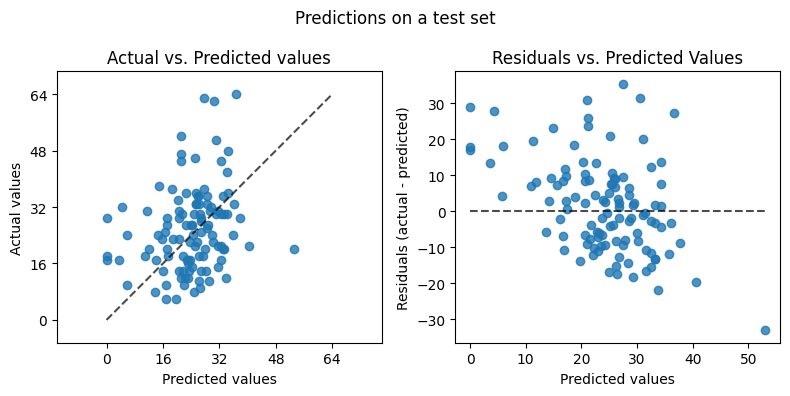

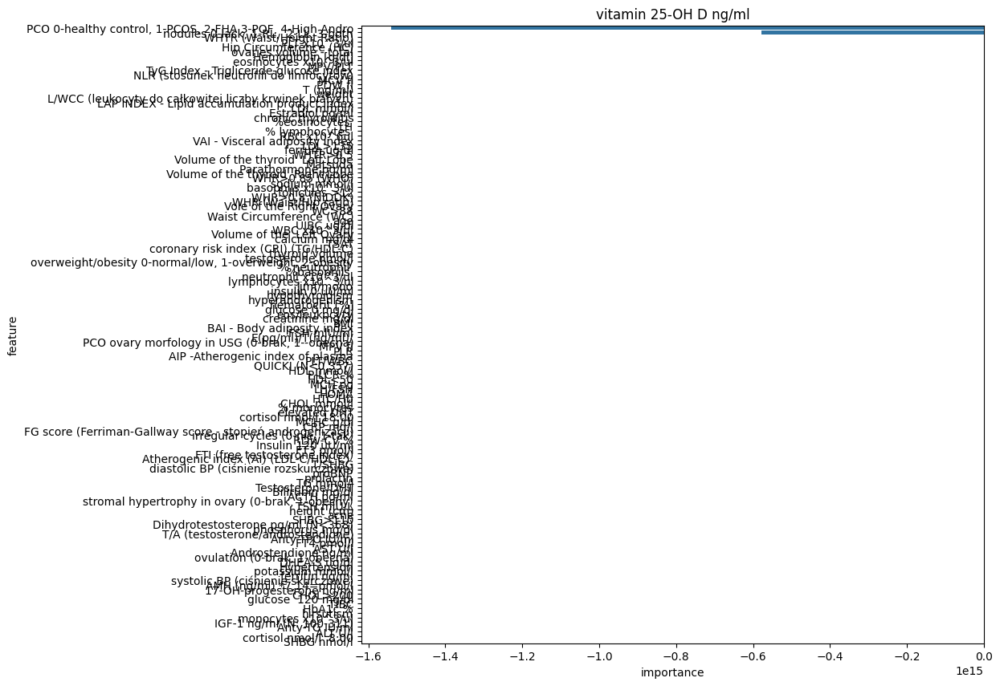

,model,data_set,mse,mae,rmse,r2
0,LinearRegression(),training,76.179,6.810,8.728,0.381
1,LinearRegression(),test,169.742,10.389,13.028,-0.202


In [6]:
lr_model = LinearRegression()

vit_d_model_scores_df, feature_importnces_lr = train_model(lr_model, VITAMINE_D, X_train_vit_d, y_train_vit_d, X_test_vit_d, y_test_vit_d, continuous_preprocessor, categorical_preprocessor, get_feature_importance_lasso)
vit_d_model_scores_df

#### Linear Regression with Polynomial Features

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


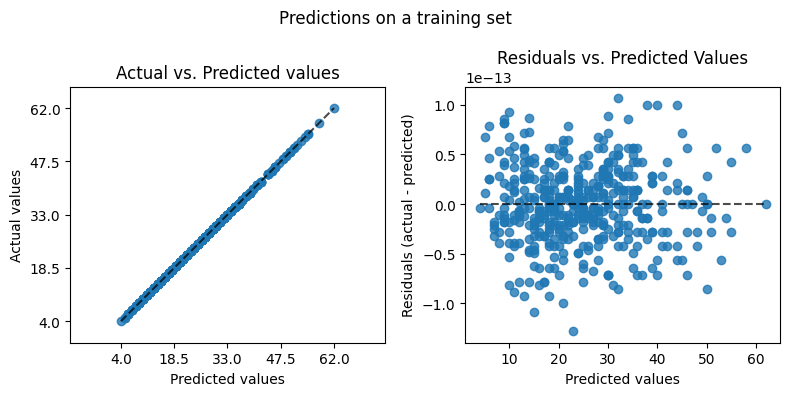

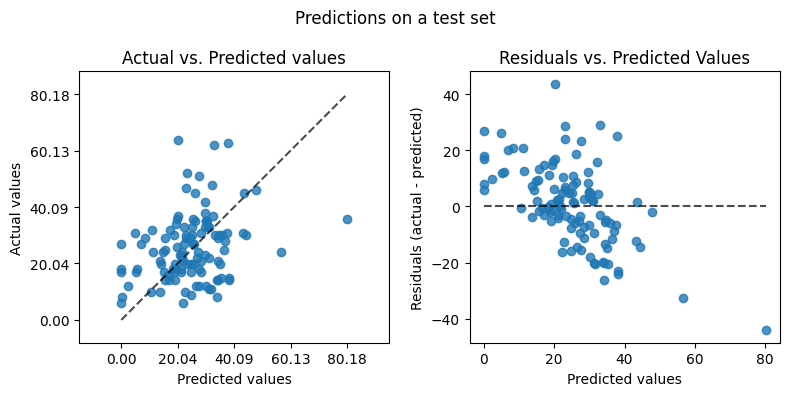

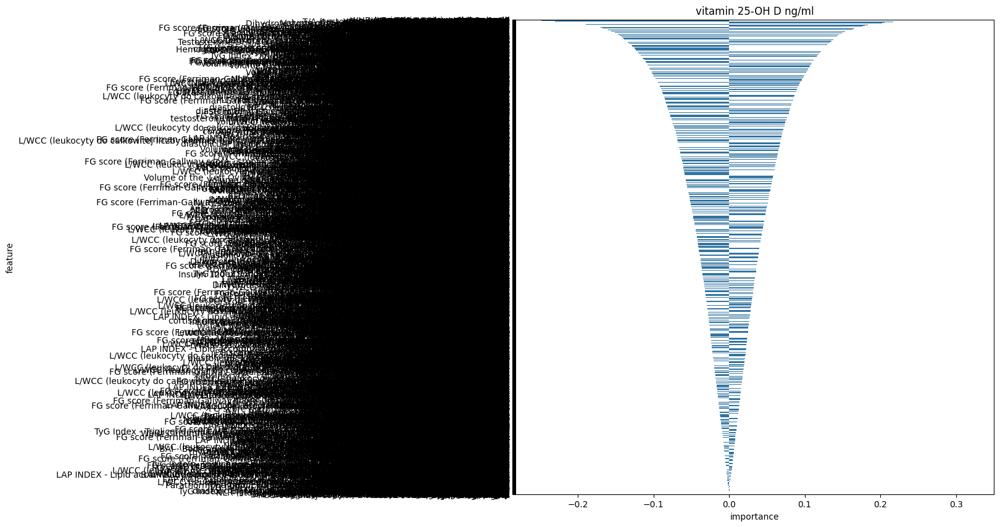

,model,data_set,mse,mae,rmse,r2
0,LinearRegression(),training,0.000,0.000,0.000,1.000
1,LinearRegression(),test,202.441,11.008,14.228,-0.434


In [7]:
lr_model = LinearRegression()

vit_d_model_scores_df, feature_importnces_lr_poly = train_model(lr_model, VITAMINE_D, X_train_vit_d, y_train_vit_d, X_test_vit_d, y_test_vit_d, linear_continuous_preprocessor, categorical_preprocessor, get_feature_importance_lasso)
vit_d_model_scores_df

### Lasso + polynomial features

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


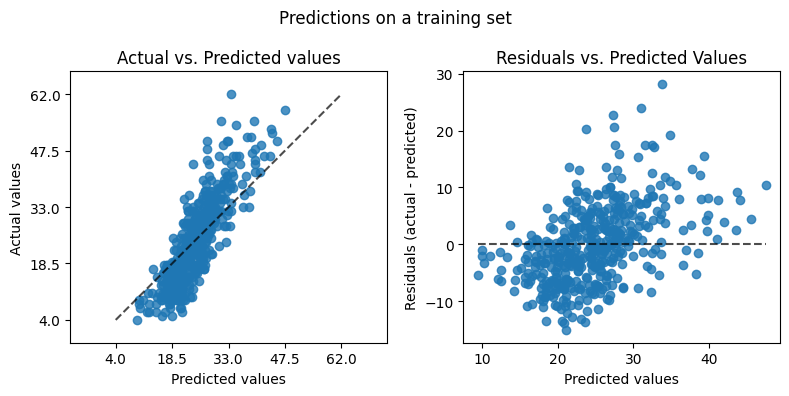

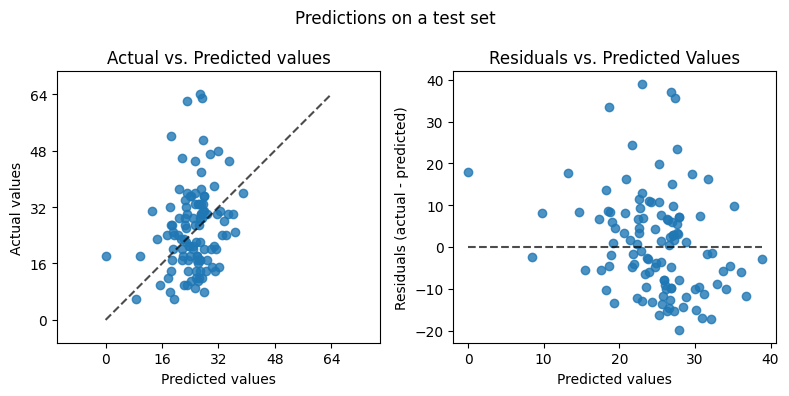

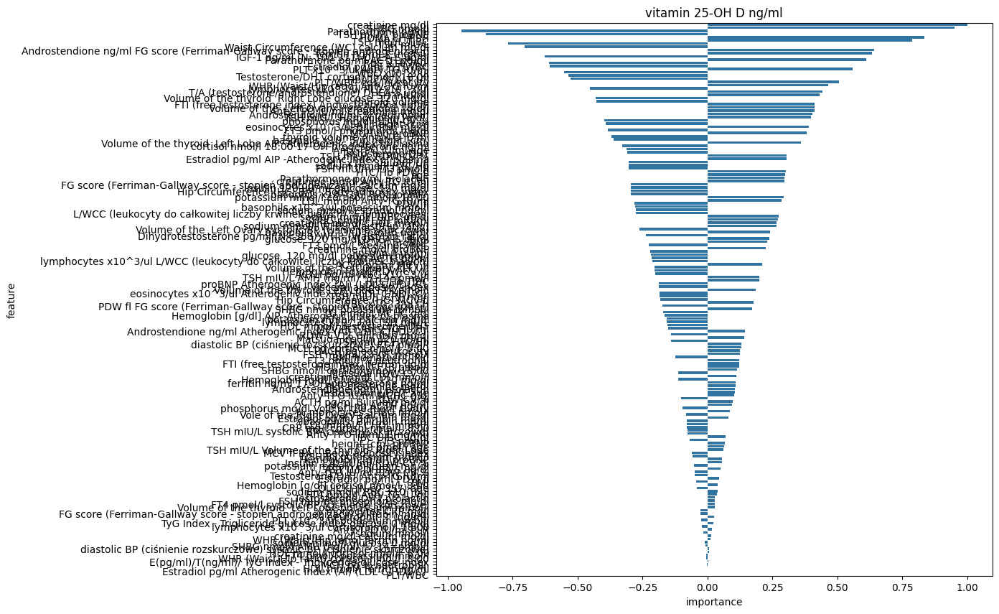

,model,data_set,mse,mae,rmse,r2
0,Lasso(alpha=0.5),training,46.472,5.378,6.817,0.623
1,Lasso(alpha=0.5),test,145.113,9.515,12.046,-0.028


In [13]:
poly_lasso_model = Lasso(alpha=0.5)

vit_d_model_scores_df, feature_importnces_lasso_poly = train_model(poly_lasso_model, VITAMINE_D, X_train_vit_d, y_train_vit_d, X_test_vit_d, y_test_vit_d, linear_continuous_preprocessor, categorical_preprocessor, get_feature_importance_lasso)
vit_d_model_scores_df

### Lasso without polynomial features

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


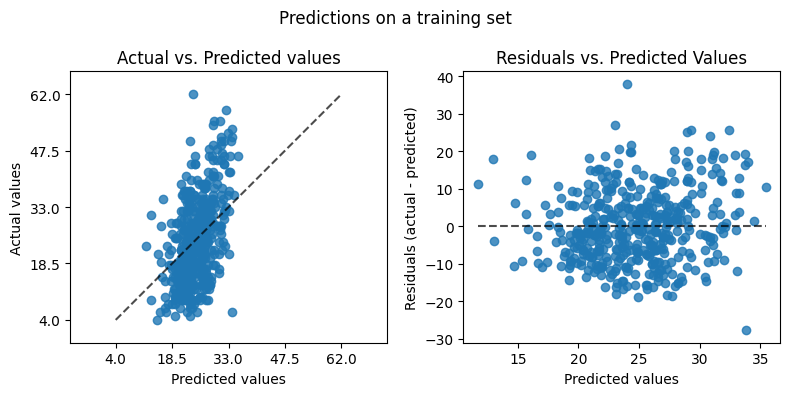

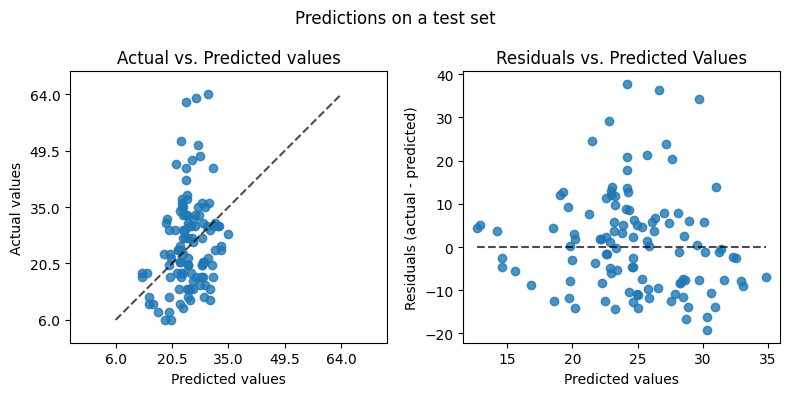

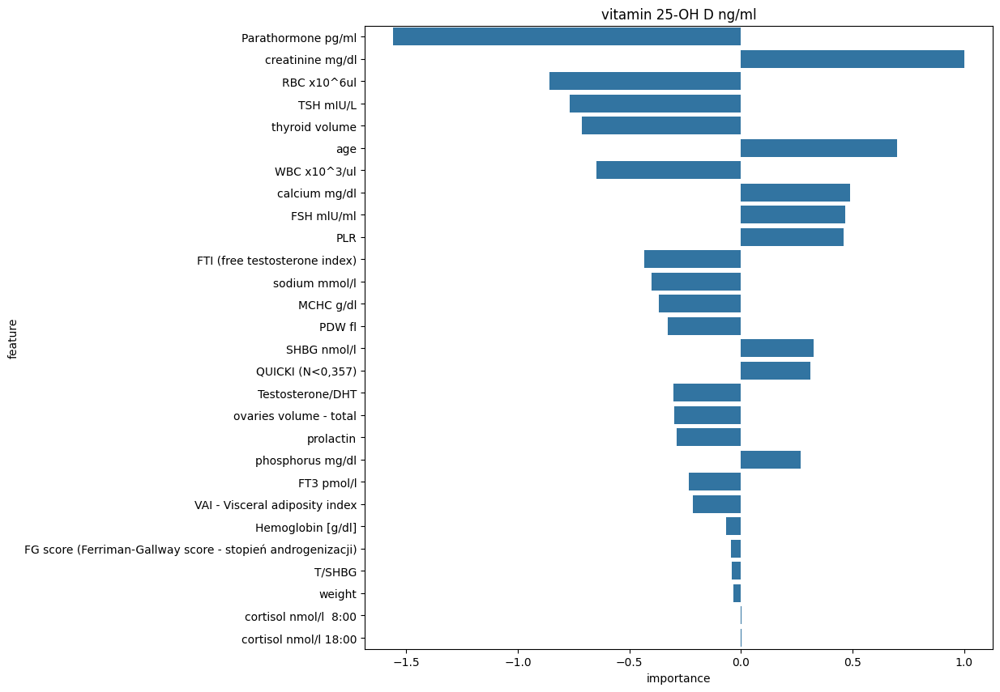

,model,data_set,mse,mae,rmse,r2
0,Lasso(alpha=0.5),training,94.158,7.814,9.704,0.235
1,Lasso(alpha=0.5),test,135.055,9.034,11.621,0.043


In [7]:
lasso_model = Lasso(alpha=0.5)

vit_d_model_scores_df, feature_importnces_lasso = train_model(lasso_model, VITAMINE_D, X_train_vit_d, y_train_vit_d, X_test_vit_d, y_test_vit_d, continuous_preprocessor, categorical_preprocessor, get_feature_importance_lasso)
vit_d_model_scores_df

#### Ridge

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


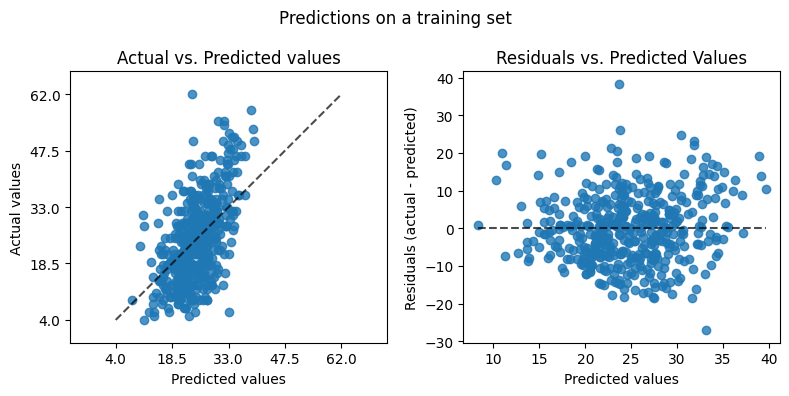

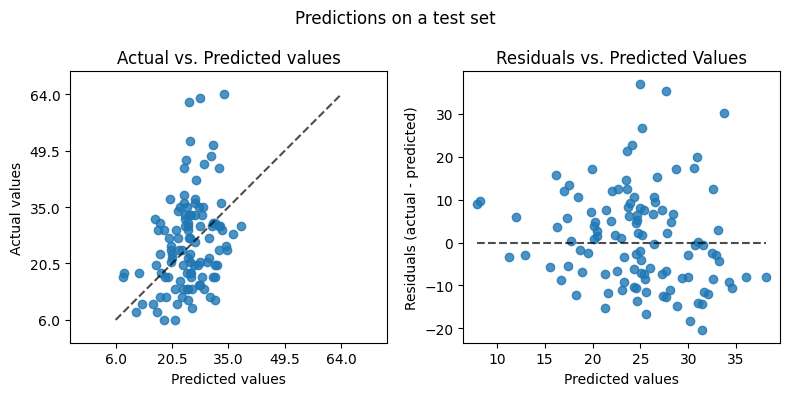

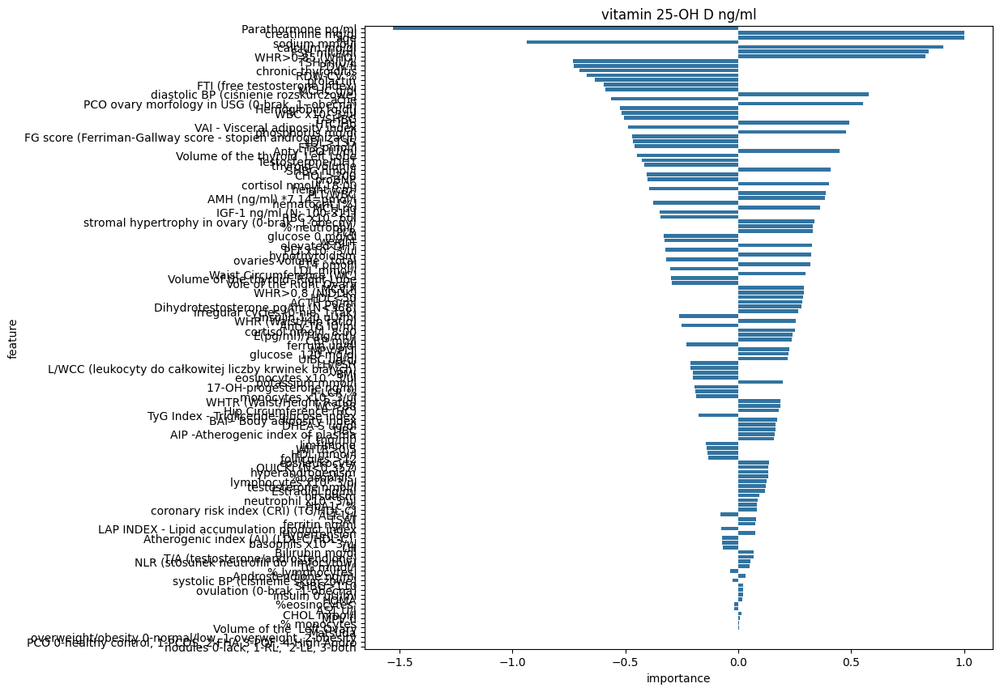

,model,data_set,mse,mae,rmse,r2
0,Ridge(alpha=100),training,83.946,7.303,9.162,0.318
1,Ridge(alpha=100),test,130.886,9.182,11.441,0.073


In [8]:
ridge_model = Ridge(alpha=100)

vit_d_model_scores_df, feature_importnces_ridge = train_model(ridge_model, VITAMINE_D, X_train_vit_d, y_train_vit_d, X_test_vit_d, y_test_vit_d, continuous_preprocessor, categorical_preprocessor, get_feature_importance_lasso)
vit_d_model_scores_df

### KNN


c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


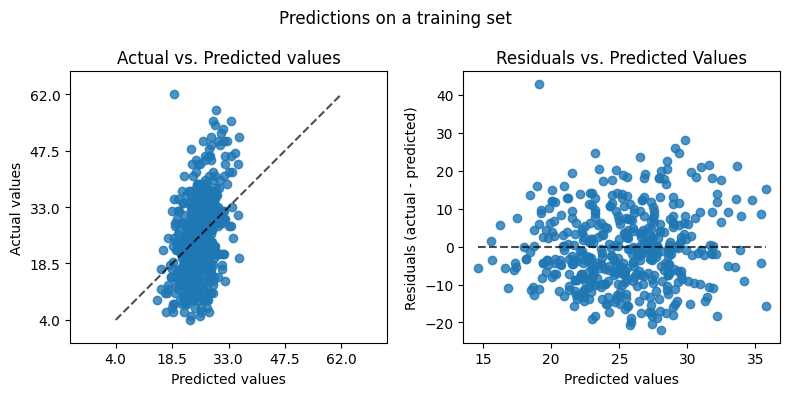

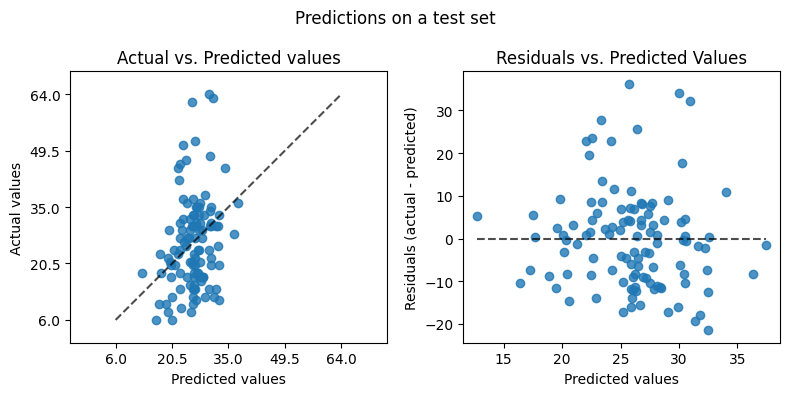

,model,data_set,mse,mae,rmse,r2
0,KNeighborsRegressor(n_neighbors=12),training,102.250,8.167,10.112,0.170
1,KNeighborsRegressor(n_neighbors=12),test,133.918,8.902,11.572,0.052


In [9]:
knn_model = KNeighborsRegressor(n_neighbors=12)
vit_d_model_scores_df, feature_importnces_tree = train_model(knn_model, VITAMINE_D, X_train_vit_d, y_train_vit_d, X_test_vit_d, y_test_vit_d, continuous_preprocessor, categorical_preprocessor, get_feature_importance_knn)
vit_d_model_scores_df

### Decision Tree

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


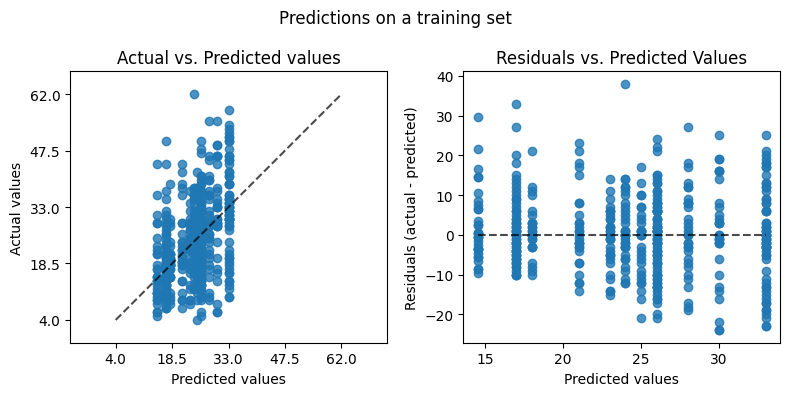

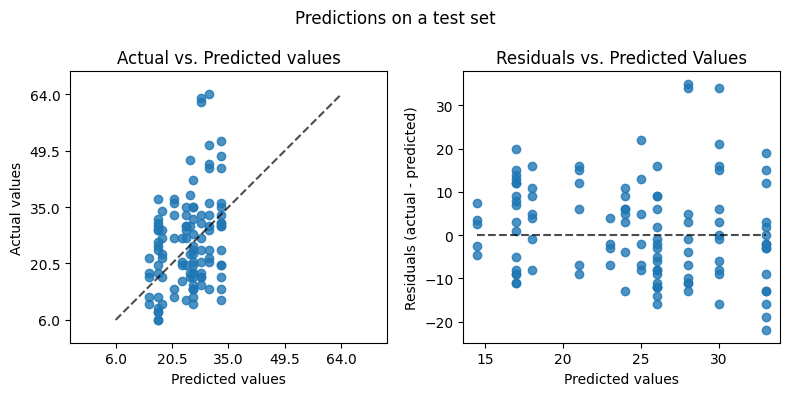

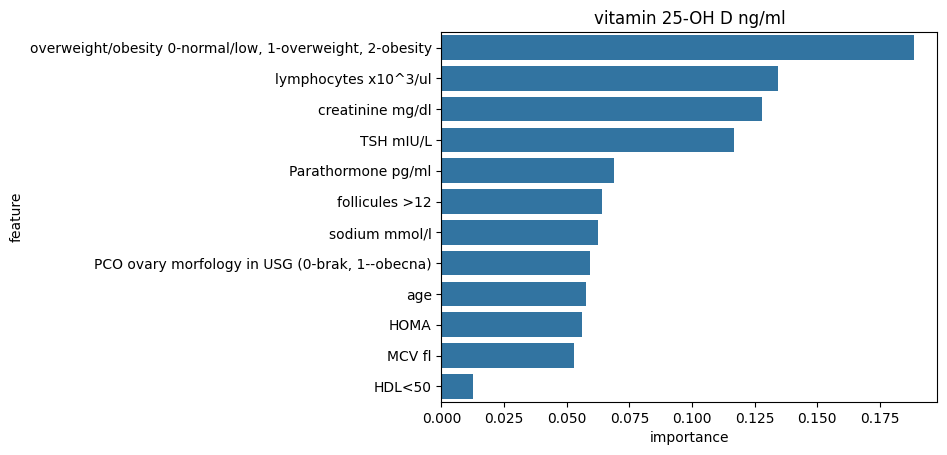

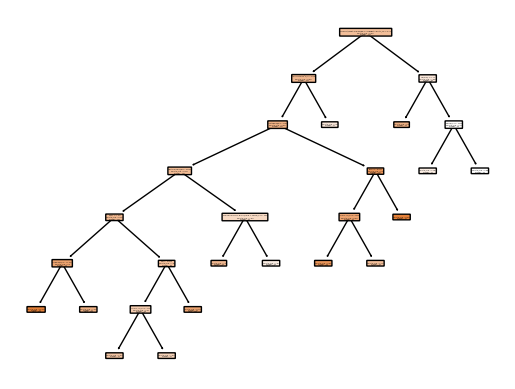

,model,data_set,mse,mae,rmse,r2
0,"DecisionTreeRegressor(criterion='absolute_error', max_depth=8,\n min_samples_leaf=27, min_samples_split=17,\n random_state=62, splitter='random')",training,99.894,7.542,9.995,0.189
1,"DecisionTreeRegressor(criterion='absolute_error', max_depth=8,\n min_samples_leaf=27, min_samples_split=17,\n random_state=62, splitter='random')",test,129.606,9.185,11.384,0.082


In [10]:
tree_model = DecisionTreeRegressor(criterion="absolute_error", max_depth=8, min_samples_leaf=25, min_samples_split=12, splitter='random', random_state=62)
vit_d_model_scores_df, feature_importnces_tree = train_model(tree_model, VITAMINE_D, X_train_vit_d, y_train_vit_d, X_test_vit_d, y_test_vit_d, continuous_preprocessor_tree, categorical_preprocessor, get_feature_importance_tree)
vit_d_model_scores_df

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


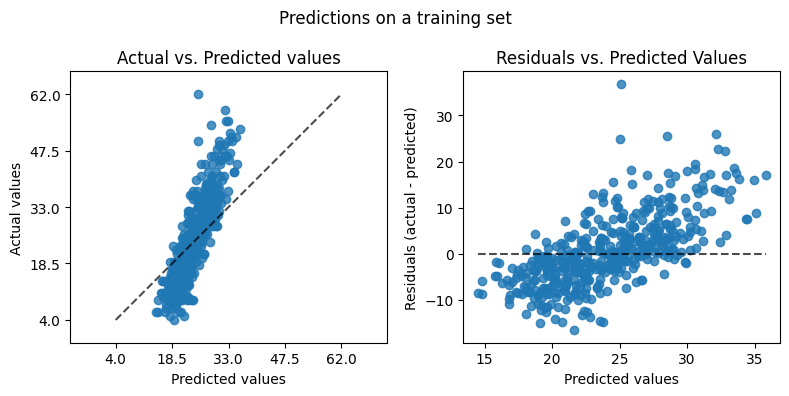

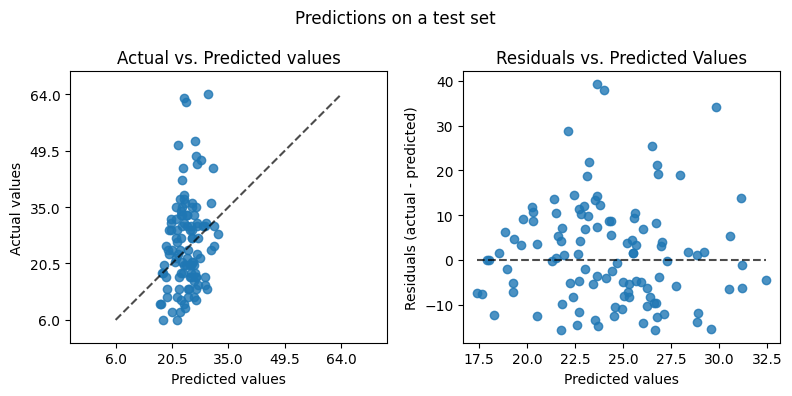

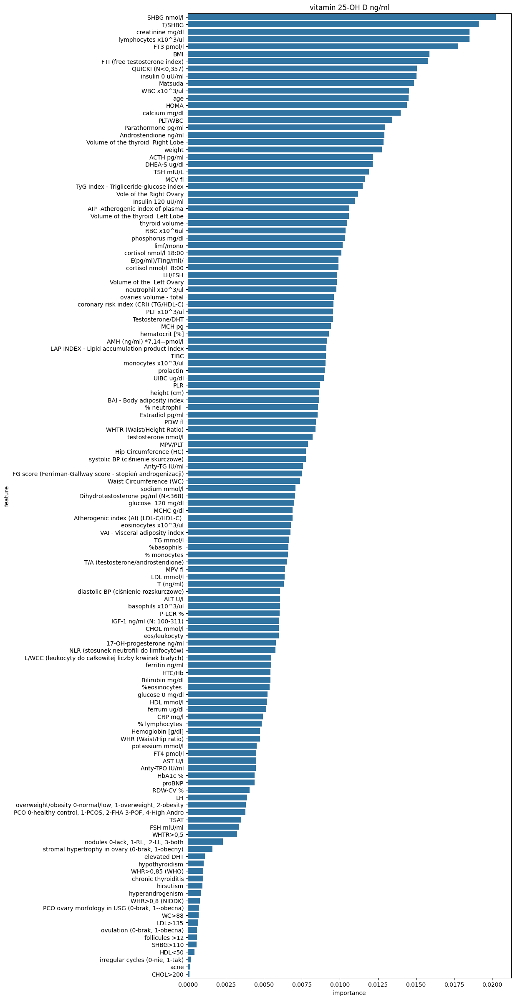

,model,data_set,mse,mae,rmse,r2
0,"RandomForestRegressor(criterion='absolute_error', max_features='sqrt',\n min_samples_leaf=5, min_samples_split=10,\n random_state=56)",training,60.851,5.948,7.801,0.506
1,"RandomForestRegressor(criterion='absolute_error', max_features='sqrt',\n min_samples_leaf=5, min_samples_split=10,\n random_state=56)",test,135.489,9.069,11.640,0.040


In [13]:
rf_model = RandomForestRegressor(n_estimators=100, max_depth=None, max_features='sqrt', min_samples_leaf=5, min_samples_split=10, criterion='absolute_error', random_state=56)
vit_d_model_scores_df, feature_importnces_rf = train_model(rf_model, VITAMINE_D, X_train_vit_d, y_train_vit_d, X_test_vit_d, y_test_vit_d, continuous_preprocessor_tree, categorical_preprocessor, get_feature_importance_rf)
vit_d_model_scores_df

## Best models on subsets of data


In [6]:
def difference_of_sets(set1, set2):
    return set(set1) - set(set2)

featureset_variations = {}

# without the obviously related features
cropped_featureset = list(difference_of_sets(X_vit_d.columns, vitamin_d_associated_features))
featureset_variations['cropped'] = cropped_featureset

# #  inflammatory attributes
# inflammatory_featureset = difference_of_sets(inflammatory_attributes, vitamin_d_associated_features)
# featureset_variations['inflammatory'] = inflammatory_featureset

# #  carbohydrate metabolism attributes
# carbohydrate_metabolism_featureset = difference_of_sets(carbohydrate_metabolism_attributes, vitamin_d_associated_features)
# featureset_variations['carbohydrate_metabolism'] = carbohydrate_metabolism_featureset

In [ ]:
svr_model = SVR(kernel='rbf')

svr_param_grid = {
    'model__C': [10],  # Parametr regularizacji
    'model__gamma': [0.001],  # Współczynnik gamma w funkcji jądra rbf
    'model__epsilon': [0.2, 0.5, 0.7]  # Szerokość rury epsilon
}

svr_hyperparam_tuning_df = hyperparameter_tuning_general(X_train_vit_d[carbohydrate_metabolism_attributes], y_train_vit_d, VITAMINE_D, svr_model, continuous_preprocessor, categorical_preprocessor, svr_param_grid)
svr_hyperparam_tuning_df.sort_values(by='mean_test_score')

Fitting 15 folds for each of 3 candidates, totalling 45 fits
Best parameters: {'model__C': 10, 'model__epsilon': 0.7, 'model__gamma': 0.001}
Best score (neg_mean_absolute_error): -8.710159211295764


,params,mean_train_score,mean_test_score
2,"{'model__C': 10, 'model__epsilon': 0.7, 'model__gamma': 0.001}",8.559474,8.710159
1,"{'model__C': 10, 'model__epsilon': 0.5, 'model__gamma': 0.001}",8.557283,8.711157
0,"{'model__C': 10, 'model__epsilon': 0.2, 'model__gamma': 0.001}",8.556254,8.715322


In [ ]:
knn_model = KNeighborsRegressor()

knn_param_grid = {
    'model__n_neighbors': [7, 12, 13, 14, 16, 17, 18],
}

vit_d_knn_model_hyperparam_tuning_df = hyperparameter_tuning_general(X_train_vit_d[carbohydrate_metabolism_attributes], y_train_vit_d, VITAMINE_D, knn_model, continuous_preprocessor, categorical_preprocessor, knn_param_grid)
vit_d_knn_model_hyperparam_tuning_df.sort_values(by='mean_test_score')

Fitting 15 folds for each of 7 candidates, totalling 105 fits
Best parameters: {'model__n_neighbors': 18}
Best score (neg_mean_absolute_error): -9.035644364998298


,params,mean_train_score,mean_test_score
6,{'model__n_neighbors': 18},8.474721,9.035644
5,{'model__n_neighbors': 17},8.471490,9.057497
4,{'model__n_neighbors': 16},8.472630,9.092582
3,{'model__n_neighbors': 14},8.489429,9.206926
2,{'model__n_neighbors': 13},8.484376,9.249944
1,{'model__n_neighbors': 12},8.442406,9.289517
0,{'model__n_neighbors': 7},8.146786,9.486610


In [ ]:

models = {
    'LinearRegression': (LinearRegression(), get_feature_importance_lasso, continuous_preprocessor),
    'Lasso': (Lasso(alpha=0.5), get_feature_importance_lasso, continuous_preprocessor),
    # "SVR": (SVR(kernel='rbf', C=10, gamma=0.001, epsilon=0.7), get_feature_importance_knn, continuous_preprocessor),
    'Ridge': (Ridge(alpha=50), get_feature_importance_lasso, continuous_preprocessor),
    'DecisionTree': (DecisionTreeRegressor(criterion="absolute_error", max_depth=8, min_samples_leaf=27, min_samples_split=17, splitter='random', random_state=62), get_feature_importance_tree, tree_continuous_preprocessing),
    'RandomForest': (RandomForestRegressor(n_estimators=200, max_depth=None, max_features='sqrt', min_samples_leaf=7, min_samples_split=10, criterion='absolute_error', random_state=56), get_feature_importance_rf, tree_continuous_preprocessing),
    'KNN': (KNeighborsRegressor(n_neighbors=18), get_feature_importance_knn, continuous_preprocessor)
}


for featureset_name, featureset in featureset_variations.items():
    print(f"Featureset: {featureset_name}")
    X_featureset = X_vit_d[list(featureset)]
    X_train_featureset, X_test_featureset, y_train_featureset, y_test_featureset = train_test_split(X_featureset, y_vit_d, test_size=0.2, random_state=42)

    for model_name, (model, feature_importance_method, cont_preprocessor) in models.items():
        print(f"Model: {model_name}")
        # for continuous_preprocessor in [tree_continuous_preprocessing, continuous_preprocessor, linear_continuous_preprocessor]:
        #     print(f"Continuous preprocessor: {continuous_preprocessor}")
        model_scores_df, feature_importances = train_model(model, VITAMINE_D, X_train_featureset, y_train_featureset, X_test_featureset, y_test_featureset, cont_preprocessor, categorical_preprocessor, feature_importance_method)
        print(model_scores_df)
        print()


### Cropped featureset

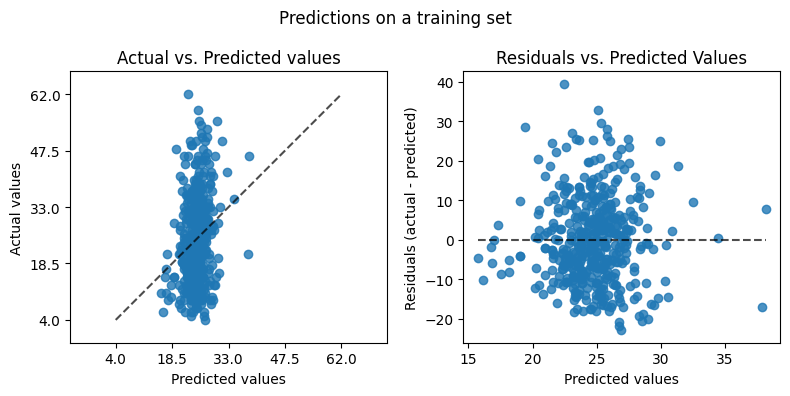

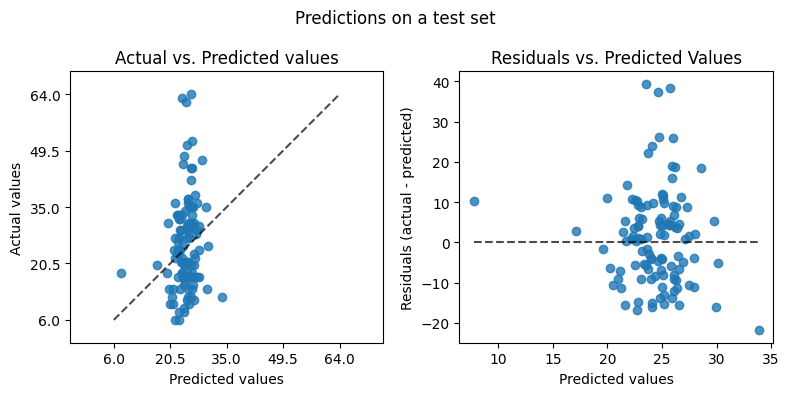

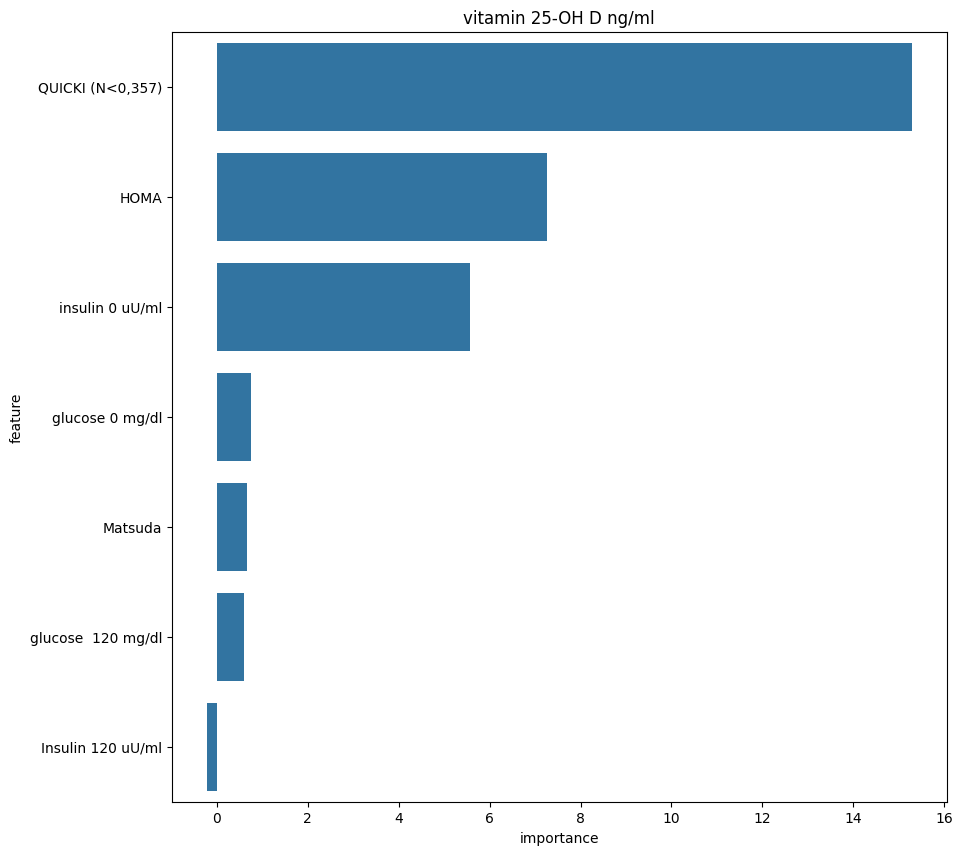

,feature,importance
3,"QUICKI (N<0,357)",15.282653
0,HOMA,7.257848
6,insulin 0 uU/ml,5.575564
5,glucose 0 mg/dl,0.750448
2,Matsuda,0.666714
4,glucose 120 mg/dl,0.595133
1,Insulin 120 uU/ml,-0.216918


In [ ]:

promising_subset = list(featureset_variations['carbohydrate_metabolism'])
# promising_subset = ['nodules 0-lack, 1-RL,  2-LL, 3-both', 'PCO 0-healthy control, 1-PCOS, 2-FHA 3-POF, 4-High Andro', 'overweight/obesity 0-normal/low, 1-overweight, 2-obesity',
                    # 'HDL mmol/l']

X_cropped_train, X_cropped_test, y_cropped_train, y_cropped_test = train_test_split(X_vit_d[promising_subset], y_vit_d, test_size=0.2, random_state=42)

model = LinearRegression()
model_scores_df, feature_importances = train_model(model, VITAMINE_D, X_cropped_train, y_cropped_train, X_cropped_test, y_cropped_test, continuous_preprocessor, categorical_preprocessor, get_feature_importance_lasso)
feature_importances
# [feature_importances['importance'] > 10].sort_values(by='importance', ascending=False)

In [ ]:
# promising_subset = feature_importances[feature_importances['importance'] > 10]['feature'].values


## Feature importances based on Models


#### Original features

In [8]:
#  method: features
selected_features_map = {}

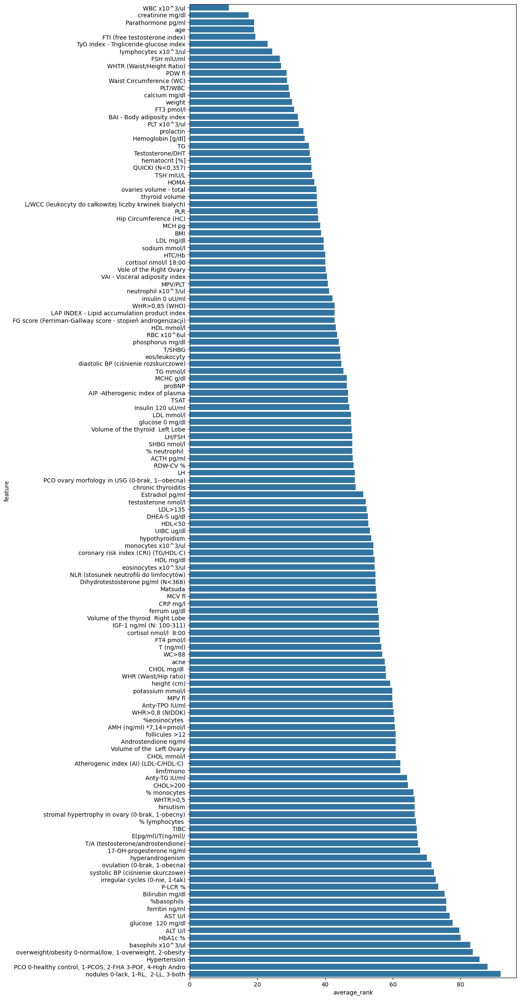

In [ ]:
rename_importnace_col(feature_importnces_lr, 'linear_regression')
rename_importnace_col(feature_importnces_lasso, 'lasso')
rename_importnace_col(feature_importnces_ridge, 'ridge')
rename_importnace_col(feature_importnces_tree, 'tree')
rename_importnace_col(feature_importnces_rf, 'random_forest')

feature_importance_df = merge_feature_importances([feature_importnces_lr, feature_importnces_lasso, feature_importnces_ridge, feature_importnces_tree, feature_importnces_rf])

ranked_df = rank_importances(feature_importance_df)
ranked_df_sorted = ranked_df.sort_values(by='average_rank')

plt.figure(figsize=(10, 30))
sns.barplot(ranked_df_sorted, x="average_rank", y="feature")
plt.show()

In [ ]:
ranked_df_sorted.head(15)

,feature,linear_regression_importance,lasso_importance,ridge_importance,tree_importance,random_forest_importance,average_rank
84,WBC x10^3/ul,26.0,5.0,13.0,13.0,1.0,11.6
100,creatinine mg/dl,55.0,2.0,1.0,13.0,16.0,17.4
63,Parathormone pg/ml,62.0,1.0,2.0,13.0,17.0,19.0
93,age,65.0,4.0,3.0,3.0,20.0,19.0
31,FTI (free testosterone index),57.0,14.0,11.0,13.0,2.0,19.4
77,TyG Index - Trigliceride-glucose index,6.0,26.0,44.0,13.0,26.0,23.0
117,lymphocytes x10^3/ul,16.0,48.0,37.0,13.0,8.0,24.4
28,FSH mlU/ml,41.0,11.0,4.0,13.0,64.0,26.6
89,WHTR (Waist/Height Ratio),13.0,48.0,51.0,13.0,10.0,27.0
59,PDW fl,39.0,13.0,5.0,13.0,73.0,28.6


In [ ]:
overall_rank_top_features = ranked_df_sorted[ranked_df_sorted['average_rank'] < 50] # a cut found on the plot above
overall_rank_selected_features = list(overall_rank_top_features['feature'].values)

selected_features_map['average_rank'] = overall_rank_selected_features
print(f'Top {len(overall_rank_selected_features)} features:')
overall_rank_selected_features

Top 67 features:


['WBC x10^3/ul',
 'creatinine mg/dl',
 'Parathormone pg/ml',
 'age',
 'FTI (free testosterone index)',
 'TyG Index - Trigliceride-glucose index',
 'lymphocytes x10^3/ul',
 'FSH mlU/ml',
 'WHTR (Waist/Height Ratio)',
 'PDW fl',
 'Waist Circumference (WC)',
 'PLT/WBC',
 'calcium mg/dl',
 'weight',
 'FT3 pmol/l',
 'BAI - Body adiposity index',
 'PLT x10^3/ul',
 'prolactin',
 'Hemoglobin [g/dl]',
 'TG',
 'Testosterone/DHT',
 'hematocrit [%]',
 'QUICKI (N<0,357)',
 'TSH mIU/L',
 'HOMA',
 'ovaries volume - total',
 'thyroid volume',
 'L/WCC (leukocyty do całkowitej liczby krwinek białych)',
 'PLR',
 'Hip Circumference (HC)',
 'MCH pg',
 'BMI',
 'LDL mg/dl',
 'sodium mmol/l',
 'HTC/Hb',
 'cortisol nmol/l 18:00',
 'Vole of the Right Ovary',
 'VAI - Visceral adiposity index',
 'MPV/PLT',
 'neutrophil x10^3/ul',
 'insulin 0 uU/ml',
 'WHR>0,85 (WHO)',
 'LAP INDEX - Lipid accumulation product index',
 'FG score (Ferriman-Gallway score - stopień androgenizacji)',
 'HDL mmol/l',
 'RBC x10^6ul',
 'ph

In [ ]:
# overall_rank_top_features = ranked_df_sorted[ranked_df_sorted['average_rank'] < 37] # a cut found on the plot above
# overall_rank_selected_features = list(overall_rank_top_features['feature'].values)

# selected_features_map['average_rank'] = overall_rank_selected_features
# print(f'Top {len(overall_rank_selected_features)} features:')
# overall_rank_selected_features

#### Poly features

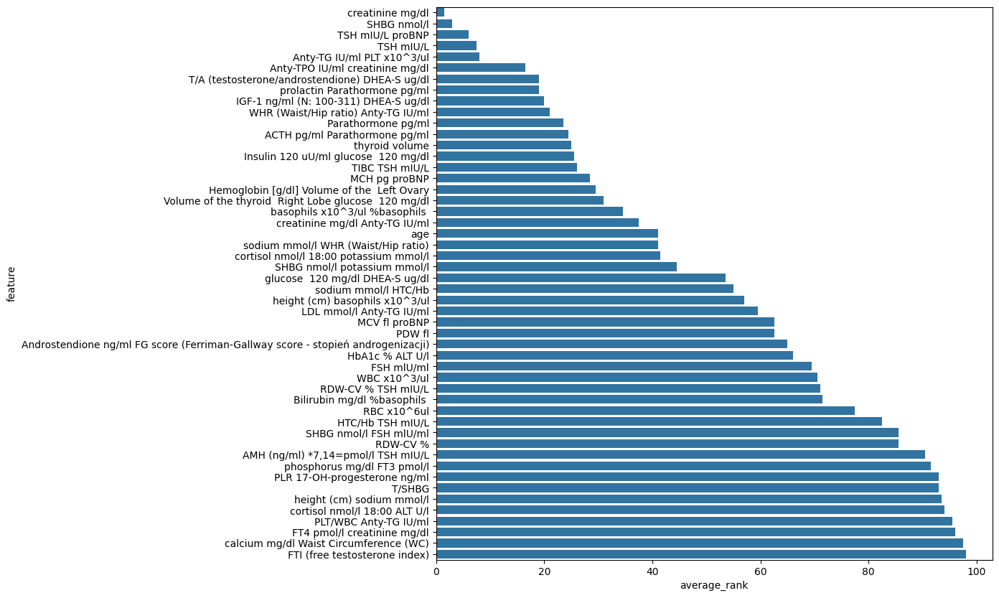

In [ ]:
rename_importnace_col(feature_importnces_lr_poly, 'linear_regression_poly')
rename_importnace_col(feature_importnces_lasso_poly, 'lasso_poly')

feature_importance_poly_df = merge_feature_importances([feature_importnces_lr_poly, feature_importnces_lasso_poly])
ranked_df_poly = rank_importances(feature_importance_poly_df)
ranked_df_poly_sorted = ranked_df_poly.sort_values(by='average_rank')

plt.figure(figsize=(10, 10))
sns.barplot(ranked_df_poly_sorted.head(50), x="average_rank", y="feature")
plt.show()

In [ ]:
# overall_rank_top_poly_features = ranked_df_poly_sorted[ranked_df_poly_sorted['average_rank'] < 27] # a cut found on the plot above
# overall_rank_selected_poly_features = list(overall_rank_top_poly_features['feature'].values)

# selected_features_map['average_rank_poly'] = overall_rank_selected_poly_features

# print(f'Top {len(overall_rank_selected_poly_features)} polynomial features:')
# overall_rank_selected_poly_features

Most important attributes for `vitamin D`: 'creatinine mg/dl', 'Parathormone pg/ml', 'FTI (free testosterone index)', `WBC x10^3/ul	`, `calcium mg/dl	`, `age`

## Feature selection methods

### Mutual info

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


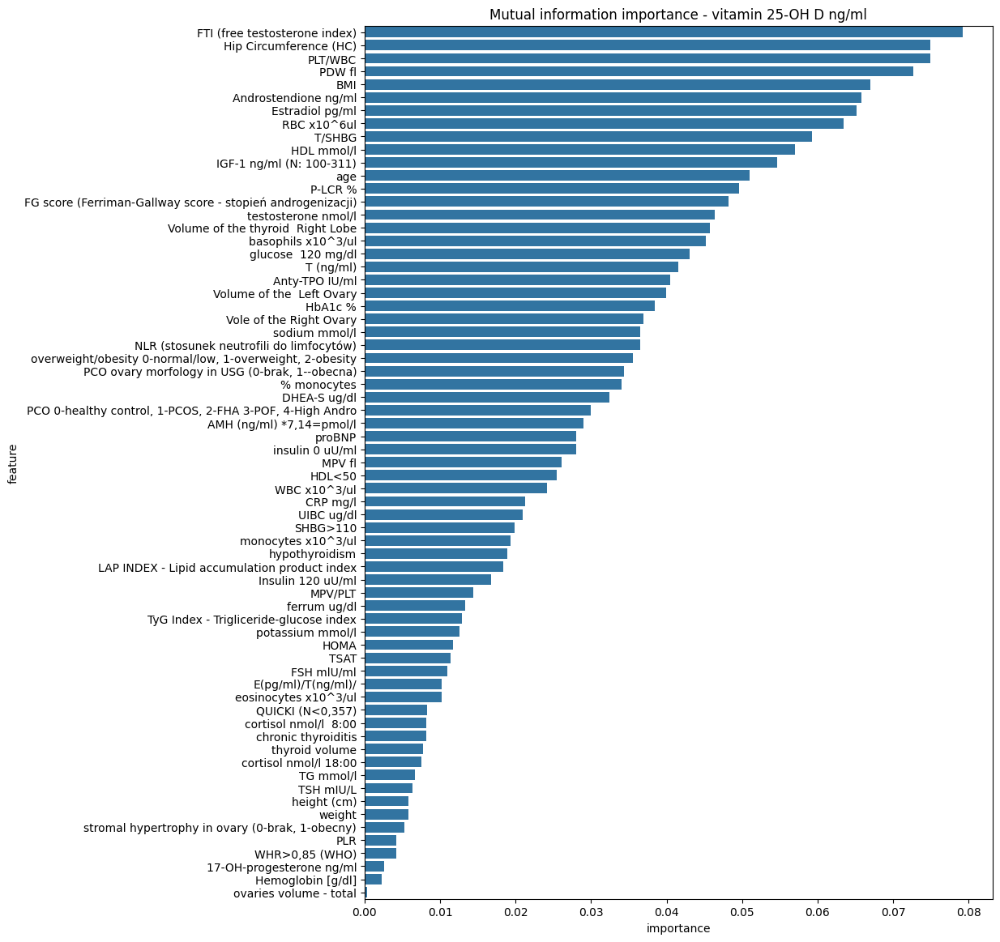

Selected 67


In [12]:
selected_feature_names_mutual_info = feature_selection_mutual_info_regression(X_train_vit_d[cropped_featureset], y_train_vit_d, VITAMINE_D, continuous_preprocessor, categorical_preprocessor, figsize=(10, 14))
selected_feature_names_mutual_info = selected_feature_names_mutual_info[selected_feature_names_mutual_info['importance'] > 0]
selected_feature_names_mutual_info.reset_index(drop=True, inplace=True)
print(f'Selected {len(selected_feature_names_mutual_info)}')
selected_features_map['mutual_info'] = list(selected_feature_names_mutual_info['feature'].values)
# selected_feature_names_mutual_info

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


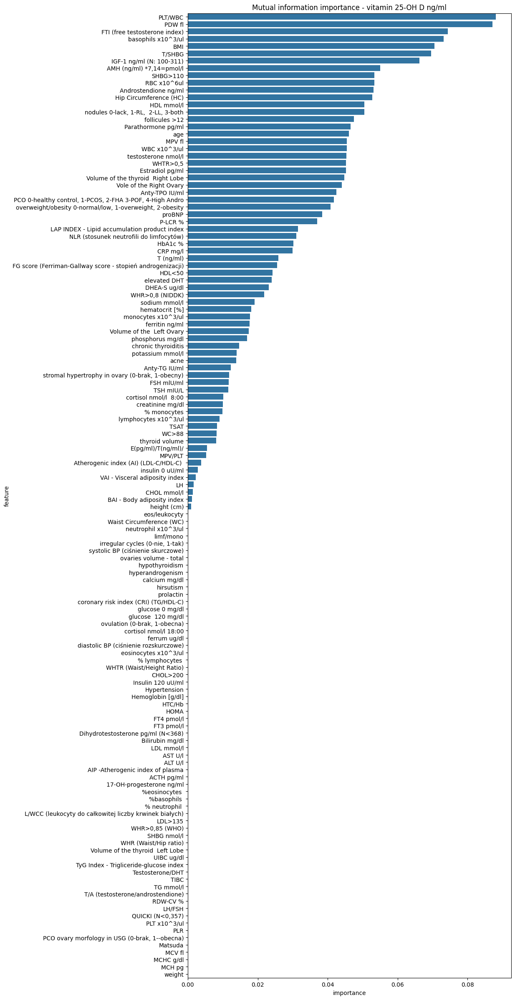

Selected 68


In [22]:
selected_feature_names_mutual_info = feature_selection_mutual_info_regression(X_train_vit_d, y_train_vit_d, VITAMINE_D, continuous_preprocessor, categorical_preprocessor)
selected_feature_names_mutual_info = selected_feature_names_mutual_info[selected_feature_names_mutual_info['importance'] > 0]
selected_feature_names_mutual_info.reset_index(drop=True, inplace=True)
print(f'Selected {len(selected_feature_names_mutual_info)}')
selected_features_map['mutual_info'] = list(selected_feature_names_mutual_info['feature'].values)
# selected_feature_names_mutual_info

### Recursive feature elimination

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


Optimal number of features: 15


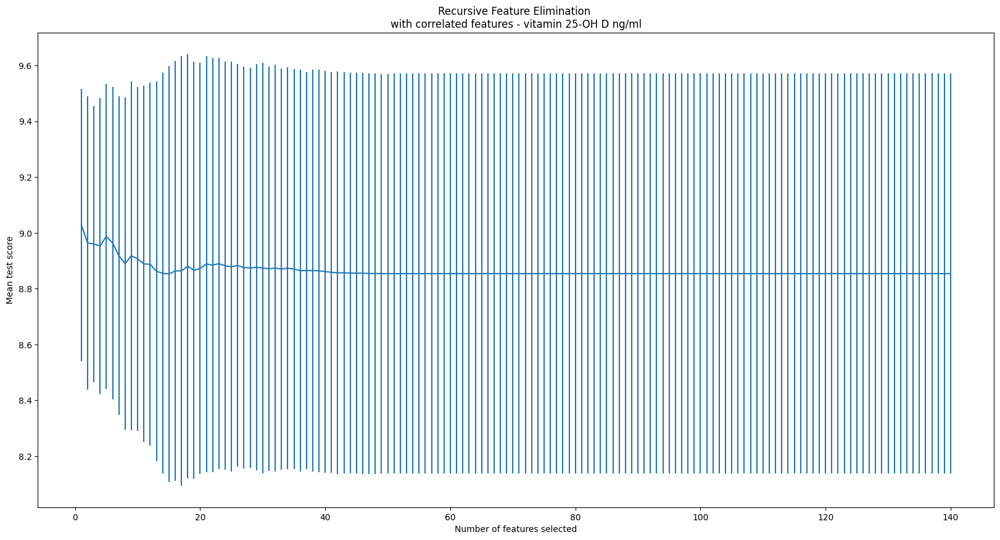

['weight',
 'MCHC g/dl',
 'PCO 0-healthy control, 1-PCOS, 2-FHA 3-POF, 4-High Andro',
 'PDW fl',
 'RBC x10^6ul',
 'thyroid volume',
 'SHBG nmol/l',
 'TSH mIU/L',
 'WBC x10^3/ul',
 'WHR>0,85 (WHO)',
 'age',
 'calcium mg/dl',
 'sodium mmol/l',
 'Testosterone/DHT',
 'FSH mlU/ml']

In [ ]:
lasso_model = Lasso(alpha=0.2)

recursive_feature_elimination_ranked_features_lasso = recursive_feature_elimination(X_train_vit_d[cropped_featureset], y_train_vit_d, lasso_model, VITAMINE_D, continuous_preprocessor, categorical_preprocessor)
selected_features_map['recursive_feature_elimination'] = list(recursive_feature_elimination_ranked_features_lasso[recursive_feature_elimination_ranked_features_lasso['ranking'] == 1]['feature'].values)
selected_features_map['recursive_feature_elimination']

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


Optimal number of features: 35


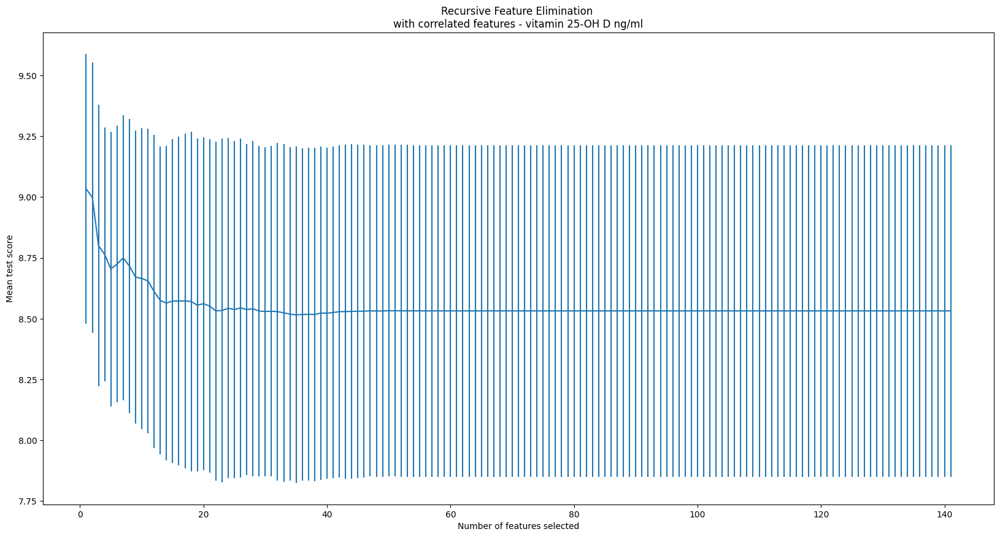

['FSH mlU/ml',
 'FG score (Ferriman-Gallway score - stopień androgenizacji)',
 'FT3 pmol/l',
 'FTI (free testosterone index)',
 'WHR>0,85 (WHO)',
 'WBC x10^3/ul',
 'Volume of the thyroid  Left Lobe',
 'Vole of the Right Ovary',
 'TyG Index - Trigliceride-glucose index',
 'age',
 'Testosterone/DHT',
 'TSH mIU/L',
 'LDL mmol/l',
 'thyroid volume',
 'SHBG nmol/l',
 'RDW-CV %',
 'MCHC g/dl',
 'RBC x10^6ul',
 'Parathormone pg/ml',
 'IGF-1 ng/ml (N: 100-311)',
 'Dihydrotestosterone pg/ml (N<368)',
 'PDW fl',
 'chronic thyroiditis',
 'overweight/obesity 0-normal/low, 1-overweight, 2-obesity',
 'prolactin',
 'calcium mg/dl',
 'height (cm)',
 'proBNP',
 'Anty-TPO IU/ml',
 'diastolic BP (ciśnienie rozskurczowe)',
 'phosphorus mg/dl',
 'cortisol nmol/l 18:00',
 '% neutrophil ',
 'sodium mmol/l',
 'creatinine mg/dl']

In [9]:
lasso_model = Lasso(alpha=0.2)

recursive_feature_elimination_ranked_features_lasso = recursive_feature_elimination(X_train_vit_d, y_train_vit_d, lasso_model, VITAMINE_D, continuous_preprocessor, categorical_preprocessor)
selected_features_map['recursive_feature_elimination'] = list(recursive_feature_elimination_ranked_features_lasso[recursive_feature_elimination_ranked_features_lasso['ranking'] == 1]['feature'].values)
selected_features_map['recursive_feature_elimination']

### Permutation importance

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


selected 129 features


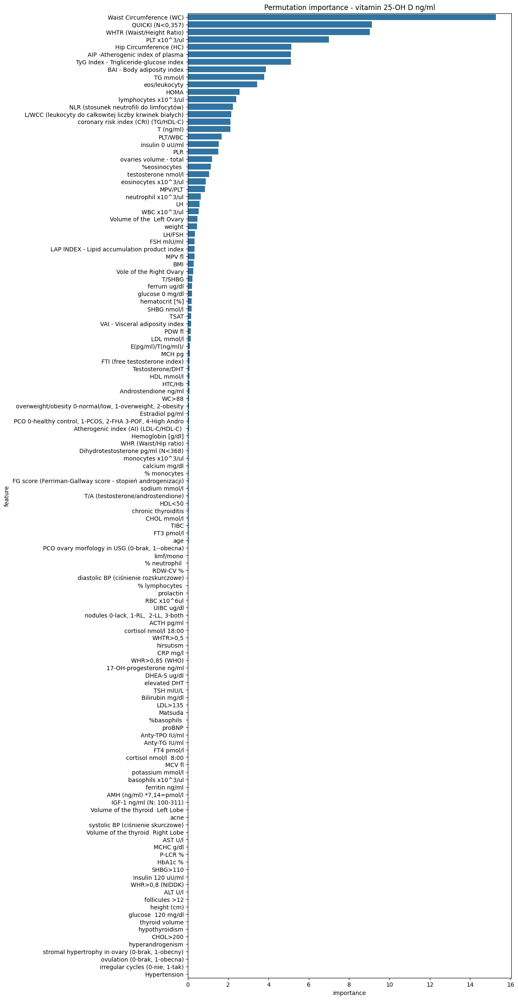

Actually selected 129 features


In [13]:
lasso_model = LinearRegression()

selected_features_permutation_importance = get_permutation_importance(X_train_vit_d[cropped_featureset], y_train_vit_d, lasso_model, continuous_preprocessor, categorical_preprocessor, VITAMINE_D)
selected_features_permutation_importance = selected_features_permutation_importance[selected_features_permutation_importance['importance'] > 0.001]
selected_features_map['permutation_importance'] = list(selected_features_permutation_importance['feature'].values)
# selected_features_map['permutation_importance'] = list(selected_features_permutation_importance[selected_features_permutation_importance['importance'] > 0.001]['feature'].values)
print(f'Actually selected {len(selected_features_map['permutation_importance'])} features')
# selected_features_permutation_importance

In [16]:
len(selected_features_permutation_importance)

38

In [15]:
selected_features_permutation_importance = selected_features_permutation_importance[selected_features_permutation_importance['importance'] > 0.2]
selected_features_map['permutation_importance'] = list(selected_features_permutation_importance['feature'].values)

,feature,importance
38,Waist Circumference (WC),15.273834
97,"QUICKI (N<0,357)",9.136402
40,WHTR (Waist/Height Ratio),9.014205
9,PLT x10^3/ul,7.004967
100,Hip Circumference (HC),5.128391
112,AIP -Atherogenic index of plasma,5.120495
96,TyG Index - Trigliceride-glucose index,5.120264
10,BAI - Body adiposity index,3.877624
6,TG mmol/l,3.787436
105,eos/leukocyty,3.439616


c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


selected 130 features


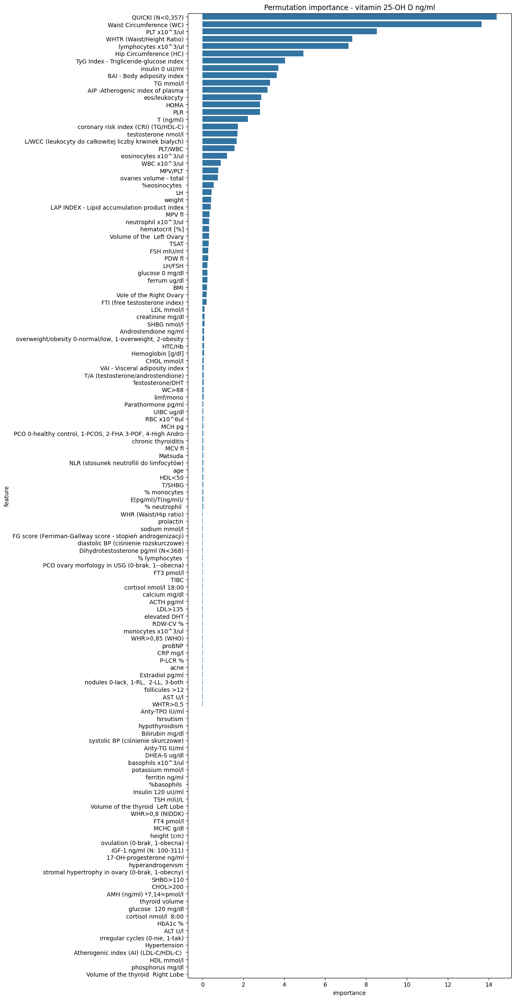

Actually selected 127 features


In [23]:
lasso_model = LinearRegression()

selected_features_permutation_importance = get_permutation_importance(X_train_vit_d, y_train_vit_d, lasso_model, continuous_preprocessor, categorical_preprocessor, VITAMINE_D)
selected_features_permutation_importance = selected_features_permutation_importance[selected_features_permutation_importance['importance'] > 0.15]
selected_features_map['permutation_importance'] = list(selected_features_permutation_importance['feature'].values)
# selected_features_map['permutation_importance'] = list(selected_features_permutation_importance[selected_features_permutation_importance['importance'] > 0.001]['feature'].values)
print(f'Actually selected {len(selected_features_map['permutation_importance'])} features')
# selected_features_permutation_importance

In [25]:
selected_features_permutation_importance = selected_features_permutation_importance[selected_features_permutation_importance['importance'] > 0.15]
selected_features_map['permutation_importance'] = list(selected_features_permutation_importance['feature'].values)

In [27]:
len(selected_features_map['permutation_importance'])

40

In [28]:
strict_permutation_importance_subset = list(selected_features_permutation_importance[selected_features_permutation_importance['importance'] > 0.5]['feature'].values)
len(strict_permutation_importance_subset)

24

In [17]:
#  mutual info & permutation importance:

intersection_all_sets = set(selected_features_map[next(iter(selected_features_map))])

for key, items in selected_features_map.items():
    intersection_all_sets.intersection_update(items)


intersection_all_sets = list(intersection_all_sets)
print(len(intersection_all_sets))
print(intersection_all_sets)

pd.DataFrame(intersection_all_sets)

24
['WBC x10^3/ul', 'TyG Index - Trigliceride-glucose index', 'FSH mlU/ml', 'QUICKI (N<0,357)', 'Hip Circumference (HC)', 'ferrum ug/dl', 'TG mmol/l', 'ovaries volume - total', 'NLR (stosunek neutrofili do limfocytów)', 'T (ng/ml)', 'testosterone nmol/l', 'Vole of the Right Ovary', 'insulin 0 uU/ml', 'eosinocytes x10^3/ul', 'PLT/WBC', 'Volume of the  Left Ovary', 'LAP INDEX - Lipid accumulation product index', 'BMI', 'HOMA', 'T/SHBG', 'MPV fl', 'weight', 'MPV/PLT', 'PLR']


,0
0,WBC x10^3/ul
1,TyG Index - Trigliceride-glucose index
2,FSH mlU/ml
3,"QUICKI (N<0,357)"
4,Hip Circumference (HC)
5,ferrum ug/dl
6,TG mmol/l
7,ovaries volume - total
8,NLR (stosunek neutrofili do limfocytów)
9,T (ng/ml)


In [ ]:
#  NOTE: actually all sets:
intersection_all_sets = set(selected_features_map[next(iter(selected_features_map))])

for key, items in selected_features_map.items():
    intersection_all_sets.intersection_update(items)


intersection_all_sets = list(intersection_all_sets)
print(len(intersection_all_sets))
print(intersection_all_sets)

pd.DataFrame(intersection_all_sets)

16
['PCO 0-healthy control, 1-PCOS, 2-FHA 3-POF, 4-High Andro', 'TSH mIU/L', 'FTI (free testosterone index)', 'creatinine mg/dl', 'sodium mmol/l', 'Parathormone pg/ml', 'height (cm)', 'PDW fl', 'FSH mlU/ml', 'thyroid volume', 'age', 'phosphorus mg/dl', 'WBC x10^3/ul', 'RBC x10^6ul', 'FG score (Ferriman-Gallway score - stopień androgenizacji)', 'IGF-1 ng/ml (N: 100-311)']


,0
0,"PCO 0-healthy control, 1-PCOS, 2-FHA 3-POF, 4-High Andro"
1,TSH mIU/L
2,FTI (free testosterone index)
3,creatinine mg/dl
4,sodium mmol/l
5,Parathormone pg/ml
6,height (cm)
7,PDW fl
8,FSH mlU/ml
9,thyroid volume


In [49]:
union_all_sets = set(selected_features_map[next(iter(selected_features_map))]) 

for key, items in selected_features_map.items():
    union_all_sets.update(items)
    

union_all_sets = list(union_all_sets)
print(len(union_all_sets))
print(union_all_sets)

88
['PCO 0-healthy control, 1-PCOS, 2-FHA 3-POF, 4-High Andro', 'Waist Circumference (WC)', 'Hip Circumference (HC)', 'SHBG>110', 'lymphocytes x10^3/ul', 'sodium mmol/l', 'Parathormone pg/ml', 'TSAT', 'TSH mIU/L', 'WHR>0,8 (NIDDK)', 'PLT x10^3/ul', 'QUICKI (N<0,357)', 'Anty-TPO IU/ml', '% monocytes', 'eosinocytes x10^3/ul', 'FTI (free testosterone index)', 'Estradiol pg/ml', 'ferrum ug/dl', 'Volume of the  Left Ovary', 'neutrophil x10^3/ul', 'Volume of the thyroid  Right Lobe', 'BMI', 'PLT/WBC', 'chronic thyroiditis', 'CRP mg/l', 'weight', 'HbA1c %', 'IGF-1 ng/ml (N: 100-311)', 'basophils x10^3/ul', 'thyroid volume', 'stromal hypertrophy in ovary (0-brak, 1-obecny)', 'L/WCC (leukocyty do całkowitej liczby krwinek białych)', 'FSH mlU/ml', 'PLR', 'HDL mmol/l', 'E(pg/ml)/T(ng/ml)/', 'elevated DHT', 'VAI - Visceral adiposity index', 'RBC x10^6ul', 'WBC x10^3/ul', 'insulin 0 uU/ml', 'PDW fl', '%eosinocytes ', 'cortisol nmol/l  8:00', 'HOMA', 'TyG Index - Trigliceride-glucose index', 'age', 

### Mutual Info

### SFS mutual info backward

In [18]:
from sklearn.feature_selection import SequentialFeatureSelector as SFS


sfs = SFS(
    estimator = RandomForestRegressor(n_estimators=100, random_state=10), 
    n_features_to_select="auto",
    tol=0.001,
    direction='backward',
    scoring='r2',
    cv=3,
    n_jobs=-1
)

sfs = sfs.fit(X_train_vit_d[selected_features_map['mutual_info']], y_train_vit_d)

In [19]:
best_features = sfs.get_feature_names_out()
len(best_features), best_features

(66,
 array(['FTI (free testosterone index)', 'Hip Circumference (HC)',
        'PLT/WBC', 'PDW fl', 'BMI', 'Androstendione ng/ml',
        'Estradiol pg/ml', 'RBC x10^6ul', 'T/SHBG', 'HDL mmol/l',
        'IGF-1 ng/ml (N: 100-311)', 'age', 'P-LCR %',
        'FG score (Ferriman-Gallway score - stopień androgenizacji)',
        'testosterone nmol/l', 'Volume of the thyroid  Right Lobe',
        'basophils x10^3/ul', 'glucose  120 mg/dl', 'T (ng/ml)',
        'Anty-TPO IU/ml', 'Volume of the  Left Ovary', 'HbA1c %',
        'sodium mmol/l', 'NLR (stosunek neutrofili do limfocytów)',
        'overweight/obesity 0-normal/low, 1-overweight, 2-obesity',
        'PCO ovary morfology in USG (0-brak, 1--obecna)', '% monocytes',
        'DHEA-S ug/dl',
        'PCO 0-healthy control, 1-PCOS, 2-FHA 3-POF, 4-High Andro',
        'AMH (ng/ml) *7,14=pmol/l', 'proBNP', 'insulin 0 uU/ml', 'MPV fl',
        'HDL<50', 'WBC x10^3/ul', 'CRP mg/l', 'UIBC ug/dl', 'SHBG>110',
        'monocytes x10^3/ul', '

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


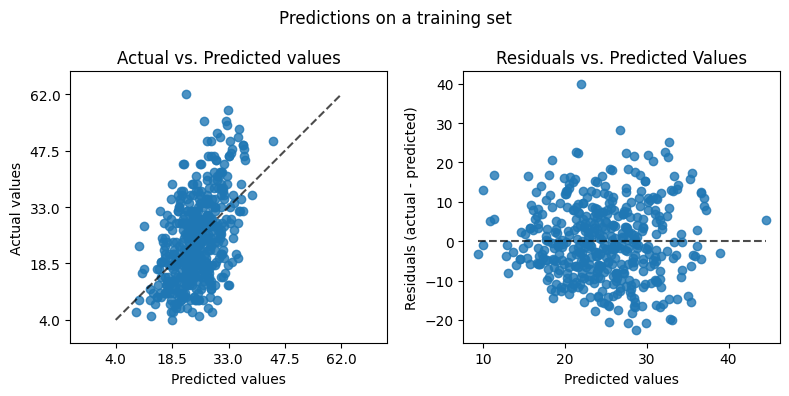

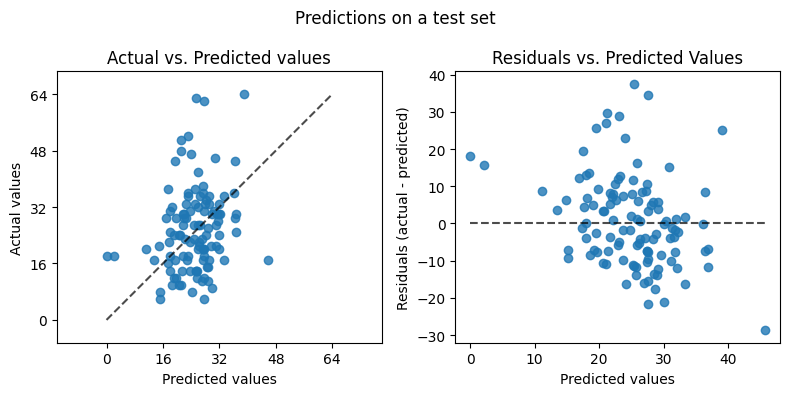

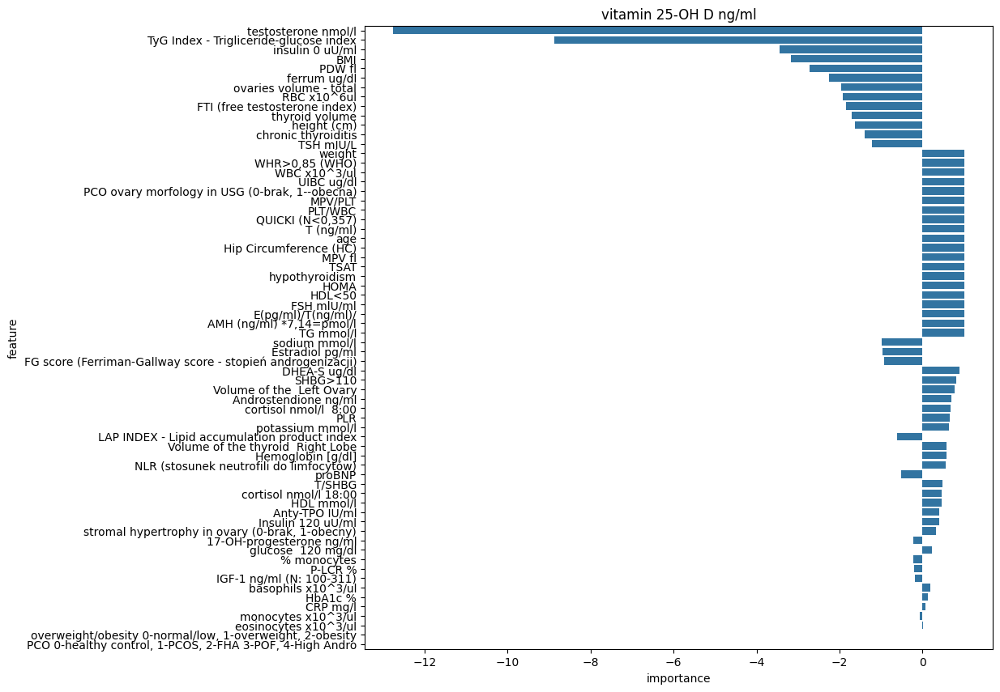

,model,data_set,mse,mae,rmse,r2
0,LinearRegression(),training,92.566,7.750,9.621,0.248
1,LinearRegression(),test,150.424,9.629,12.265,-0.065


In [20]:
feature_subset = best_features

lasso_model = LinearRegression()

vit_d_model_scores_df, feature_importnces_lasso = train_model(lasso_model, VITAMINE_D, X_train_vit_d[feature_subset], y_train_vit_d, X_test_vit_d[feature_subset], y_test_vit_d, continuous_preprocessor, categorical_preprocessor, get_feature_importance_lasso)
vit_d_model_scores_df

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


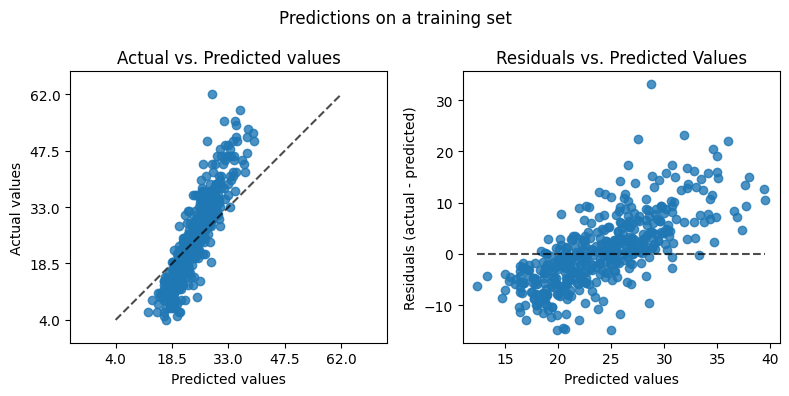

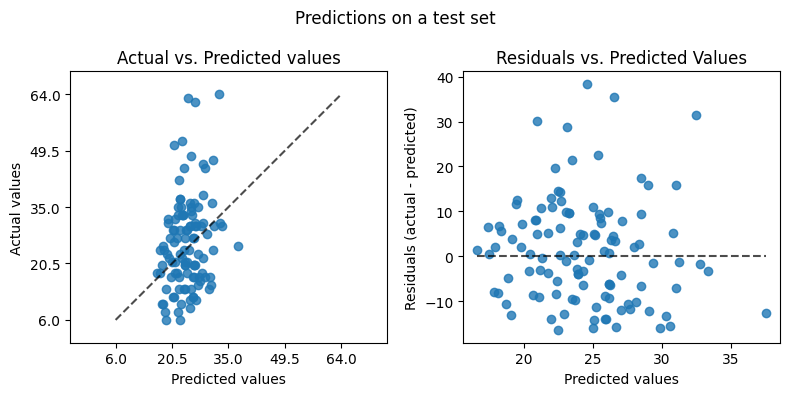

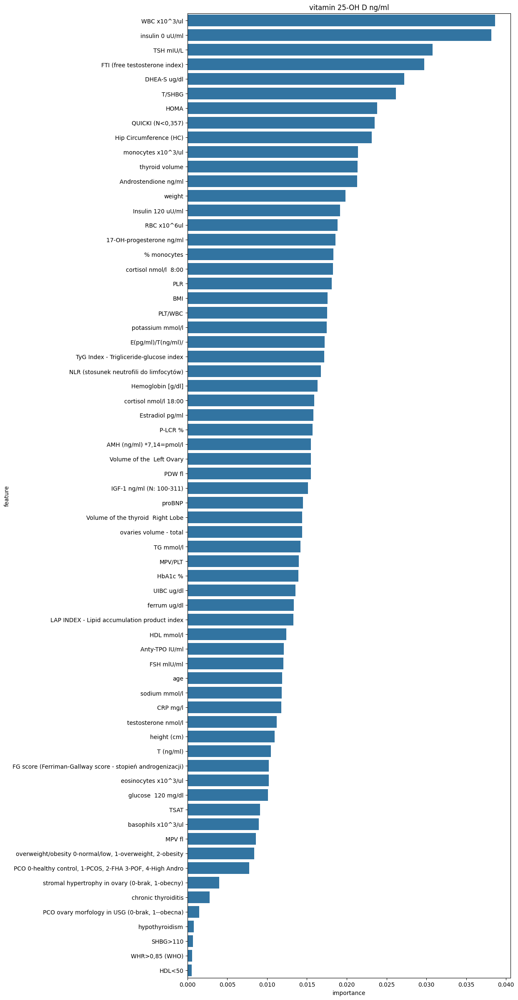

,model,data_set,mse,mae,rmse,r2
0,"RandomForestRegressor(criterion='absolute_error', max_features='sqrt',\n min_samples_leaf=3, min_samples_split=3, random_state=56)",training,48.289,5.310,6.949,0.608
1,"RandomForestRegressor(criterion='absolute_error', max_features='sqrt',\n min_samples_leaf=3, min_samples_split=3, random_state=56)",test,136.239,9.178,11.672,0.035


In [39]:
feature_subset = best_features

rf_model = RandomForestRegressor(n_estimators=100, max_depth=None, max_features='sqrt', min_samples_leaf=3, min_samples_split=3, criterion='absolute_error', random_state=56)
vit_d_model_scores_df, feature_importnces_rf = train_model(rf_model, VITAMINE_D, X_train_vit_d[feature_subset], y_train_vit_d, X_test_vit_d[feature_subset], y_test_vit_d, continuous_preprocessor_tree, categorical_preprocessor, get_feature_importance_rf)
vit_d_model_scores_df

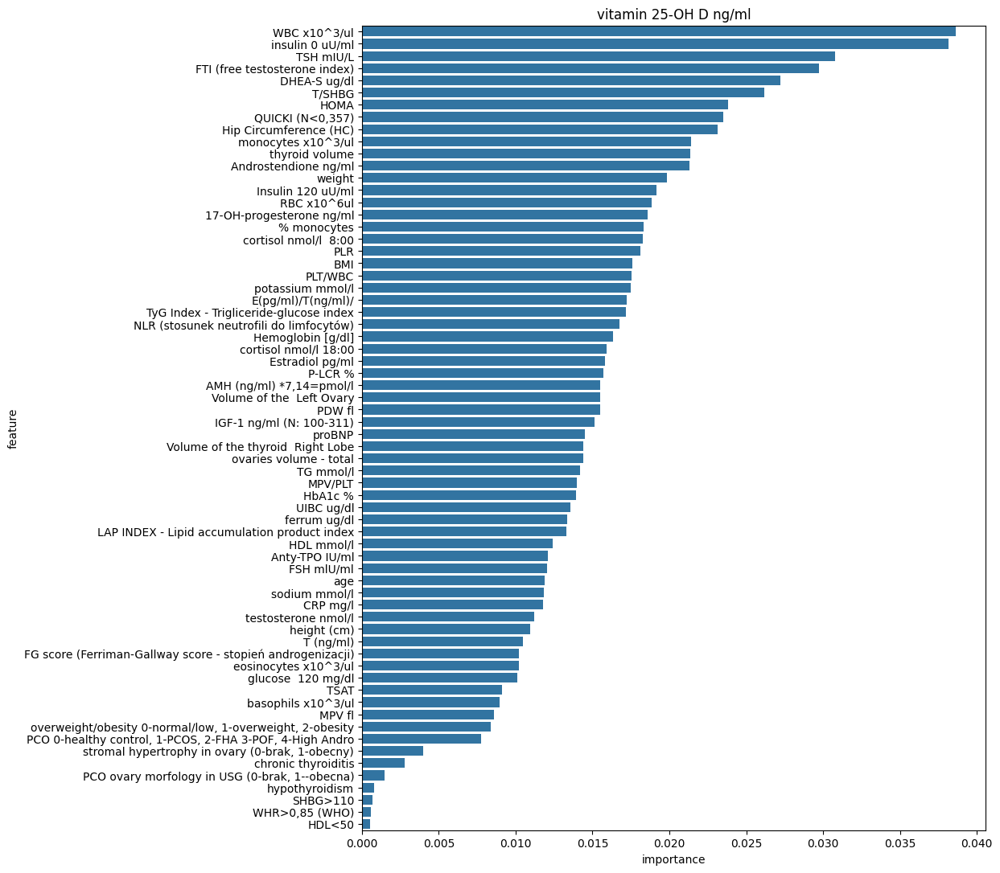

In [42]:
feature_importnces_rf

plt.figure(figsize=(10, 13))
sns.barplot(feature_importnces_rf, x="importance", y="feature").set(title=VITAMINE_D)
plt.show()


c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


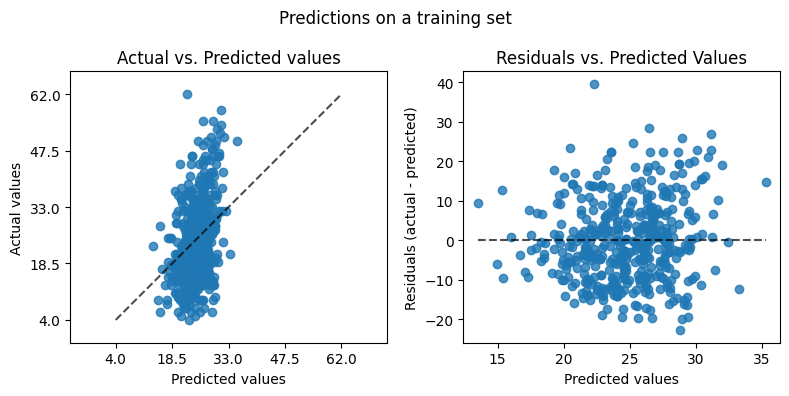

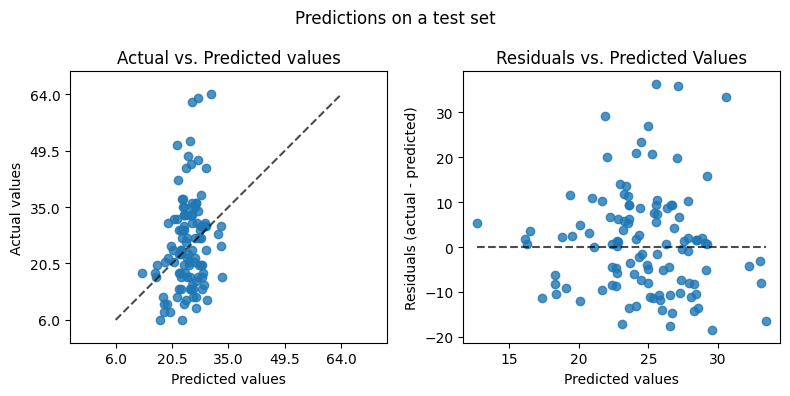

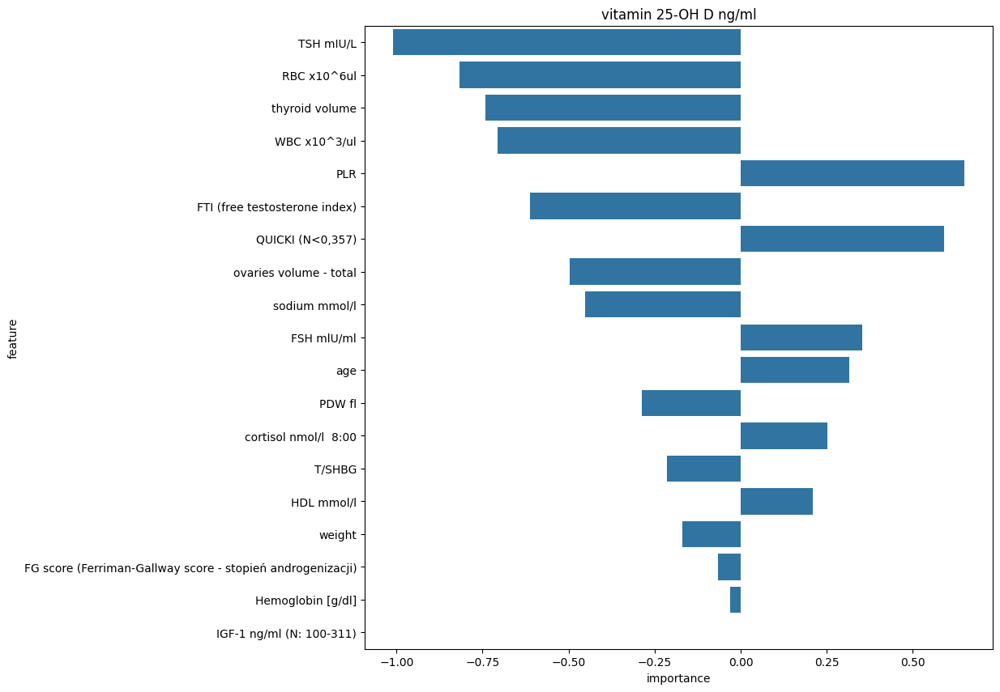

,model,data_set,mse,mae,rmse,r2
0,Lasso(alpha=0.5),training,103.994,8.182,10.198,0.155
1,Lasso(alpha=0.5),test,134.281,8.954,11.588,0.049


In [22]:
feature_subset = best_features
lasso_model = Lasso(alpha=0.5)

vit_d_model_scores_df, feature_importnces_lasso = train_model(lasso_model, VITAMINE_D, X_train_vit_d[feature_subset], y_train_vit_d, X_test_vit_d[feature_subset], y_test_vit_d, continuous_preprocessor, categorical_preprocessor, get_feature_importance_lasso)
vit_d_model_scores_df

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


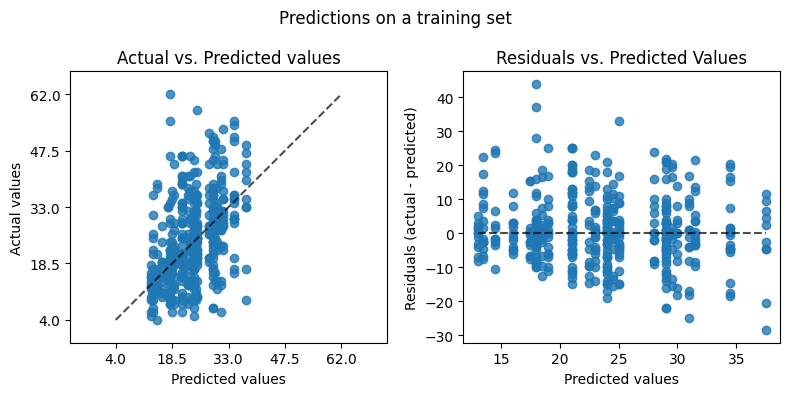

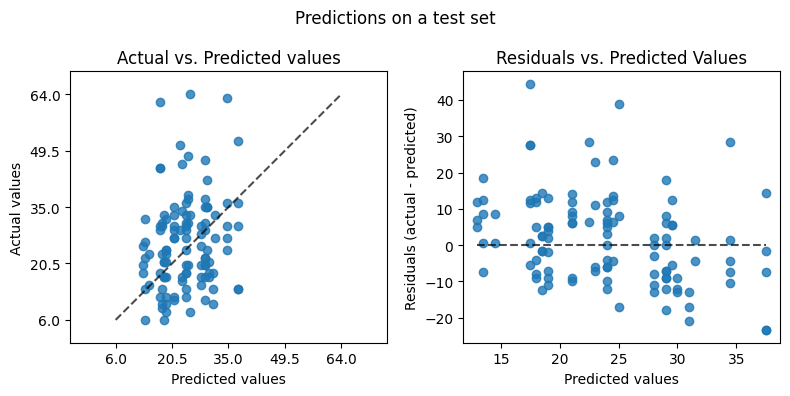

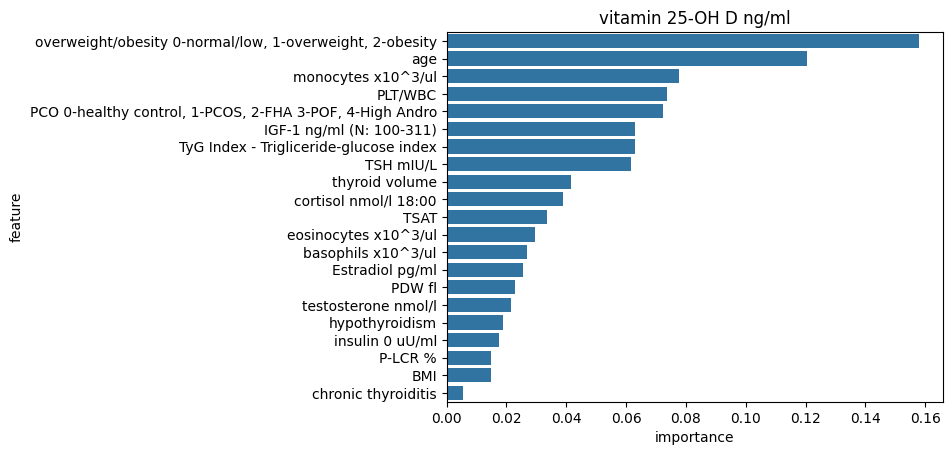

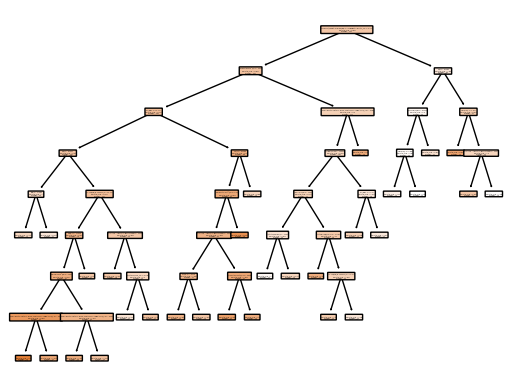

,model,data_set,mse,mae,rmse,r2
0,"DecisionTreeRegressor(criterion='absolute_error', max_depth=8,\n min_samples_leaf=10, min_samples_split=10,\n random_state=62, splitter='random')",training,99.735,7.269,9.987,0.19
1,"DecisionTreeRegressor(criterion='absolute_error', max_depth=8,\n min_samples_leaf=10, min_samples_split=10,\n random_state=62, splitter='random')",test,156.727,9.824,12.519,-0.11


In [23]:
feature_subset = best_features

tree_model = DecisionTreeRegressor(criterion="absolute_error", max_depth=8, min_samples_leaf=10, min_samples_split=10, splitter='random', random_state=62)
vit_d_model_scores_df, feature_importnces_tree = train_model(tree_model, VITAMINE_D, X_train_vit_d[feature_subset], y_train_vit_d, X_test_vit_d[feature_subset], y_test_vit_d, continuous_preprocessor_tree, categorical_preprocessor, get_feature_importance_tree)
vit_d_model_scores_df

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


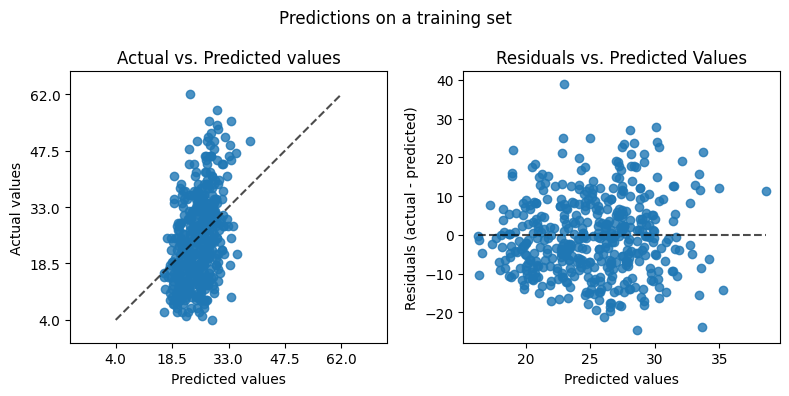

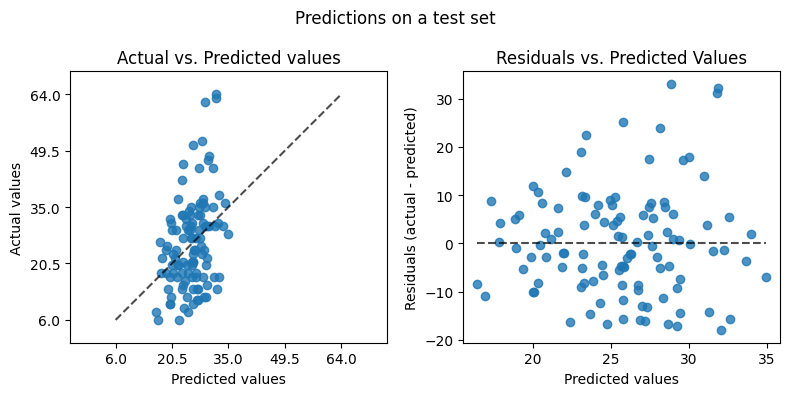

,model,data_set,mse,mae,rmse,r2
0,KNeighborsRegressor(n_neighbors=14),training,102.372,8.125,10.118,0.169
1,KNeighborsRegressor(n_neighbors=14),test,121.116,8.583,11.005,0.142


In [24]:
knn_model = KNeighborsRegressor(n_neighbors=14)

feature_subset = best_features

vit_d_model_scores_df, feature_importnces_knn = train_model(knn_model, VITAMINE_D, X_train_vit_d[feature_subset], y_train_vit_d, X_test_vit_d[feature_subset], y_test_vit_d, continuous_preprocessor, categorical_preprocessor, get_feature_importance_knn)
vit_d_model_scores_df

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


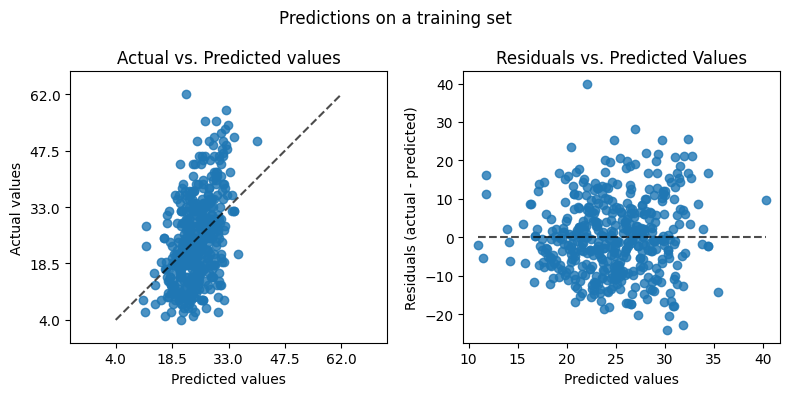

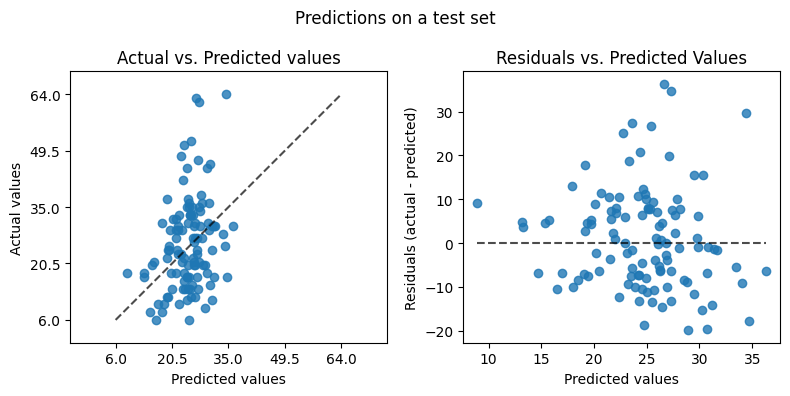

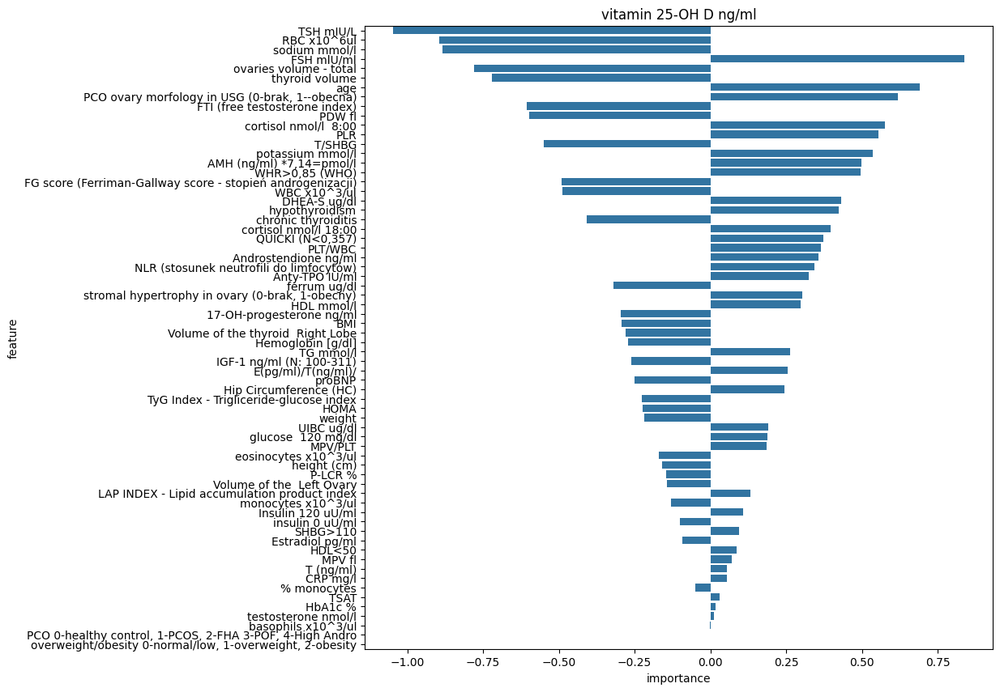

,model,data_set,mse,mae,rmse,r2
0,Ridge(alpha=100),training,98.077,7.893,9.903,0.203
1,Ridge(alpha=100),test,132.148,9.106,11.496,0.064


In [25]:
ridge_model = Ridge(alpha=100)
feature_subset = best_features


vit_d_model_scores_df, feature_importnces_ridge = train_model(ridge_model, VITAMINE_D, X_train_vit_d[feature_subset], y_train_vit_d, X_test_vit_d[feature_subset], y_test_vit_d, continuous_preprocessor, categorical_preprocessor, get_feature_importance_lasso)
vit_d_model_scores_df

### Permutation Importance

In [26]:

sfs = SFS(
    estimator = RandomForestRegressor(n_estimators=100, random_state=10), 
    n_features_to_select="auto",
    tol=0.001,
    direction='backward',
    scoring='r2',
    cv=3,
    n_jobs=-1
)

sfs = sfs.fit(X_train_vit_d[selected_features_map['permutation_importance']], y_train_vit_d)

In [27]:
best_features_permutation_info = sfs.get_feature_names_out()
len(best_features_permutation_info), best_features_permutation_info

(34,
 array(['QUICKI (N<0,357)', 'WHTR (Waist/Height Ratio)', 'PLT x10^3/ul',
        'Hip Circumference (HC)', 'AIP -Atherogenic index of plasma',
        'TyG Index - Trigliceride-glucose index',
        'BAI - Body adiposity index', 'TG mmol/l', 'eos/leukocyty', 'HOMA',
        'lymphocytes x10^3/ul', 'NLR (stosunek neutrofili do limfocytów)',
        'L/WCC (leukocyty do całkowitej liczby krwinek białych)',
        'coronary risk index (CRI) (TG/HDL-C)', 'T (ng/ml)', 'PLT/WBC',
        'insulin 0 uU/ml', 'PLR', 'ovaries volume - total',
        '%eosinocytes ', 'testosterone nmol/l', 'MPV/PLT',
        'neutrophil x10^3/ul', 'LH', 'WBC x10^3/ul', 'weight', 'LH/FSH',
        'FSH mlU/ml', 'LAP INDEX - Lipid accumulation product index',
        'MPV fl', 'Vole of the Right Ovary', 'T/SHBG', 'ferrum ug/dl',
        'glucose 0 mg/dl'], dtype=object))

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


selected 34 features


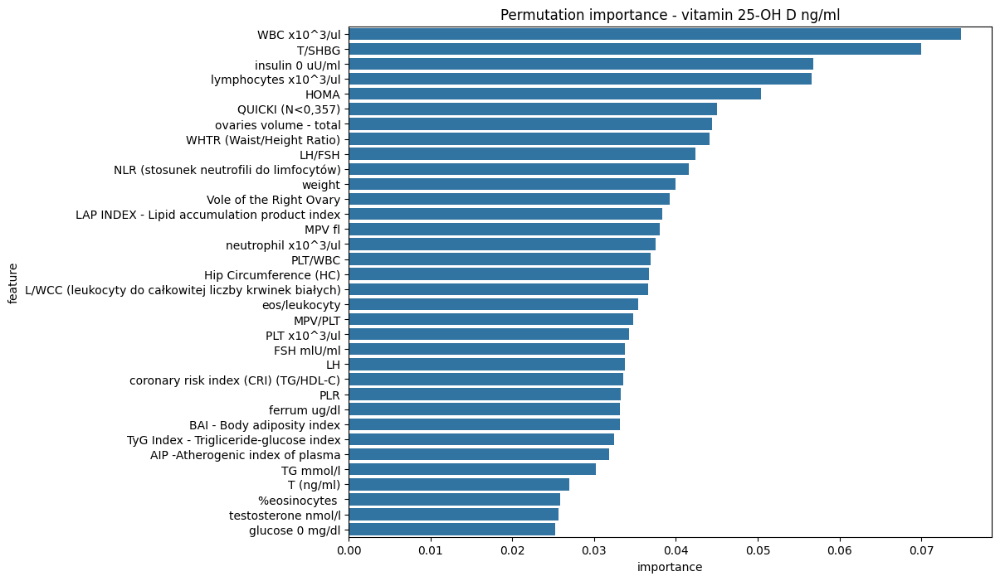

In [38]:
selected_features_permutation_importance = get_permutation_importance(X_train_vit_d[best_features_permutation_info], y_train_vit_d, RandomForestRegressor(n_estimators=100, max_depth=None, max_features='sqrt', min_samples_leaf=3, min_samples_split=3, criterion='absolute_error', random_state=56), continuous_preprocessor, categorical_preprocessor, VITAMINE_D, figsize=(10, 8))
# selected_features_permutation_importance

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


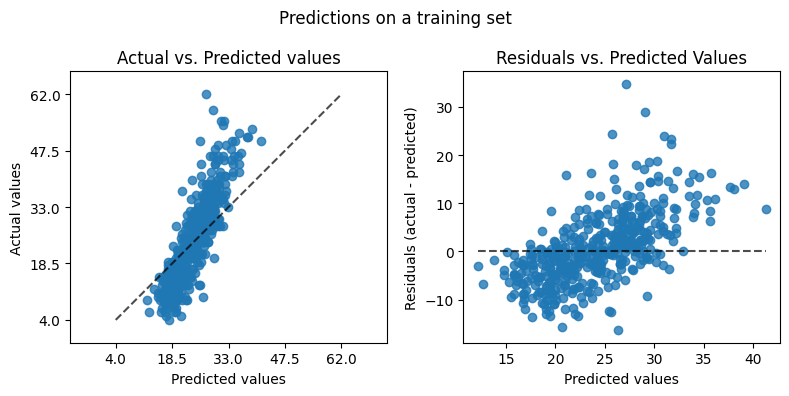

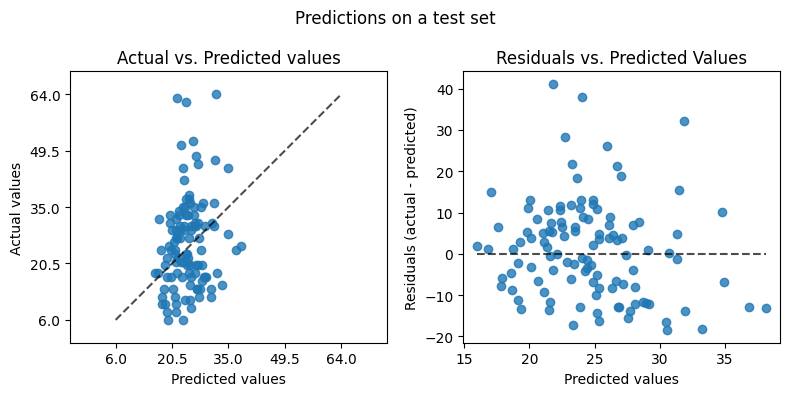

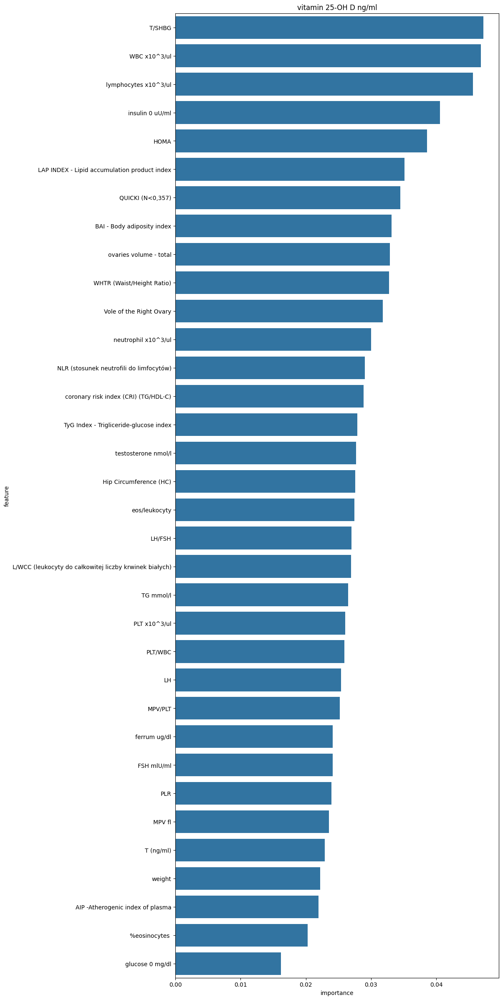

,model,data_set,mse,mae,rmse,r2
0,"RandomForestRegressor(criterion='absolute_error', max_features='sqrt',\n min_samples_leaf=3, min_samples_split=3, random_state=56)",training,54.280,5.551,7.368,0.559
1,"RandomForestRegressor(criterion='absolute_error', max_features='sqrt',\n min_samples_leaf=3, min_samples_split=3, random_state=56)",test,141.603,9.366,11.900,-0.003


In [29]:
feature_subset = best_features_permutation_info

rf_model = RandomForestRegressor(n_estimators=100, max_depth=None, max_features='sqrt', min_samples_leaf=3, min_samples_split=3, criterion='absolute_error', random_state=56)
vit_d_model_scores_df, feature_importnces_rf = train_model(rf_model, VITAMINE_D, X_train_vit_d[feature_subset], y_train_vit_d, X_test_vit_d[feature_subset], y_test_vit_d, continuous_preprocessor_tree, categorical_preprocessor, get_feature_importance_rf)
vit_d_model_scores_df

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


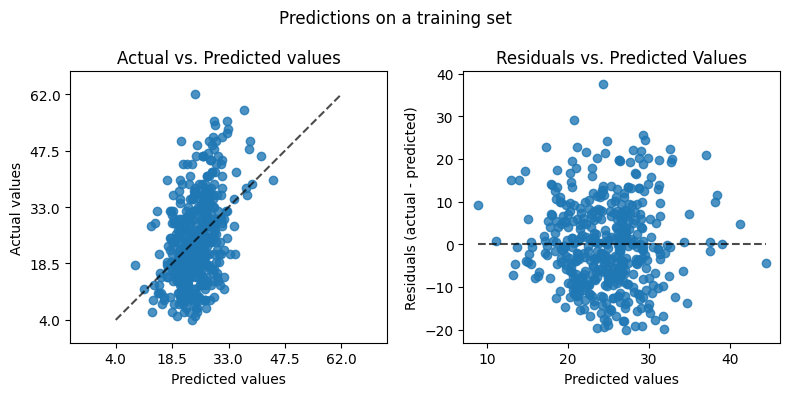

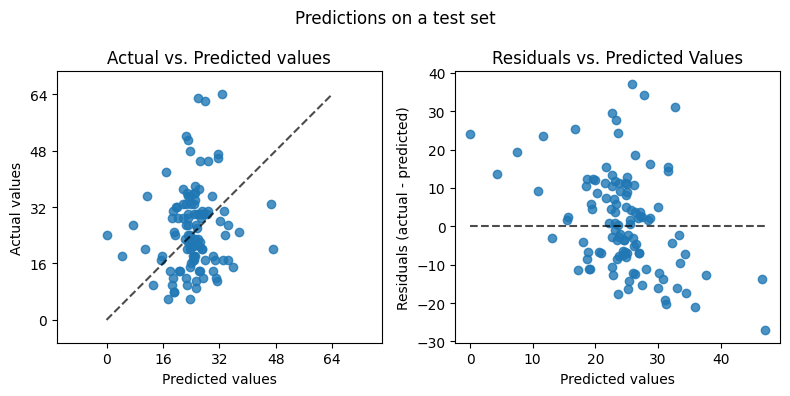

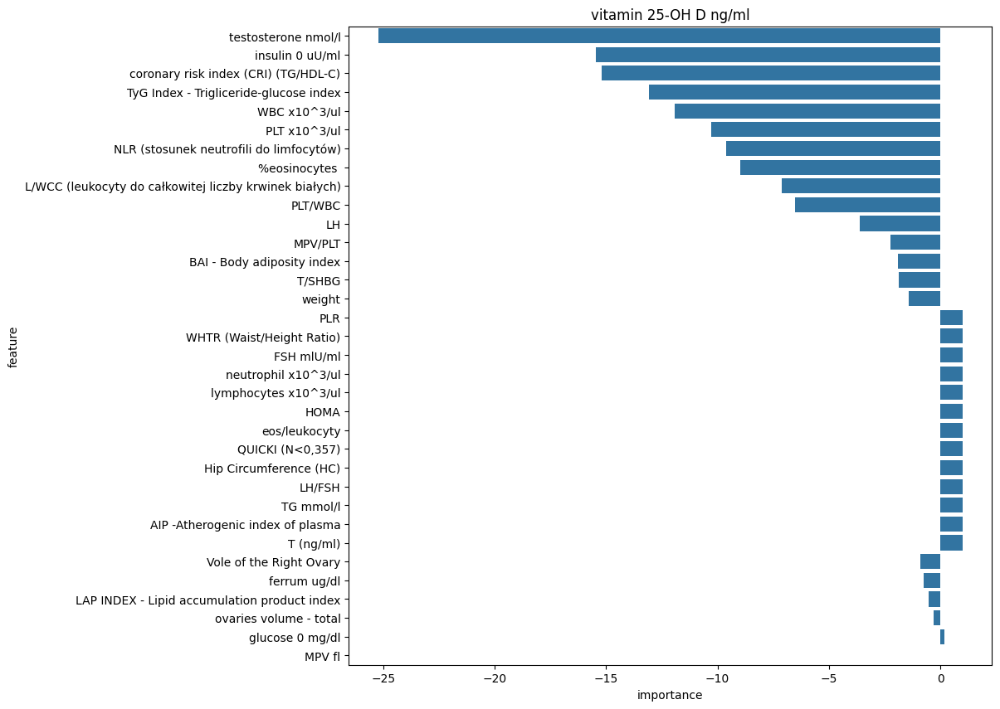

,model,data_set,mse,mae,rmse,r2
0,LinearRegression(),training,101.039,8.066,10.052,0.179
1,LinearRegression(),test,166.215,10.365,12.892,-0.177


In [30]:
feature_subset = best_features_permutation_info

lasso_model = LinearRegression()

vit_d_model_scores_df, feature_importnces_lasso = train_model(lasso_model, VITAMINE_D, X_train_vit_d[feature_subset], y_train_vit_d, X_test_vit_d[feature_subset], y_test_vit_d, continuous_preprocessor, categorical_preprocessor, get_feature_importance_lasso)
vit_d_model_scores_df

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


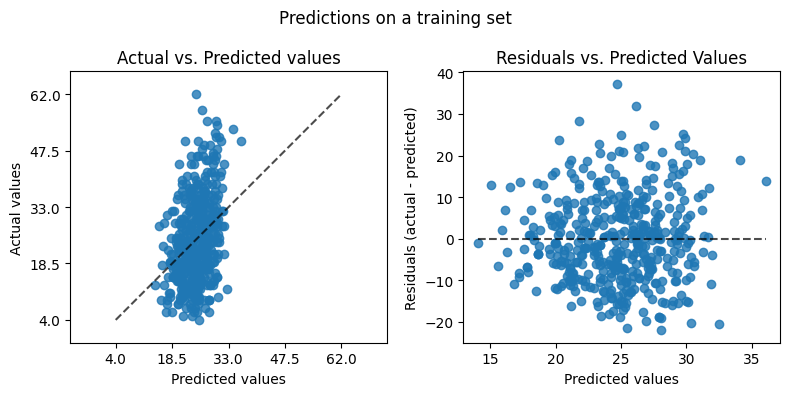

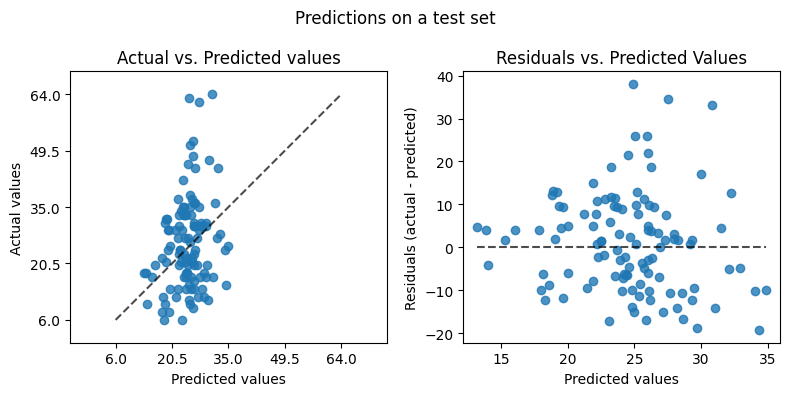

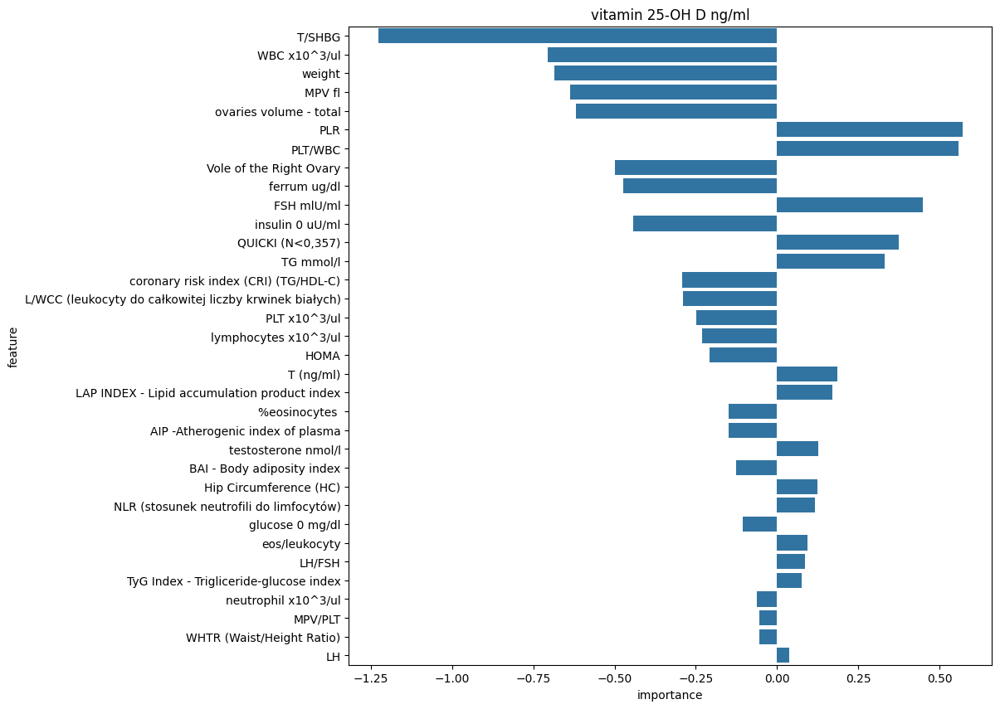

,model,data_set,mse,mae,rmse,r2
0,Ridge(alpha=100),training,107.714,8.334,10.379,0.125
1,Ridge(alpha=100),test,135.725,9.247,11.650,0.039


In [31]:
ridge_model = Ridge(alpha=100)
feature_subset = best_features_permutation_info


vit_d_model_scores_df, feature_importnces_ridge = train_model(ridge_model, VITAMINE_D, X_train_vit_d[feature_subset], y_train_vit_d, X_test_vit_d[feature_subset], y_test_vit_d, continuous_preprocessor, categorical_preprocessor, get_feature_importance_lasso)
vit_d_model_scores_df

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


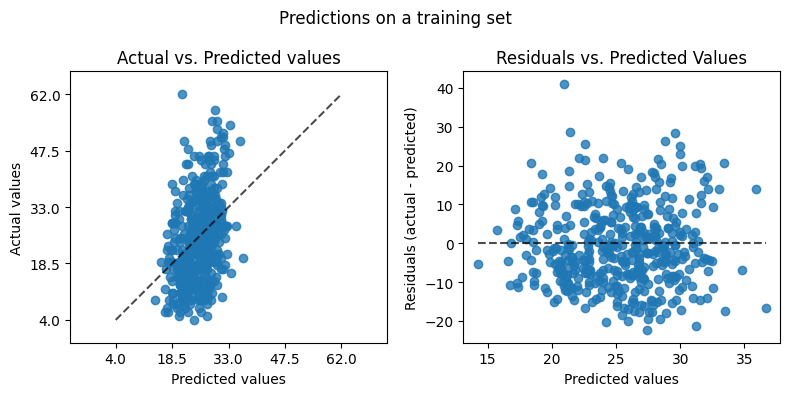

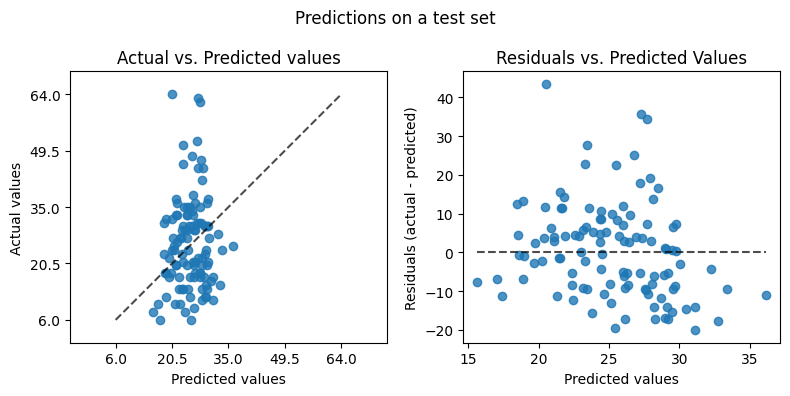

,model,data_set,mse,mae,rmse,r2
0,KNeighborsRegressor(n_neighbors=14),training,106.089,8.381,10.300,0.138
1,KNeighborsRegressor(n_neighbors=14),test,149.020,9.628,12.207,-0.055


In [32]:
knn_model = KNeighborsRegressor(n_neighbors=14)

feature_subset = best_features_permutation_info

vit_d_model_scores_df, feature_importnces_knn = train_model(knn_model, VITAMINE_D, X_train_vit_d[feature_subset], y_train_vit_d, X_test_vit_d[feature_subset], y_test_vit_d, continuous_preprocessor, categorical_preprocessor, get_feature_importance_knn)
vit_d_model_scores_df

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


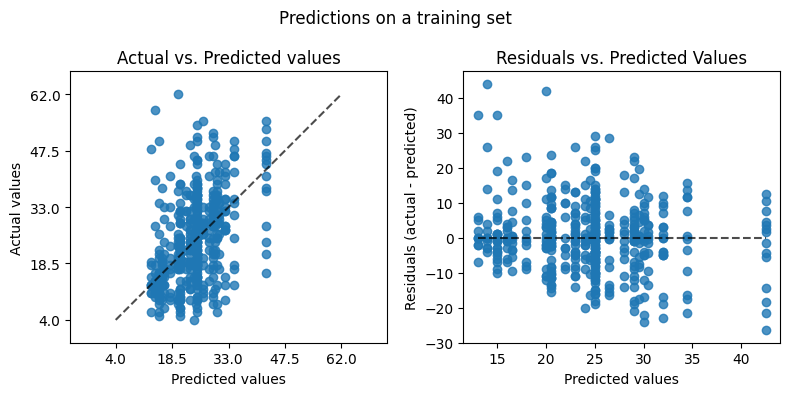

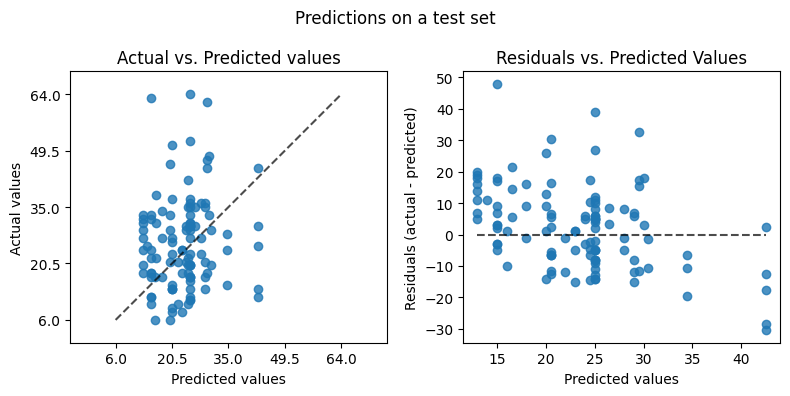

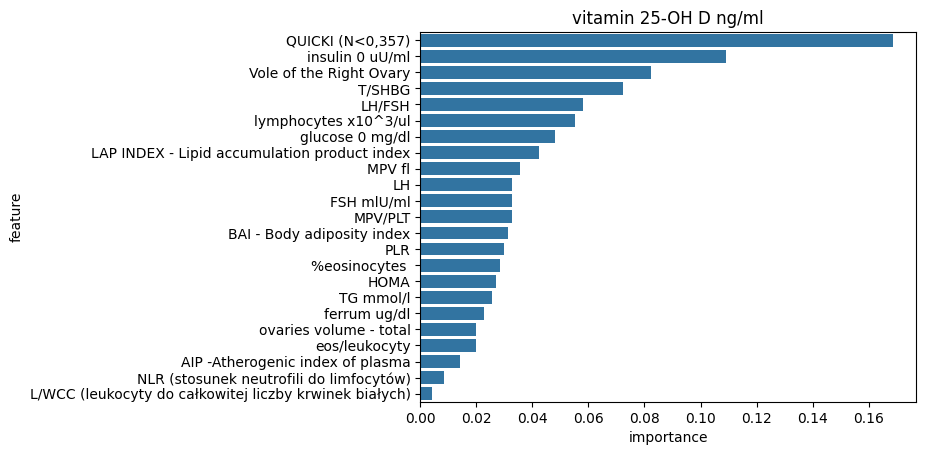

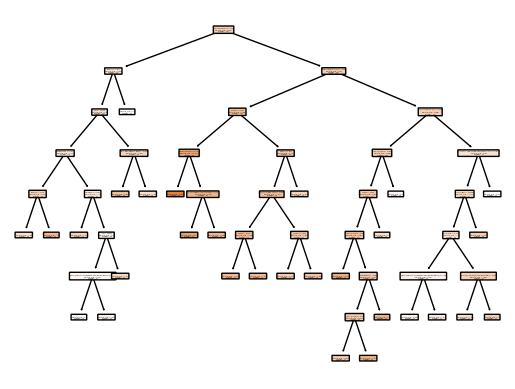

,model,data_set,mse,mae,rmse,r2
0,"DecisionTreeRegressor(criterion='absolute_error', max_depth=8,\n min_samples_leaf=10, min_samples_split=10,\n random_state=62, splitter='random')",training,102.622,7.361,10.130,0.167
1,"DecisionTreeRegressor(criterion='absolute_error', max_depth=8,\n min_samples_leaf=10, min_samples_split=10,\n random_state=62, splitter='random')",test,176.946,10.405,13.302,-0.253


In [33]:
feature_subset = best_features_permutation_info

tree_model = DecisionTreeRegressor(criterion="absolute_error", max_depth=8, min_samples_leaf=10, min_samples_split=10, splitter='random', random_state=62)
vit_d_model_scores_df, feature_importnces_tree = train_model(tree_model, VITAMINE_D, X_train_vit_d[feature_subset], y_train_vit_d, X_test_vit_d[feature_subset], y_test_vit_d, continuous_preprocessor_tree, categorical_preprocessor, get_feature_importance_tree)
vit_d_model_scores_df

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


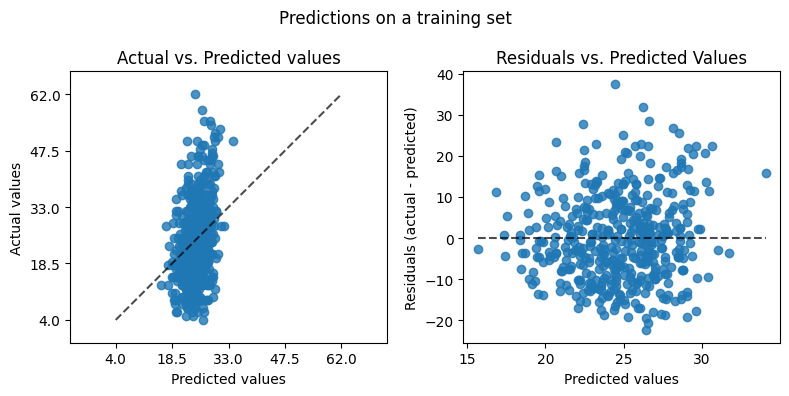

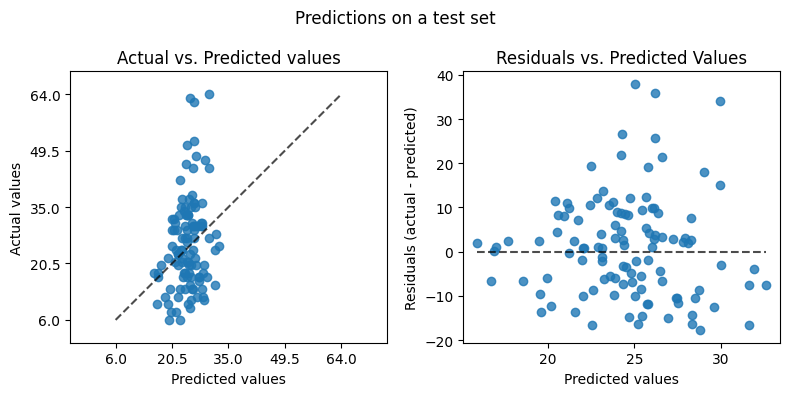

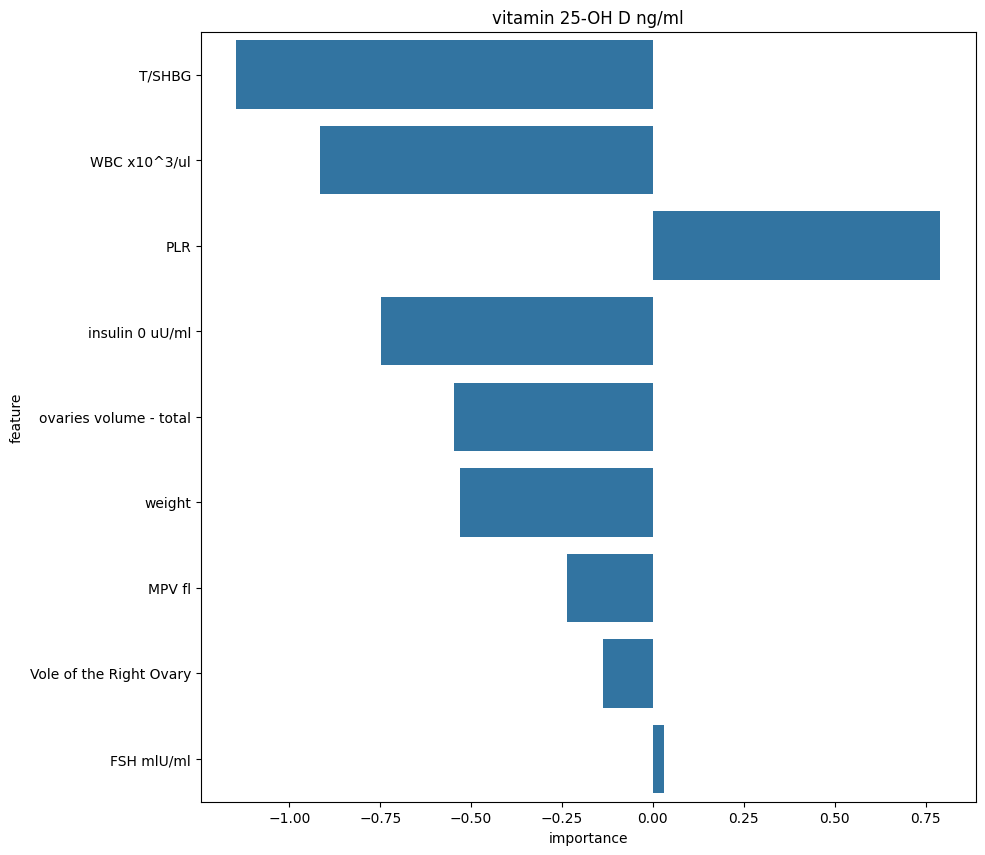

,model,data_set,mse,mae,rmse,r2
0,Lasso(alpha=0.5),training,109.540,8.434,10.466,0.11
1,Lasso(alpha=0.5),test,134.199,9.050,11.584,0.05


In [34]:
feature_subset = best_features_permutation_info
lasso_model = Lasso(alpha=0.5)

vit_d_model_scores_df, feature_importnces_lasso = train_model(lasso_model, VITAMINE_D, X_train_vit_d[feature_subset], y_train_vit_d, X_test_vit_d[feature_subset], y_test_vit_d, continuous_preprocessor, categorical_preprocessor, get_feature_importance_lasso)
vit_d_model_scores_df

## Test the narrowed down feature space

In [70]:
len(strict_permutation_importance_subset), len(selected_features_map['permutation_importance']), len(selected_features_map['mutual_info']), len(intersection_all_sets), len(union_all_sets)

(24, 40, 68, 20, 88)

### Permutation importance subset

(24, 40, 68, 20, 88)

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


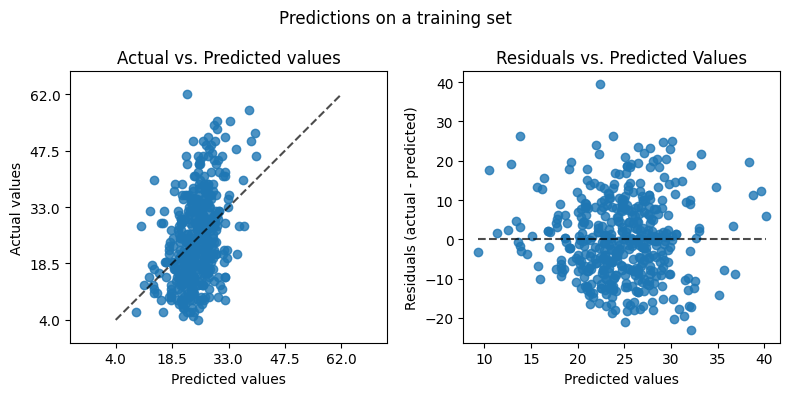

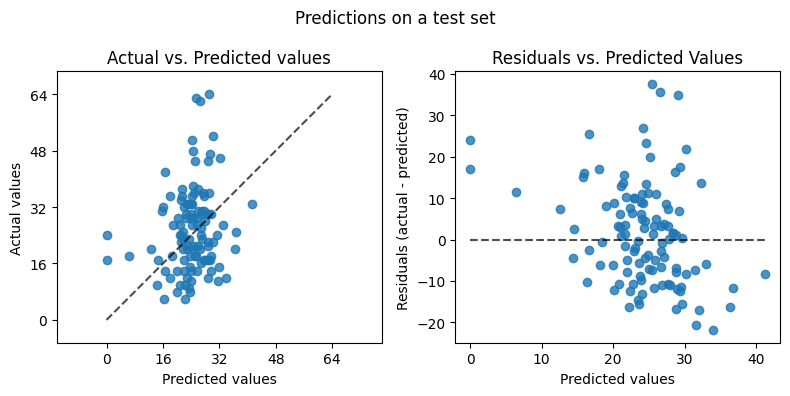

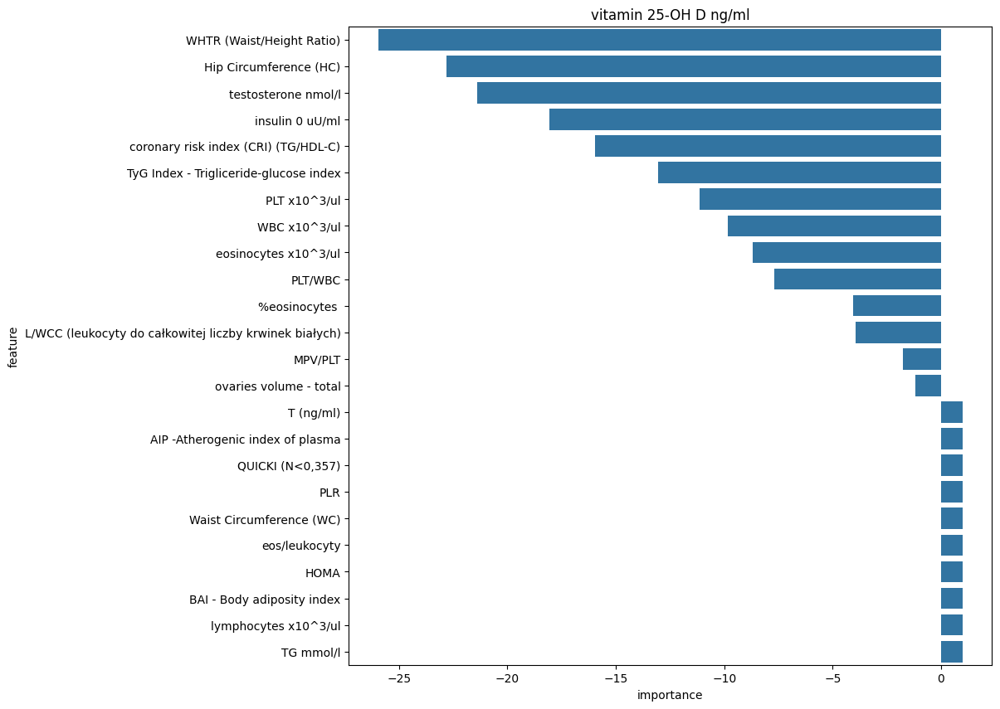

,model,data_set,mse,mae,rmse,r2
0,LinearRegression(),training,103.306,8.132,10.164,0.161
1,LinearRegression(),test,153.824,9.917,12.403,-0.089


In [34]:
# strict subset
feature_subset = strict_permutation_importance_subset

lasso_model = LinearRegression()

vit_d_model_scores_df, feature_importnces_lasso = train_model(lasso_model, VITAMINE_D, X_train_vit_d[feature_subset], y_train_vit_d, X_test_vit_d[feature_subset], y_test_vit_d, continuous_preprocessor, categorical_preprocessor, get_feature_importance_lasso)
vit_d_model_scores_df

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


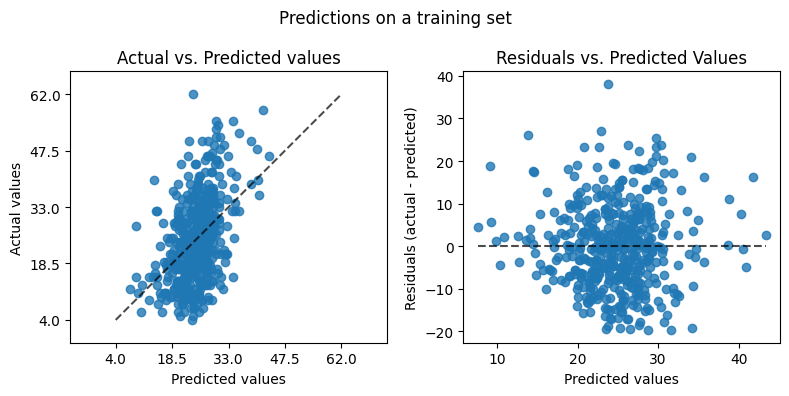

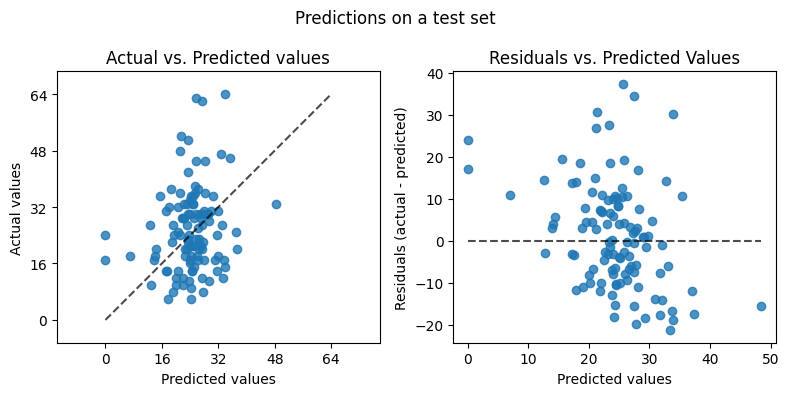

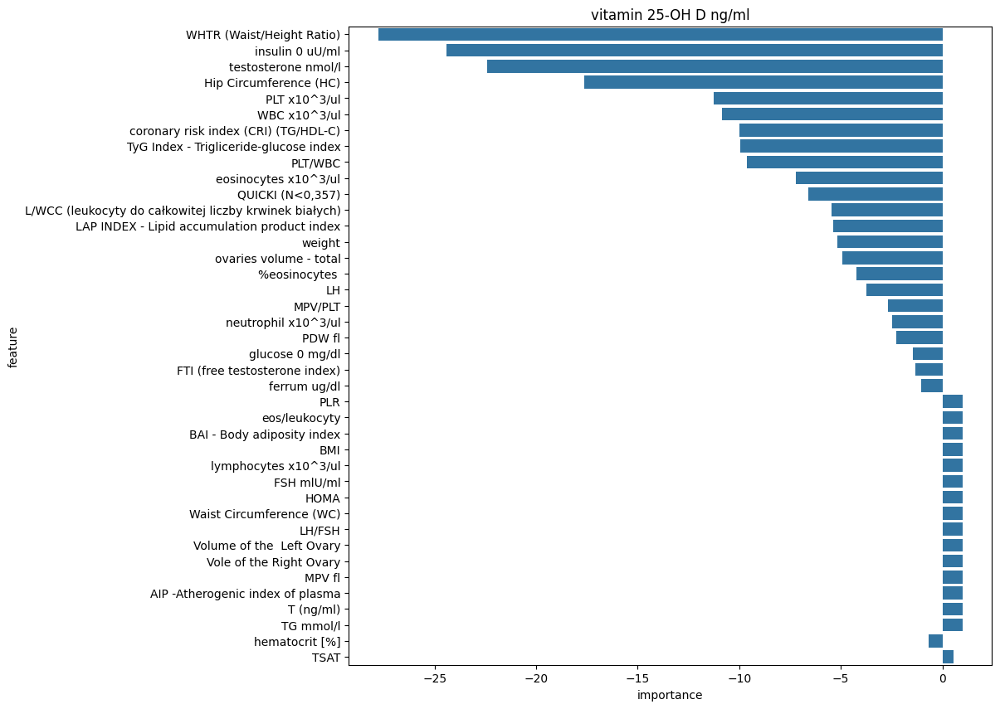

,model,data_set,mse,mae,rmse,r2
0,LinearRegression(),training,97.904,7.872,9.895,0.205
1,LinearRegression(),test,157.921,10.029,12.567,-0.118


In [33]:
# mild subset

feature_subset = selected_features_map['permutation_importance']

lasso_model = LinearRegression()

vit_d_model_scores_df, feature_importnces_lasso = train_model(lasso_model, VITAMINE_D, X_train_vit_d[feature_subset], y_train_vit_d, X_test_vit_d[feature_subset], y_test_vit_d, continuous_preprocessor, categorical_preprocessor, get_feature_importance_lasso)
vit_d_model_scores_df

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


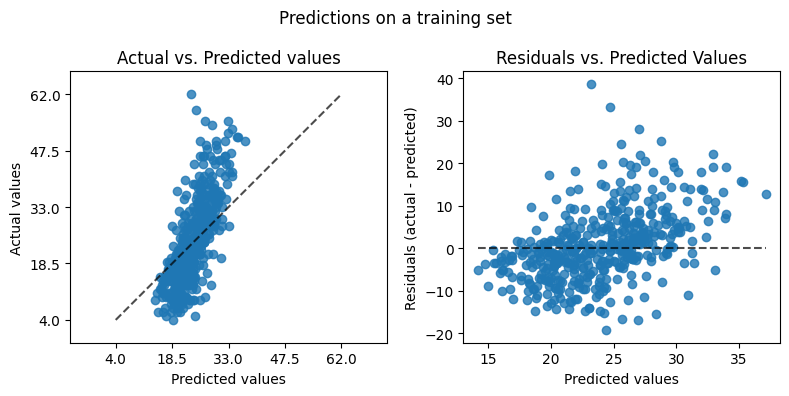

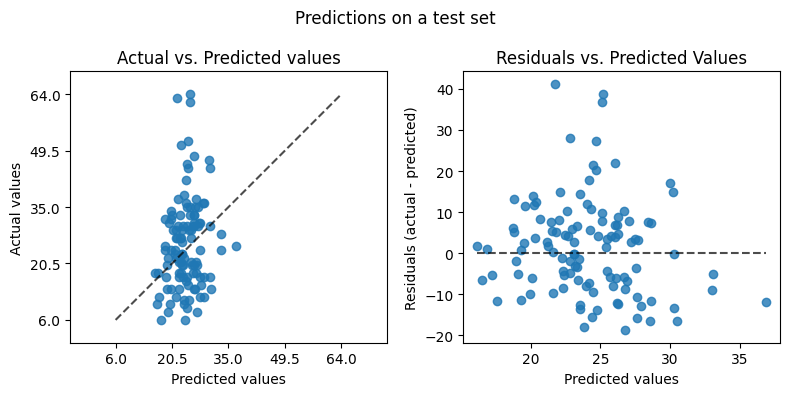

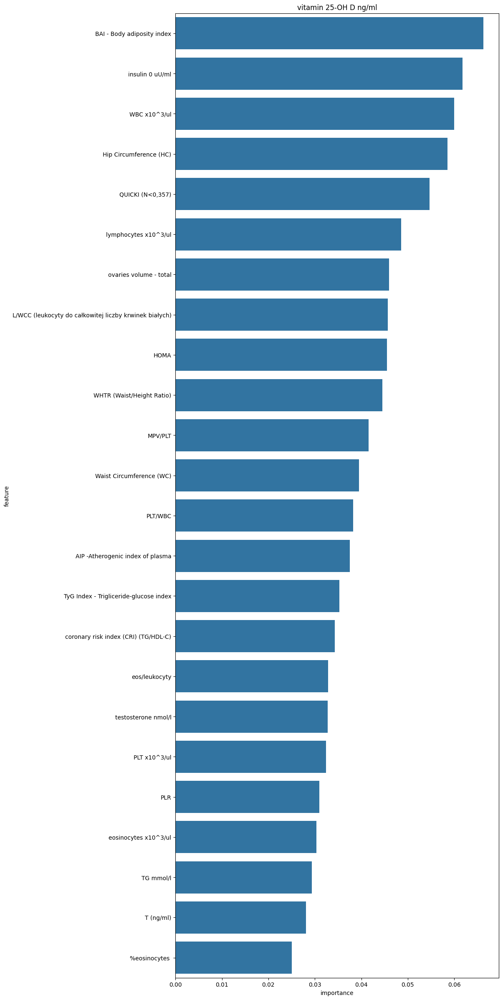

,model,data_set,mse,mae,rmse,r2
0,"RandomForestRegressor(criterion='absolute_error', max_features='sqrt',\n min_samples_leaf=5, min_samples_split=5, random_state=56)",training,71.691,6.389,8.467,0.418
1,"RandomForestRegressor(criterion='absolute_error', max_features='sqrt',\n min_samples_leaf=5, min_samples_split=5, random_state=56)",test,142.523,9.267,11.938,-0.009


In [51]:

feature_subset = strict_permutation_importance_subset

rf_model = RandomForestRegressor(n_estimators=100, max_depth=None, max_features='sqrt', min_samples_leaf=5, min_samples_split=5, criterion='absolute_error', random_state=56)
vit_d_model_scores_df, feature_importnces_rf = train_model(rf_model, VITAMINE_D, X_train_vit_d[feature_subset], y_train_vit_d, X_test_vit_d[feature_subset], y_test_vit_d, continuous_preprocessor_tree, categorical_preprocessor, get_feature_importance_rf)
vit_d_model_scores_df

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


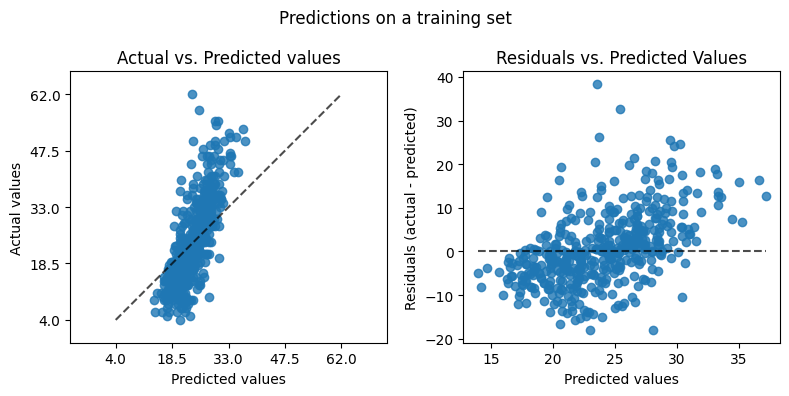

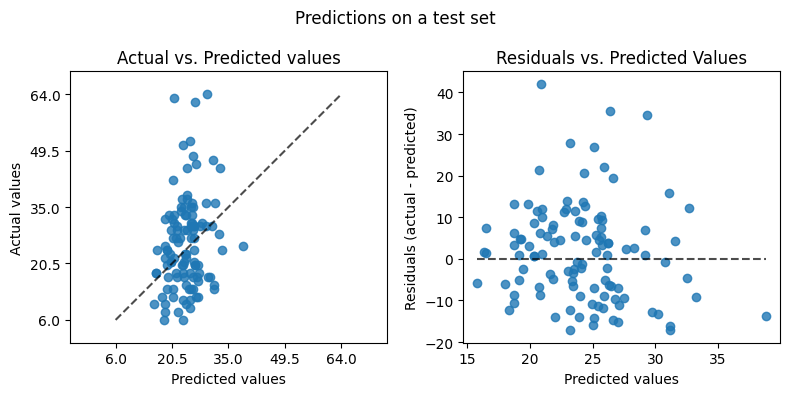

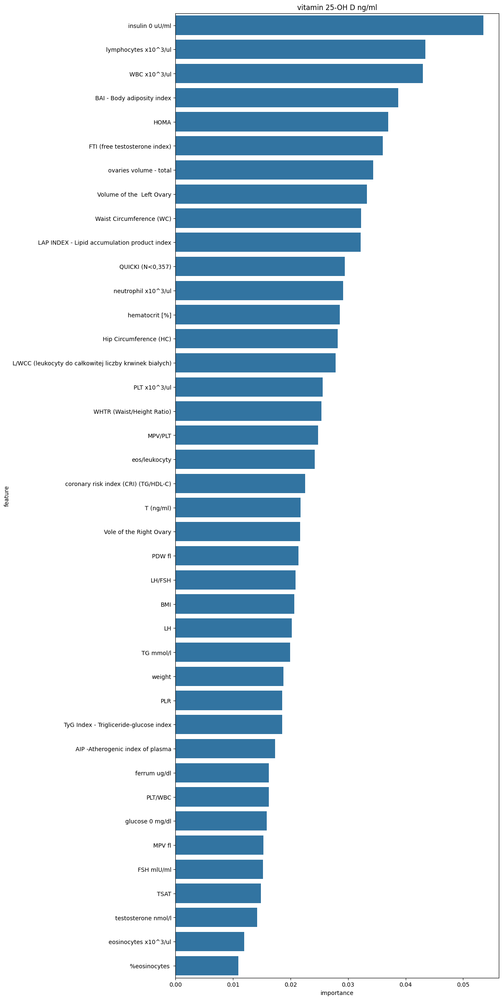

,model,data_set,mse,mae,rmse,r2
0,"RandomForestRegressor(criterion='absolute_error', max_features='sqrt',\n min_samples_leaf=5, min_samples_split=5, random_state=56)",training,70.793,6.350,8.414,0.425
1,"RandomForestRegressor(criterion='absolute_error', max_features='sqrt',\n min_samples_leaf=5, min_samples_split=5, random_state=56)",test,139.483,9.243,11.810,0.012


In [50]:

feature_subset = selected_features_map['permutation_importance']

rf_model = RandomForestRegressor(n_estimators=100, max_depth=None, max_features='sqrt', min_samples_leaf=5, min_samples_split=5, criterion='absolute_error', random_state=56)
vit_d_model_scores_df, feature_importnces_rf = train_model(rf_model, VITAMINE_D, X_train_vit_d[feature_subset], y_train_vit_d, X_test_vit_d[feature_subset], y_test_vit_d, continuous_preprocessor_tree, categorical_preprocessor, get_feature_importance_rf)
vit_d_model_scores_df

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


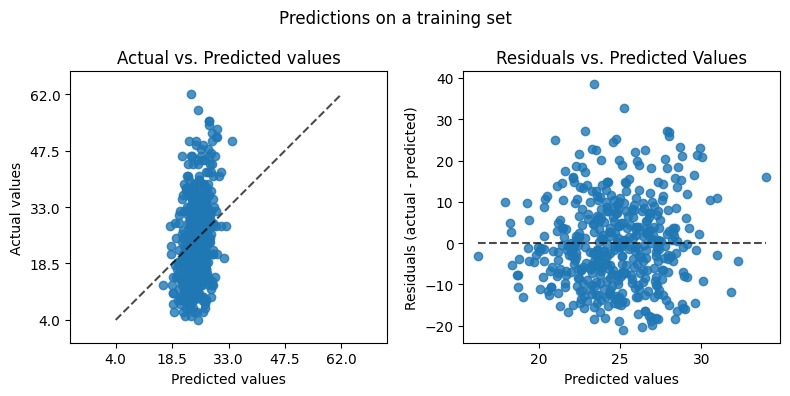

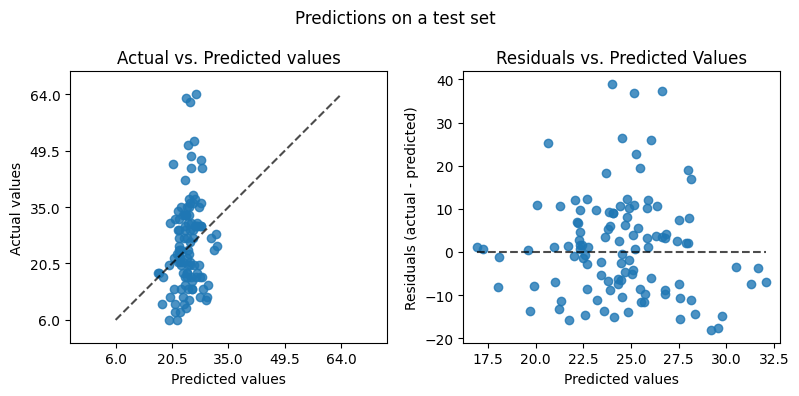

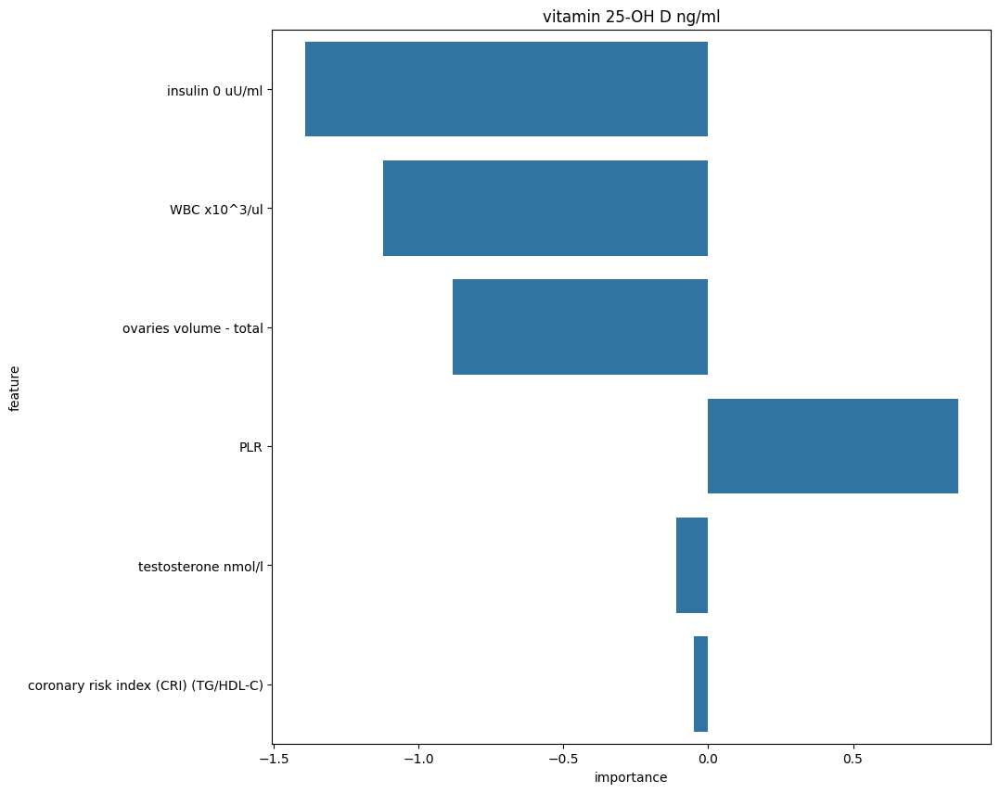

,model,data_set,mse,mae,rmse,r2
0,Lasso(alpha=0.5),training,111.563,8.467,10.562,0.094
1,Lasso(alpha=0.5),test,138.305,9.021,11.760,0.020


In [52]:
feature_subset = strict_permutation_importance_subset
lasso_model = Lasso(alpha=0.5)

vit_d_model_scores_df, feature_importnces_lasso = train_model(lasso_model, VITAMINE_D, X_train_vit_d[feature_subset], y_train_vit_d, X_test_vit_d[feature_subset], y_test_vit_d, continuous_preprocessor, categorical_preprocessor, get_feature_importance_lasso)
vit_d_model_scores_df

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


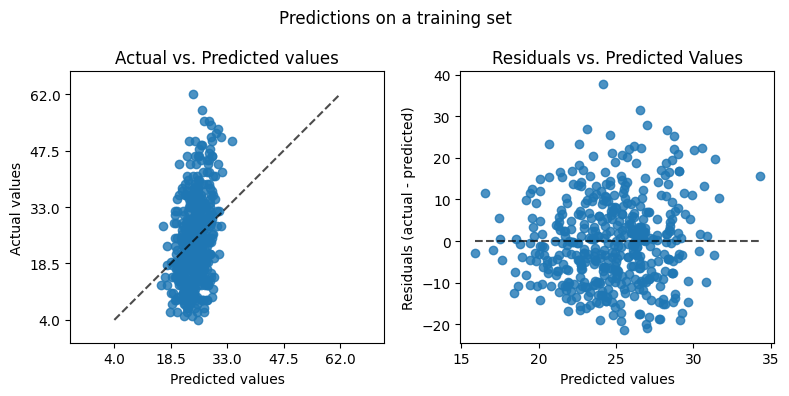

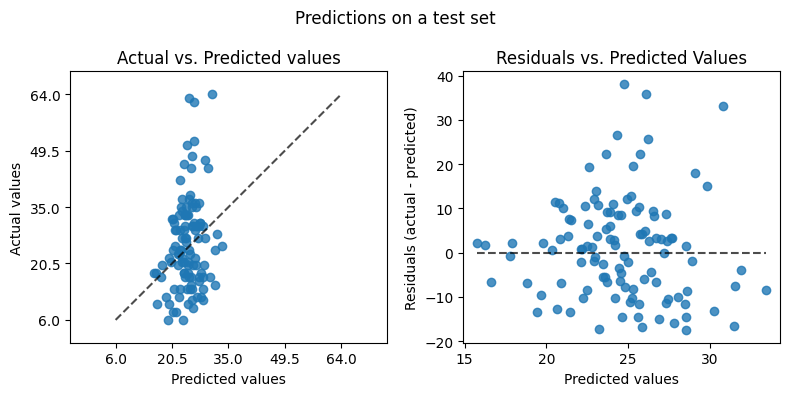

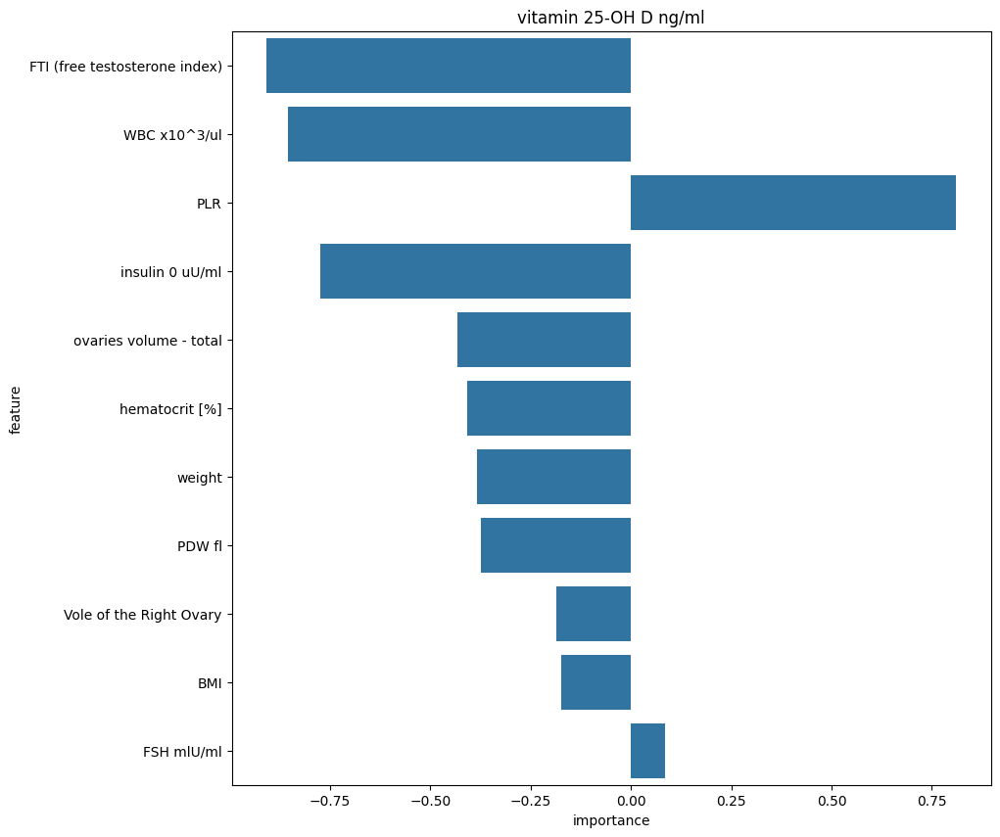

,model,data_set,mse,mae,rmse,r2
0,Lasso(alpha=0.5),training,109.238,8.396,10.452,0.113
1,Lasso(alpha=0.5),test,135.472,9.100,11.639,0.041


In [54]:
feature_subset = selected_features_map['permutation_importance']
lasso_model = Lasso(alpha=0.5)

vit_d_model_scores_df, feature_importnces_lasso = train_model(lasso_model, VITAMINE_D, X_train_vit_d[feature_subset], y_train_vit_d, X_test_vit_d[feature_subset], y_test_vit_d, continuous_preprocessor, categorical_preprocessor, get_feature_importance_lasso)
vit_d_model_scores_df

### Mutual info

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


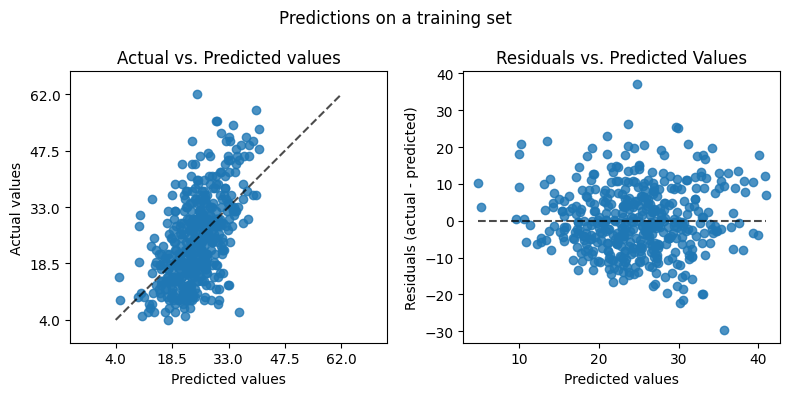

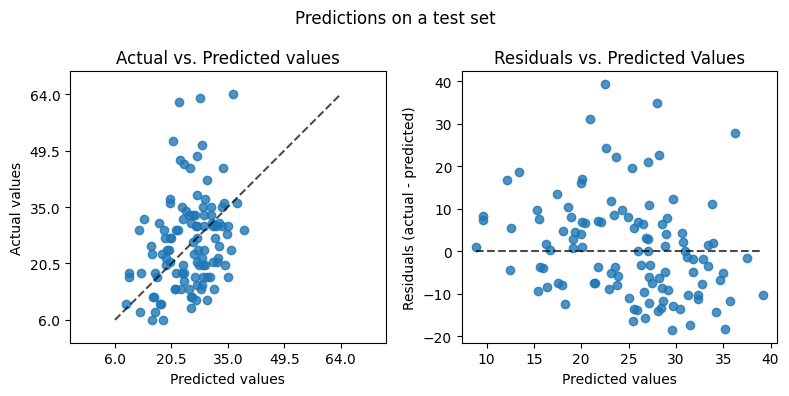

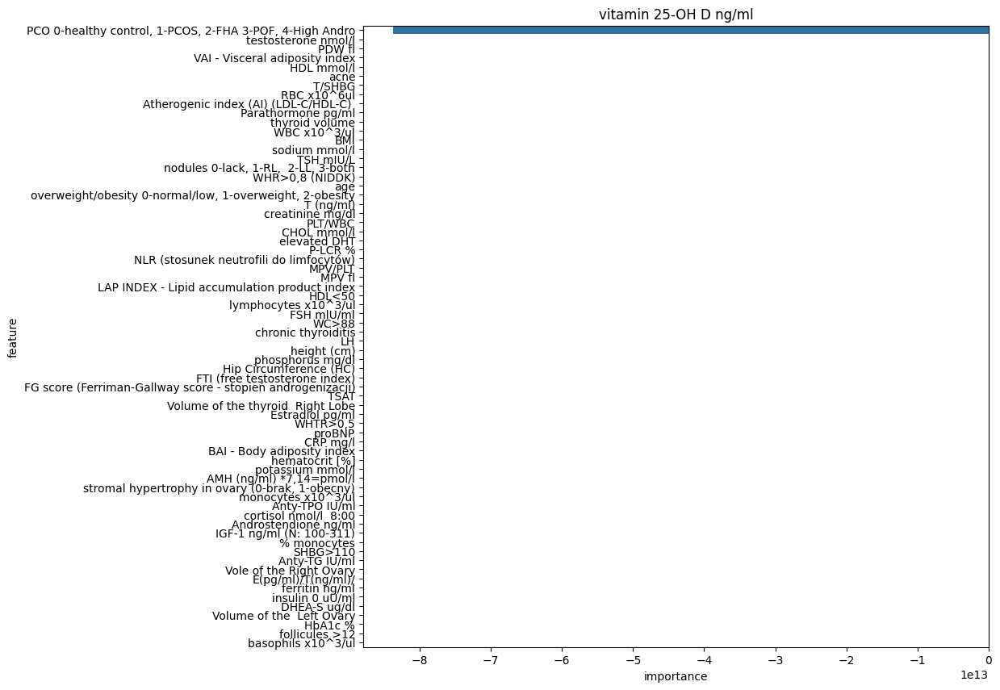

,model,data_set,mse,mae,rmse,r2
0,LinearRegression(),training,84.884,7.292,9.213,0.311
1,LinearRegression(),test,138.074,9.273,11.750,0.022


In [35]:
feature_subset = selected_features_map['mutual_info']

lasso_model = LinearRegression()

vit_d_model_scores_df, feature_importnces_lasso = train_model(lasso_model, VITAMINE_D, X_train_vit_d[feature_subset], y_train_vit_d, X_test_vit_d[feature_subset], y_test_vit_d, continuous_preprocessor, categorical_preprocessor, get_feature_importance_lasso)
vit_d_model_scores_df

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


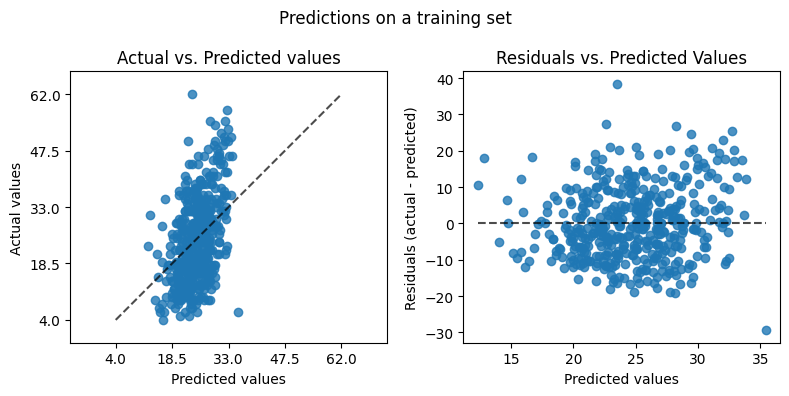

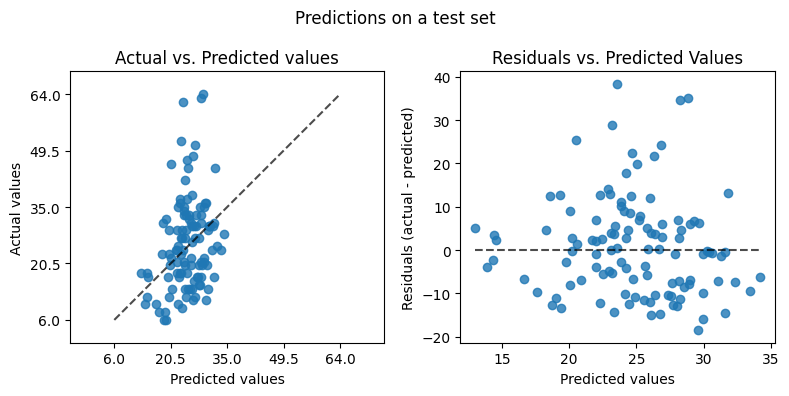

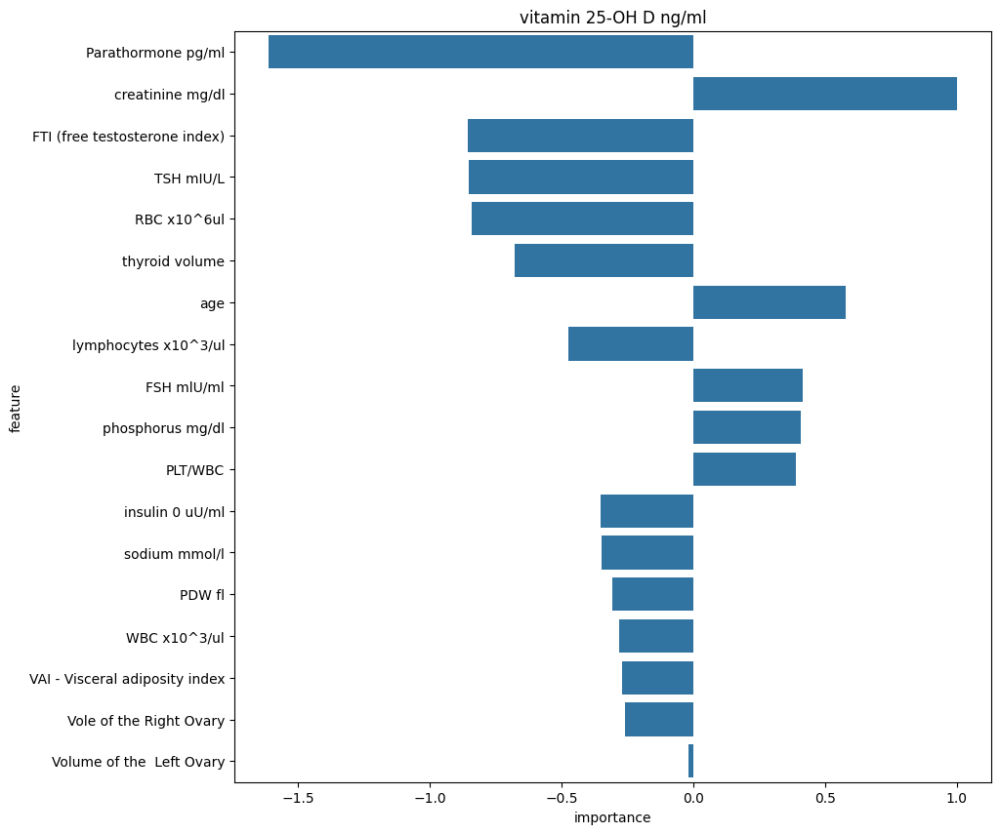

,model,data_set,mse,mae,rmse,r2
0,Lasso(alpha=0.5),training,96.336,7.891,9.815,0.218
1,Lasso(alpha=0.5),test,132.575,8.821,11.514,0.061


In [120]:
feature_subset = best_features
lasso_model = Lasso(alpha=0.5)

vit_d_model_scores_df, feature_importnces_lasso = train_model(lasso_model, VITAMINE_D, X_train_vit_d[feature_subset], y_train_vit_d, X_test_vit_d[feature_subset], y_test_vit_d, continuous_preprocessor, categorical_preprocessor, get_feature_importance_lasso)
vit_d_model_scores_df

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


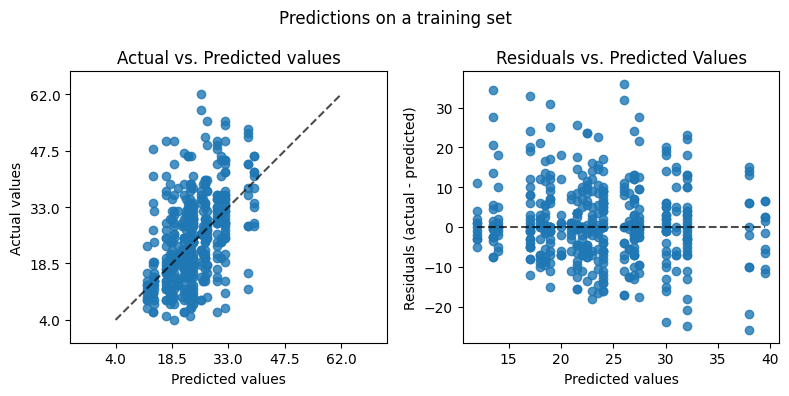

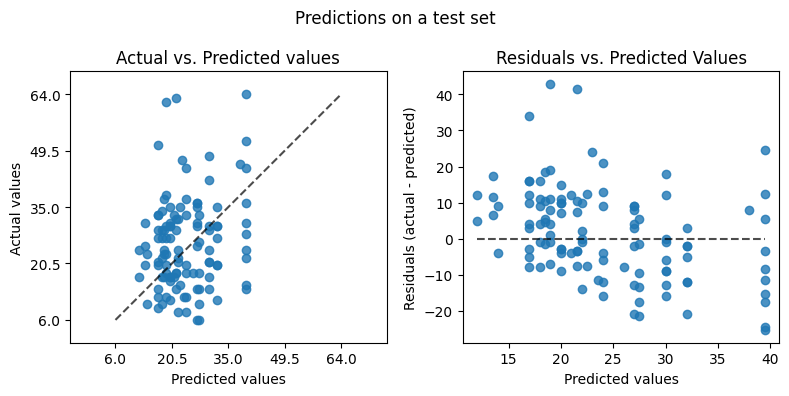

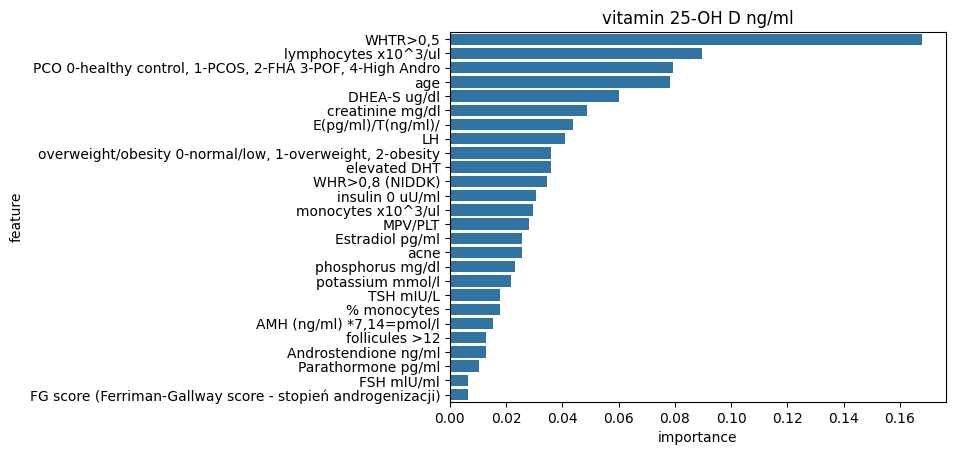

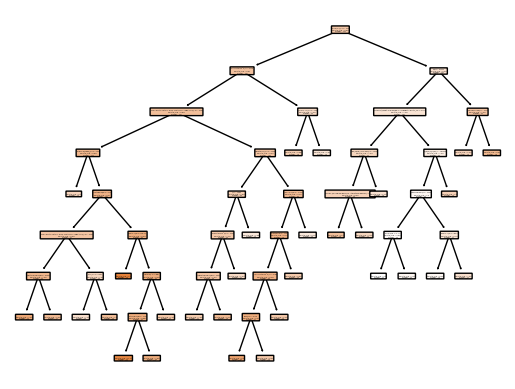

,model,data_set,mse,mae,rmse,r2
0,"DecisionTreeRegressor(criterion='absolute_error', max_depth=8,\n min_samples_leaf=10, min_samples_split=10,\n random_state=62, splitter='random')",training,96.108,7.194,9.803,0.219
1,"DecisionTreeRegressor(criterion='absolute_error', max_depth=8,\n min_samples_leaf=10, min_samples_split=10,\n random_state=62, splitter='random')",test,164.164,10.176,12.813,-0.163


In [121]:
feature_subset = best_features

tree_model = DecisionTreeRegressor(criterion="absolute_error", max_depth=8, min_samples_leaf=10, min_samples_split=10, splitter='random', random_state=62)
vit_d_model_scores_df, feature_importnces_tree = train_model(tree_model, VITAMINE_D, X_train_vit_d[feature_subset], y_train_vit_d, X_test_vit_d[feature_subset], y_test_vit_d, continuous_preprocessor_tree, categorical_preprocessor, get_feature_importance_tree)
vit_d_model_scores_df

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


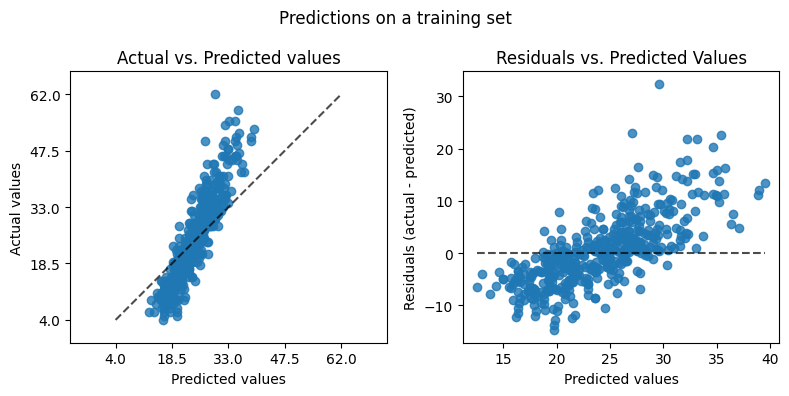

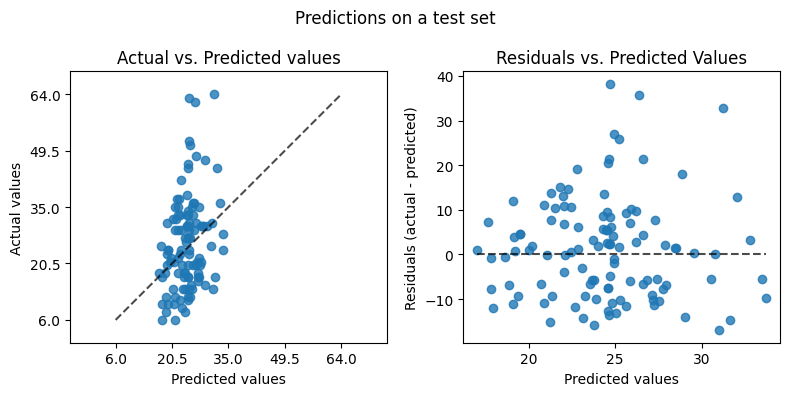

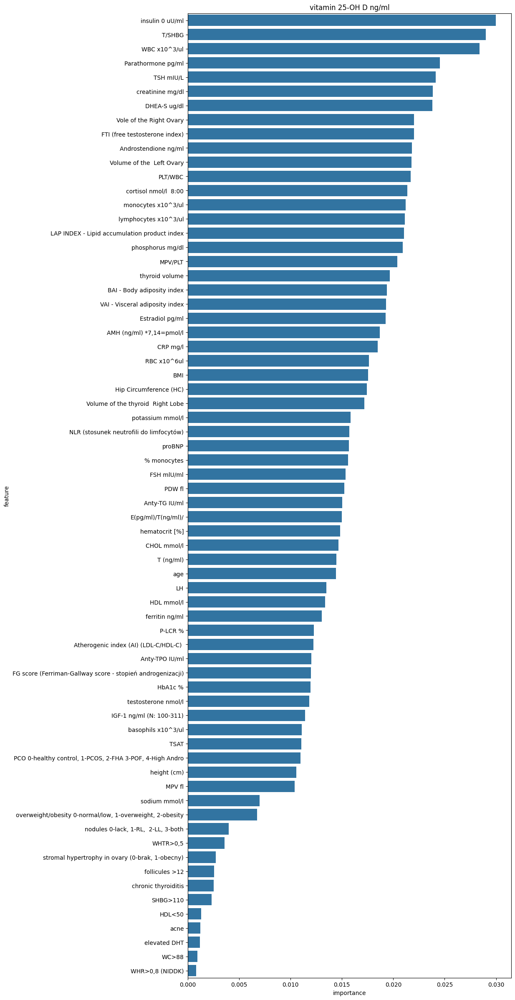

,model,data_set,mse,mae,rmse,r2
0,"RandomForestRegressor(criterion='absolute_error', max_features='sqrt',\n min_samples_leaf=3, min_samples_split=3, random_state=56)",training,46.765,5.202,6.838,0.620
1,"RandomForestRegressor(criterion='absolute_error', max_features='sqrt',\n min_samples_leaf=3, min_samples_split=3, random_state=56)",test,130.758,8.926,11.435,0.074


In [57]:
feature_subset = selected_features_map['mutual_info']

rf_model = RandomForestRegressor(n_estimators=100, max_depth=None, max_features='sqrt', min_samples_leaf=3, min_samples_split=3, criterion='absolute_error', random_state=56)
vit_d_model_scores_df, feature_importnces_rf = train_model(rf_model, VITAMINE_D, X_train_vit_d[feature_subset], y_train_vit_d, X_test_vit_d[feature_subset], y_test_vit_d, continuous_preprocessor_tree, categorical_preprocessor, get_feature_importance_rf)
vit_d_model_scores_df

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


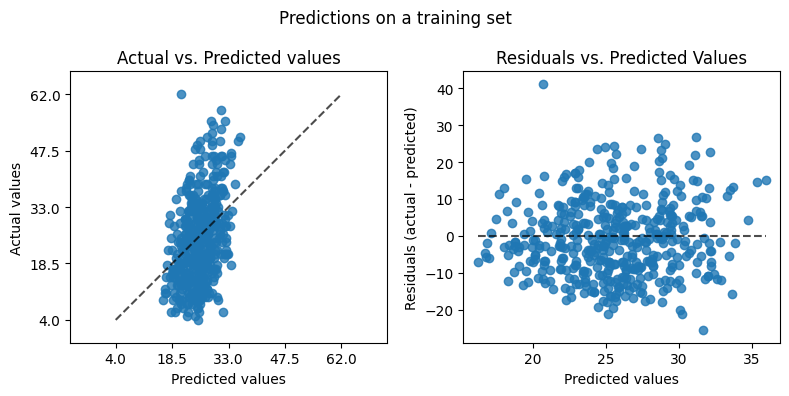

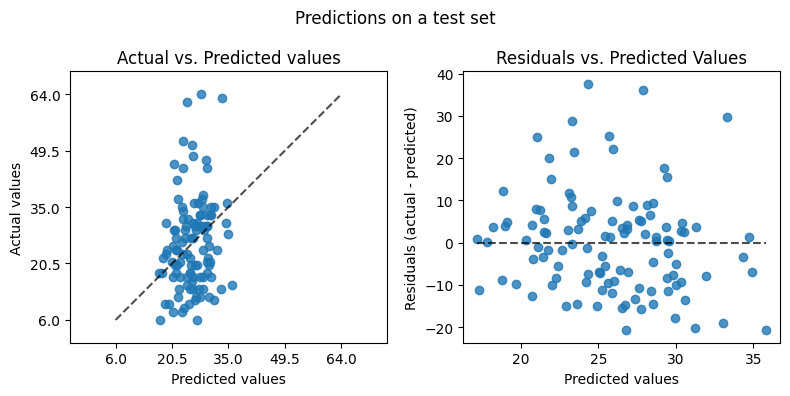

,model,data_set,mse,mae,rmse,r2
0,KNeighborsRegressor(n_neighbors=14),training,104.284,8.283,10.212,0.153
1,KNeighborsRegressor(n_neighbors=14),test,140.067,9.097,11.835,0.008


In [118]:
knn_model = KNeighborsRegressor(n_neighbors=14)

feature_subset = best_features

vit_d_model_scores_df, feature_importnces_knn = train_model(knn_model, VITAMINE_D, X_train_vit_d[feature_subset], y_train_vit_d, X_test_vit_d[feature_subset], y_test_vit_d, continuous_preprocessor, categorical_preprocessor, get_feature_importance_knn)
vit_d_model_scores_df

c:\Users\karin\.Studia\magisterka\Master_project\.venv\Lib\site-packages\sklearn\impute\_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.


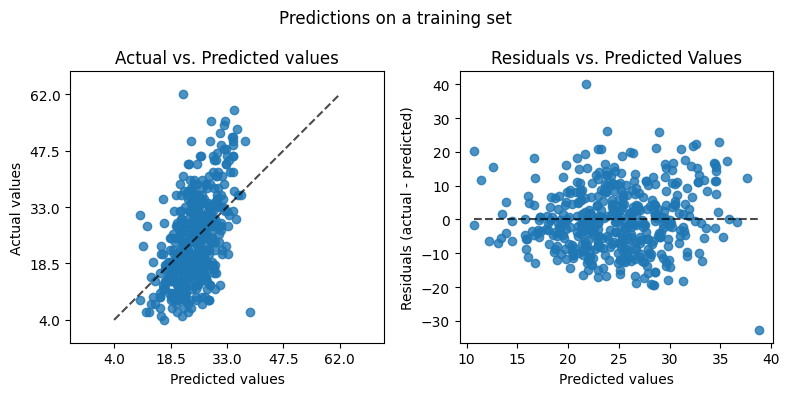

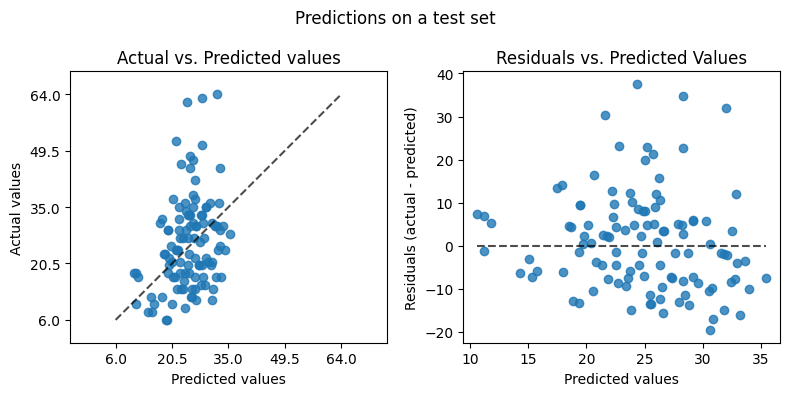

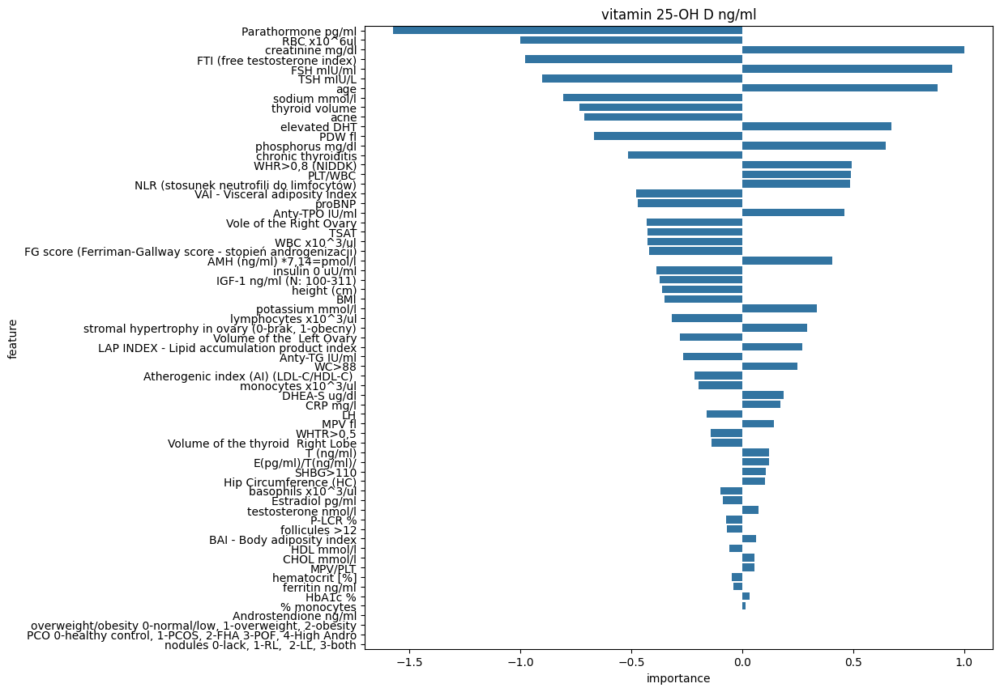

,model,data_set,mse,mae,rmse,r2
0,Ridge(alpha=100),training,90.259,7.534,9.500,0.267
1,Ridge(alpha=100),test,131.669,8.993,11.475,0.067


In [119]:
ridge_model = Ridge(alpha=100)
feature_subset = best_features


vit_d_model_scores_df, feature_importnces_ridge = train_model(ridge_model, VITAMINE_D, X_train_vit_d[feature_subset], y_train_vit_d, X_test_vit_d[feature_subset], y_test_vit_d, continuous_preprocessor, categorical_preprocessor, get_feature_importance_lasso)
vit_d_model_scores_df

### Hyperparameter tuning

In [46]:
feature_subset = selected_features_map['mutual_info']

Fitting 15 folds for each of 5 candidates, totalling 75 fits
Best parameters: {'model__alpha': 0.5}
Best score (neg_mean_absolute_error): -8.714283284535123


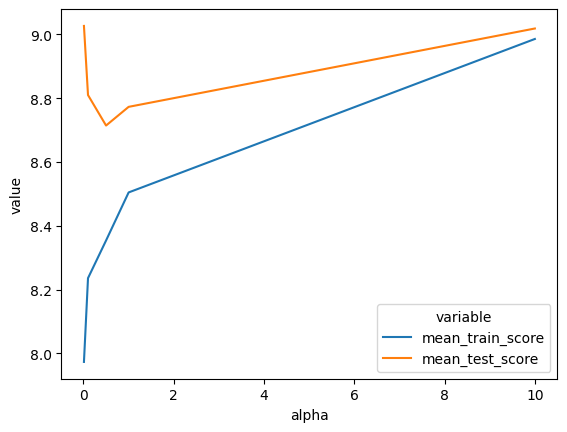

,alpha,mean_train_score,mean_test_score
0,0.01,7.972961,9.026686
1,0.1,8.235699,8.809882
2,0.5,8.353784,8.714283
3,1,8.504500,8.772893
4,10,8.985761,9.018594


In [55]:
lasso_model = Lasso()

lasso_param_grid = {
    "model__alpha": [0.01, 0.1, 0.5, 1, 10],
    }

vit_d_lasso_model_hyperparam_tuning_df = hyperparameter_tuning_linear(X_train_vit_d[feature_subset], y_train_vit_d, VITAMINE_D, Lasso(), continuous_preprocessor_hyperparam_tuning, categorical_preprocessor, lasso_param_grid, main_parameter='alpha')
vit_d_lasso_model_hyperparam_tuning_df

Fitting 15 folds for each of 5 candidates, totalling 75 fits
Best parameters: {'model__n_neighbors': 14}
Best score (neg_mean_absolute_error): -8.801720657619533


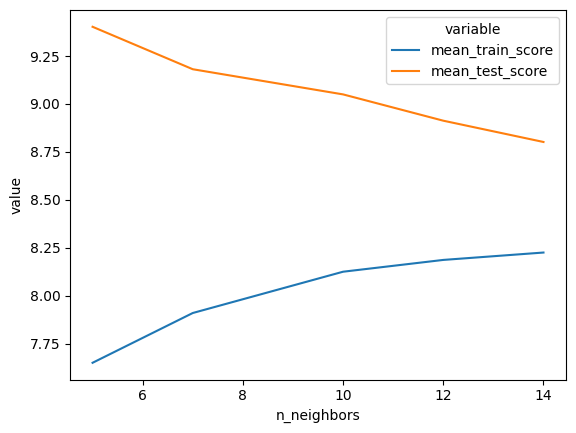

,n_neighbors,mean_train_score,mean_test_score
4,14,8.225093,8.801721
3,12,8.186559,8.912752
2,10,8.125045,9.049914
1,7,7.909694,9.181181
0,5,7.650067,9.402588


In [45]:
knn_model = KNeighborsRegressor()

knn_param_grid = {
    'model__n_neighbors': [5, 7, 10, 12, 14],  # Number of neighbors to consider
    # 'model__weights': ['uniform', 'distance'],  # Weight function used in prediction
    # 'model__algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],  # Algorithm used to compute the nearest neighbors
    # 'model__leaf_size': [20, 30, 40, 50],  # Leaf size passed to BallTree or KDTree
    # 'model__p': [1, 2]  # Power parameter for Minkowski metric (1 for Manhattan distance, 2 for Euclidean distance)
}

knn_hyperparam_tuning_df = hyperparameter_tuning_linear(X_train_vit_d[feature_subset], y_train_vit_d, VITAMINE_D, knn_model, continuous_preprocessor_hyperparam_tuning, categorical_preprocessor, knn_param_grid, main_parameter='n_neighbors')
knn_hyperparam_tuning_df.sort_values(by='mean_test_score')

Fitting 15 folds for each of 6 candidates, totalling 90 fits
Best parameters: {'model__alpha': 300}
Best score (neg_mean_absolute_error): -8.358168751565834


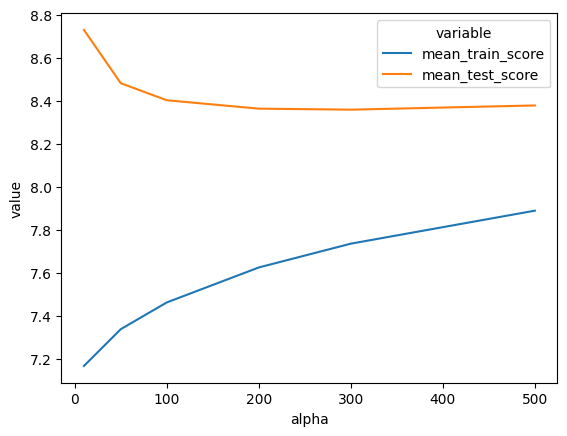

,alpha,mean_train_score,mean_test_score
0,10,7.167740,8.728593
1,50,7.338406,8.481125
2,100,7.462628,8.401814
3,200,7.625129,8.362883
4,300,7.735656,8.358169
5,500,7.888939,8.377736


In [47]:
ridge_param_grid = {
    "model__alpha": [10, 50, 100, 200, 300, 500],
}

vit_d_ridge_model_hyperparam_tuning_df = hyperparameter_tuning_linear(X_train_vit_d[feature_subset], y_train_vit_d, VITAMINE_D, Ridge(), continuous_preprocessor_hyperparam_tuning, categorical_preprocessor, ridge_param_grid, main_parameter='alpha')
vit_d_ridge_model_hyperparam_tuning_df

In [48]:
param_grid_rf = {
    'model__n_estimators': [100],
    'model__max_features': ['sqrt'],
    'model__max_depth': [None],
    'model__min_samples_split': [3, 5, 7],
    'model__min_samples_leaf': [3, 5, 7],
}

vit_d_rf_model_hyperparam_tuning_df = hyperparameter_tuning_general(X_train_vit_d[feature_subset], y_train_vit_d, VITAMINE_D, RandomForestRegressor(criterion="absolute_error"), continuous_preprocessor_tree_hyperparam_tuning, categorical_preprocessor, param_grid_rf)
vit_d_rf_model_hyperparam_tuning_df.sort_values(by='mean_test_score')

Fitting 15 folds for each of 9 candidates, totalling 135 fits
Best parameters: {'model__max_depth': None, 'model__max_features': 'sqrt', 'model__min_samples_leaf': 3, 'model__min_samples_split': 3, 'model__n_estimators': 100}
Best score (neg_mean_absolute_error): -8.45190849506299


,params,mean_train_score,mean_test_score
0,"{'model__max_depth': None, 'model__max_features': 'sqrt', 'model__min_samples_leaf': 3, 'model__min_samples_split': 3, 'model__n_estimators': 100}",5.160496,8.451908
8,"{'model__max_depth': None, 'model__max_features': 'sqrt', 'model__min_samples_leaf': 7, 'model__min_samples_split': 7, 'model__n_estimators': 100}",6.421745,8.479056
1,"{'model__max_depth': None, 'model__max_features': 'sqrt', 'model__min_samples_leaf': 3, 'model__min_samples_split': 5, 'model__n_estimators': 100}",5.140659,8.482869
5,"{'model__max_depth': None, 'model__max_features': 'sqrt', 'model__min_samples_leaf': 5, 'model__min_samples_split': 7, 'model__n_estimators': 100}",5.956131,8.495911
4,"{'model__max_depth': None, 'model__max_features': 'sqrt', 'model__min_samples_leaf': 5, 'model__min_samples_split': 5, 'model__n_estimators': 100}",5.995921,8.502832
7,"{'model__max_depth': None, 'model__max_features': 'sqrt', 'model__min_samples_leaf': 7, 'model__min_samples_split': 5, 'model__n_estimators': 100}",6.406750,8.505569
3,"{'model__max_depth': None, 'model__max_features': 'sqrt', 'model__min_samples_leaf': 5, 'model__min_samples_split': 3, 'model__n_estimators': 100}",5.976251,8.520184
6,"{'model__max_depth': None, 'model__max_features': 'sqrt', 'model__min_samples_leaf': 7, 'model__min_samples_split': 3, 'model__n_estimators': 100}",6.428403,8.526420
2,"{'model__max_depth': None, 'model__max_features': 'sqrt', 'model__min_samples_leaf': 3, 'model__min_samples_split': 7, 'model__n_estimators': 100}",5.262586,8.549488


### The rest

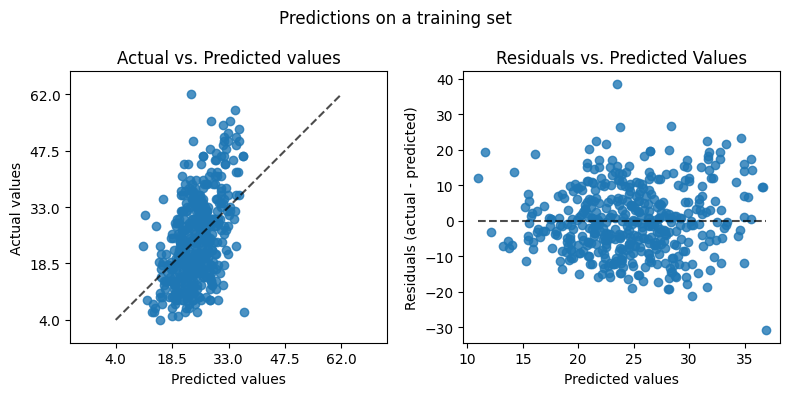

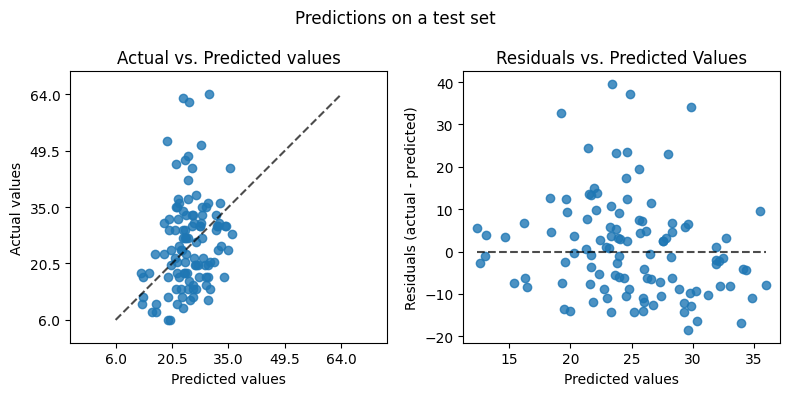

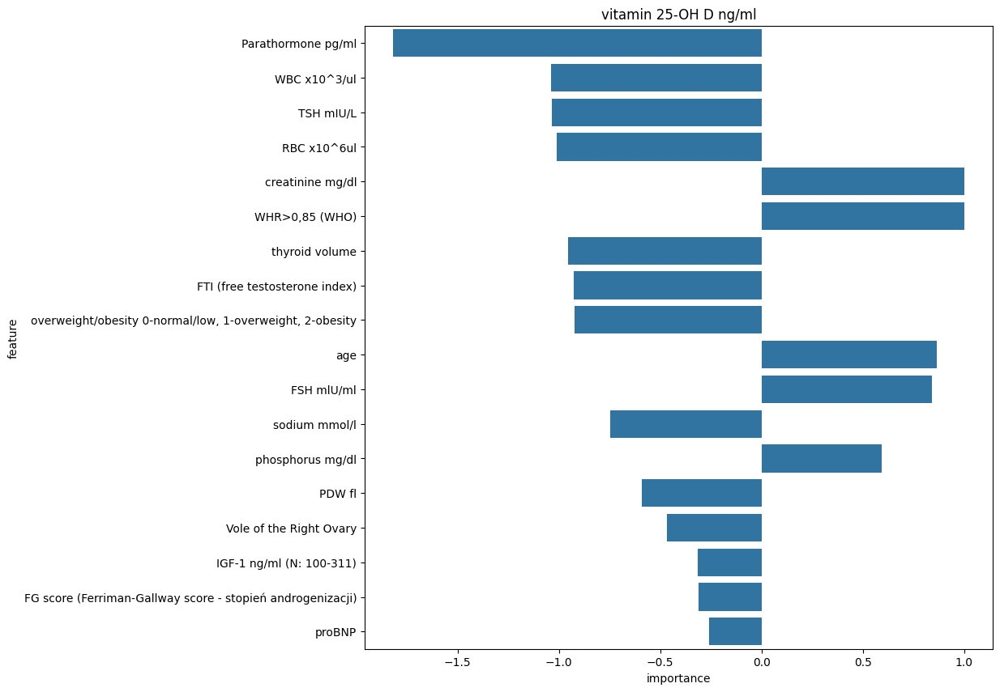

,model,data_set,mse,mae,rmse,r2
0,Lasso(alpha=0.2),training,93.221,7.723,9.655,0.243
1,Lasso(alpha=0.2),test,138.746,9.072,11.779,0.017


In [13]:

# NOTE: all set results
lasso_model = Lasso(alpha=0.2)

vit_d_model_scores_df, feature_importnces_lasso = train_model(lasso_model, VITAMINE_D, X_train_vit_d[intersection_all_sets], y_train_vit_d, X_test_vit_d[intersection_all_sets], y_test_vit_d, continuous_preprocessor, categorical_preprocessor, get_feature_importance_lasso)
vit_d_model_scores_df

In [15]:
# TODO: make a method out of it 

# fajny wykres przedstawiający liczbę zmiennych - może zbyt duży na naszą liczbę zmiennych

# coefs=[]
# alphas=2**np.arange(10,-10,-.1)
# for alpha in alphas:
#     ridge= Lasso(alpha=alpha).fit(X_train_vit_d[intersection_all_sets], y_train_vit_d)
#     coefs.append(ridge.coef_)
# coefs=np.array(coefs)

# #plot results
# N,M=X_train_vit_d.shape
# plt.figure(figsize=(20,7))
# for i in range(M):
#     plt.plot(alphas, coefs[:,i], label="Var %d" % (i+1))
# # plt.axvline(x = 10, color = 'b', label = 'best Alpha')
# plt.xscale("log")
# plt.legend()
# plt.grid()
# plt.show()

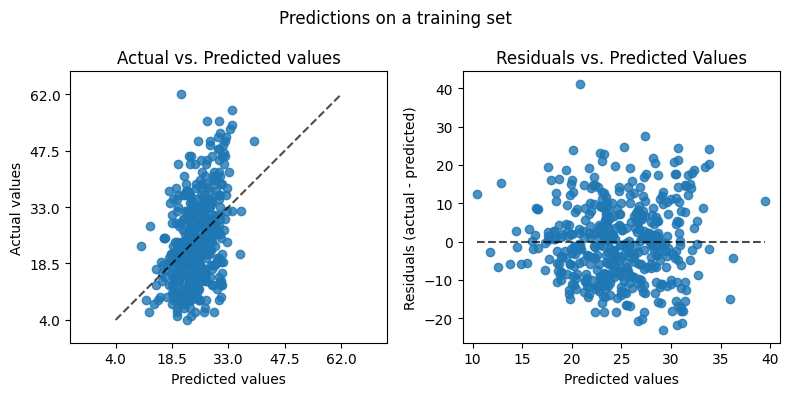

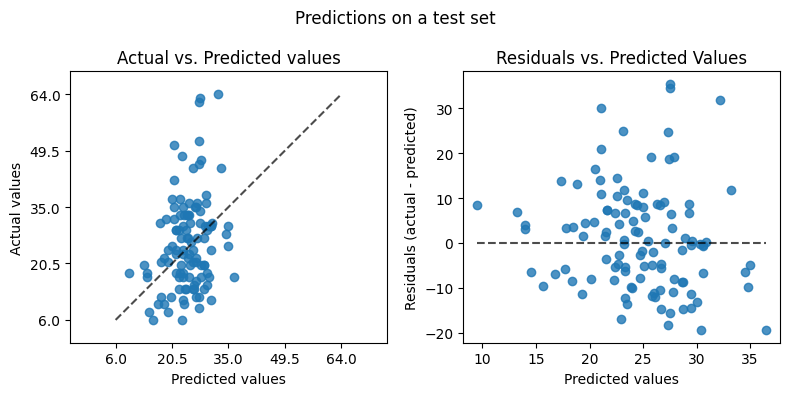

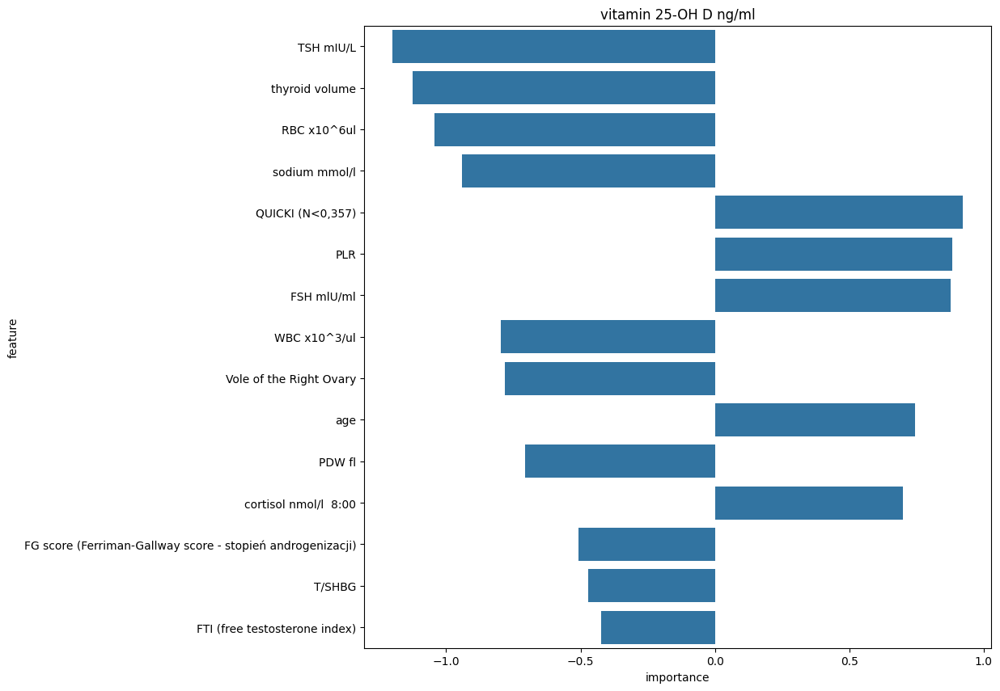

,model,data_set,mse,mae,rmse,r2
0,Ridge(alpha=50),training,101.311,8.049,10.065,0.177
1,Ridge(alpha=50),test,135.106,9.117,11.623,0.043


In [ ]:
ridge_model = Ridge(alpha=50)

vit_d_model_scores_df, feature_importnces_ridge = train_model(ridge_model, VITAMINE_D, X_train_vit_d[intersection_all_sets], y_train_vit_d, X_test_vit_d[intersection_all_sets], y_test_vit_d, continuous_preprocessor, categorical_preprocessor, get_feature_importance_lasso)
vit_d_model_scores_df

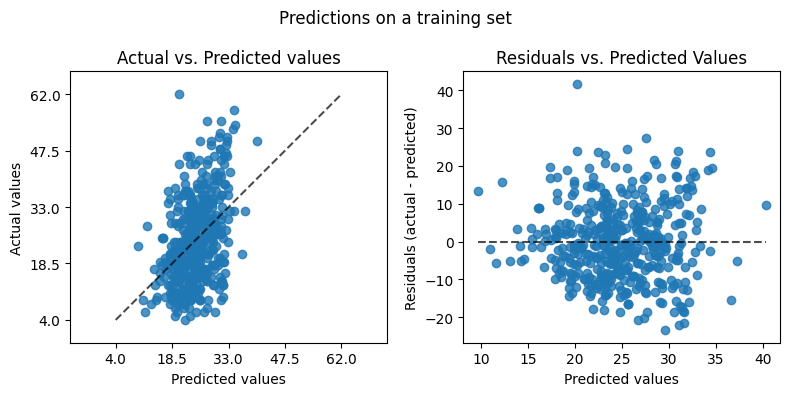

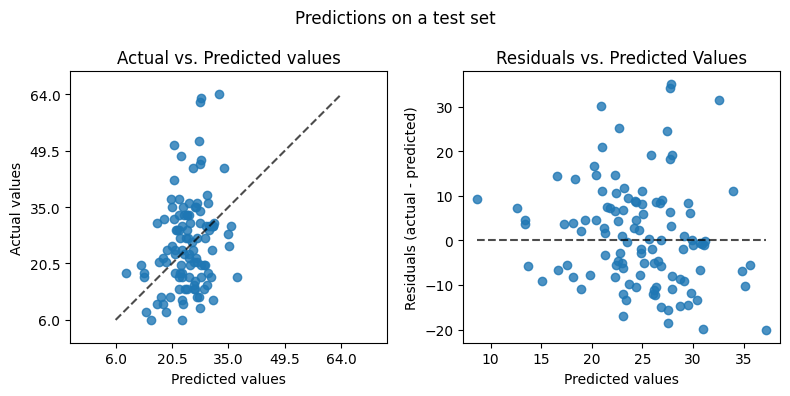

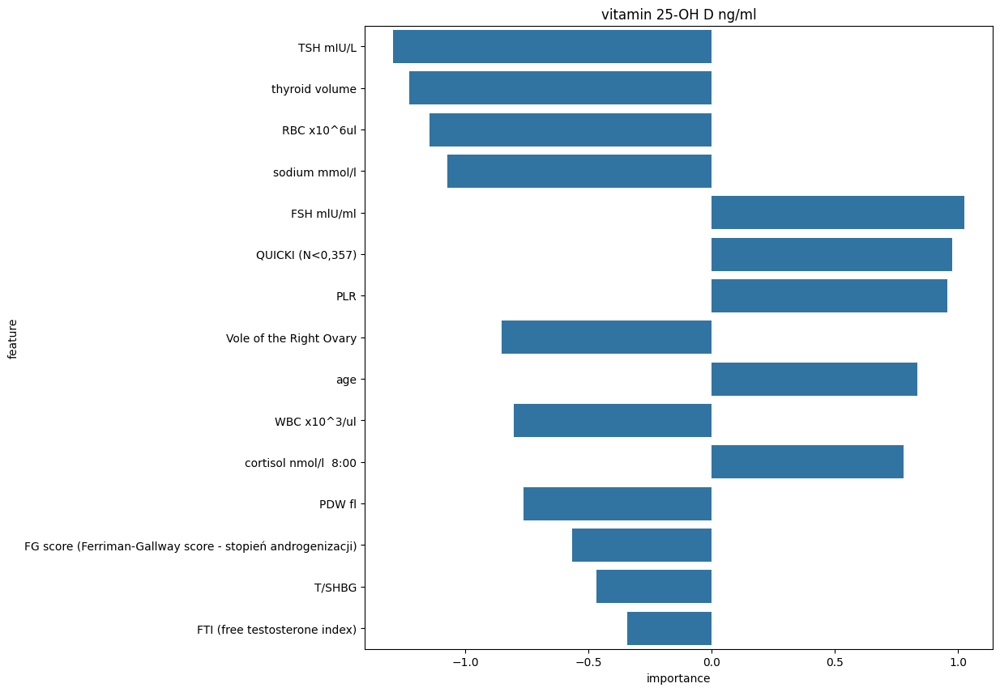

,model,data_set,mse,mae,rmse,r2
0,LinearRegression(),training,101.208,8.037,10.060,0.178
1,LinearRegression(),test,136.176,9.196,11.669,0.036


In [ ]:
#  NOTE: cropped subset results:

lr_model = LinearRegression()

vit_d_model_scores_df, feature_importnces_lr = train_model(lr_model, VITAMINE_D, X_train_vit_d[intersection_all_sets], y_train_vit_d, X_test_vit_d[intersection_all_sets], y_test_vit_d, continuous_preprocessor, categorical_preprocessor, get_feature_importance_lasso)
vit_d_model_scores_df

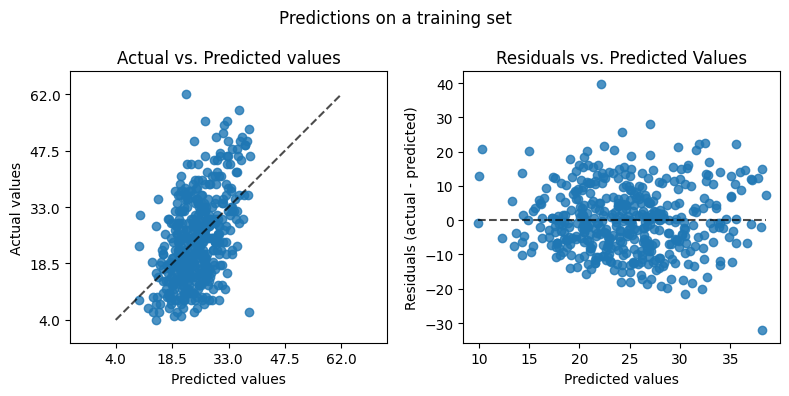

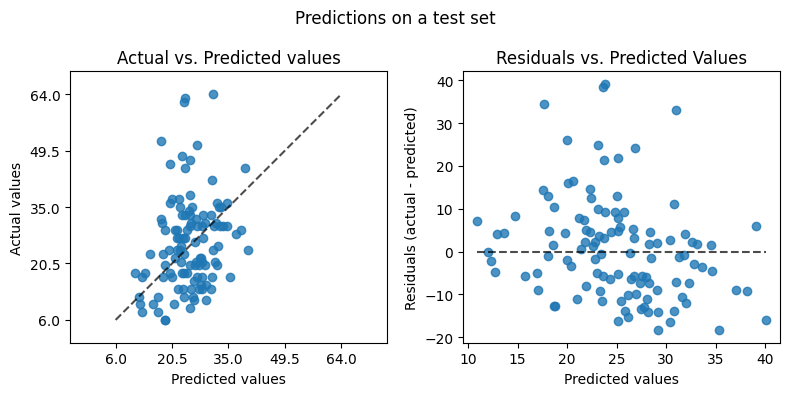

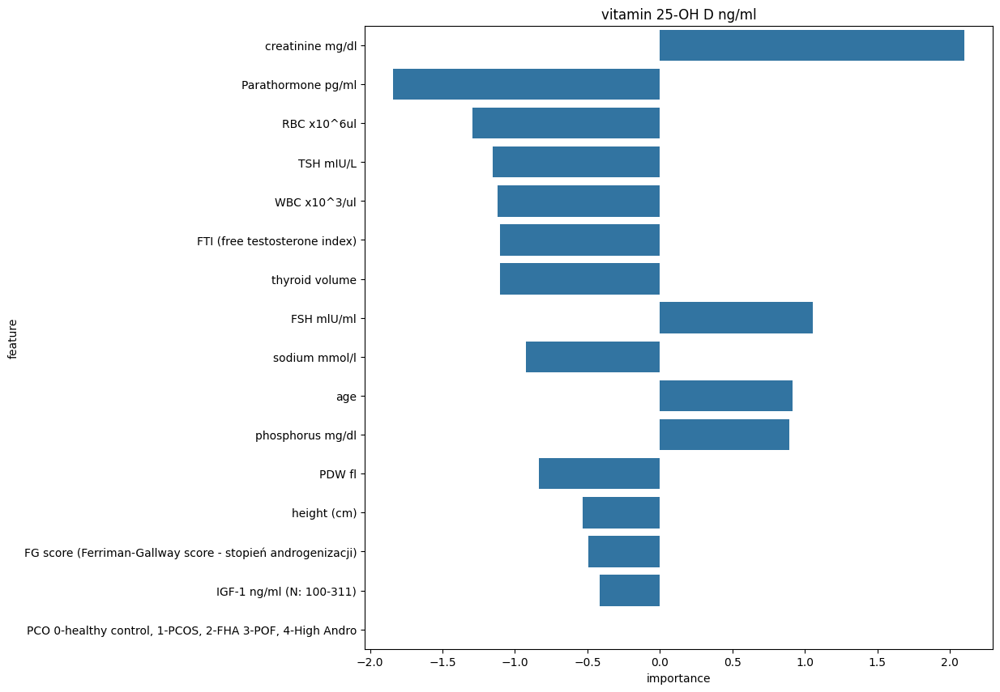

,model,data_set,mse,mae,rmse,r2
0,LinearRegression(),training,93.217,7.707,9.655,0.243
1,LinearRegression(),test,144.073,9.174,12.003,-0.020


In [ ]:
#  NOTE: all features results:

lr_model = LinearRegression()

vit_d_model_scores_df, feature_importnces_lr = train_model(lr_model, VITAMINE_D, X_train_vit_d[intersection_all_sets], y_train_vit_d, X_test_vit_d[intersection_all_sets], y_test_vit_d, continuous_preprocessor, categorical_preprocessor, get_feature_importance_lasso)
vit_d_model_scores_df

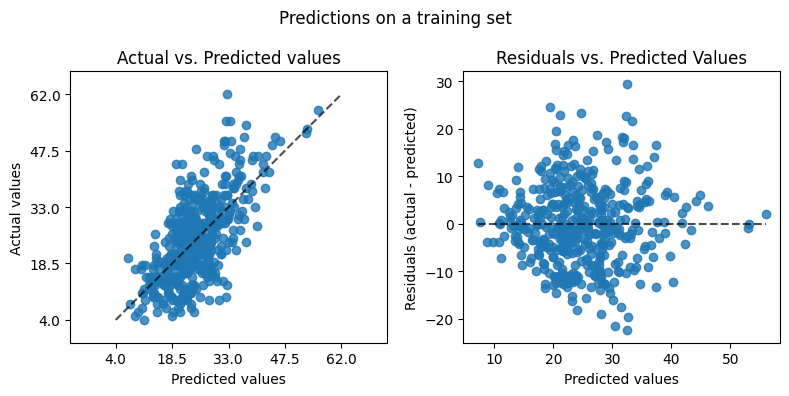

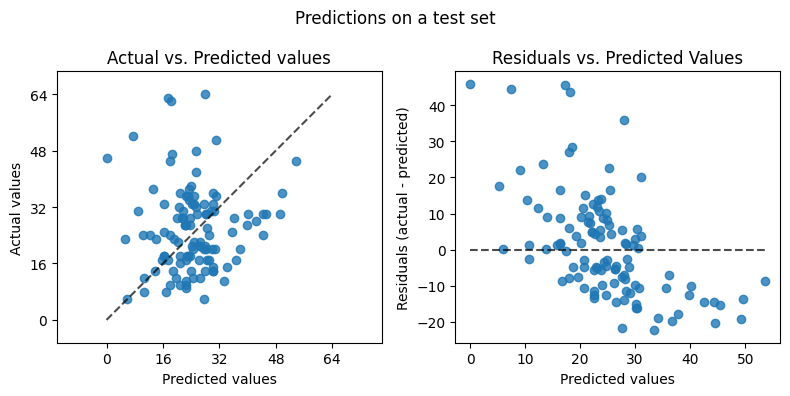

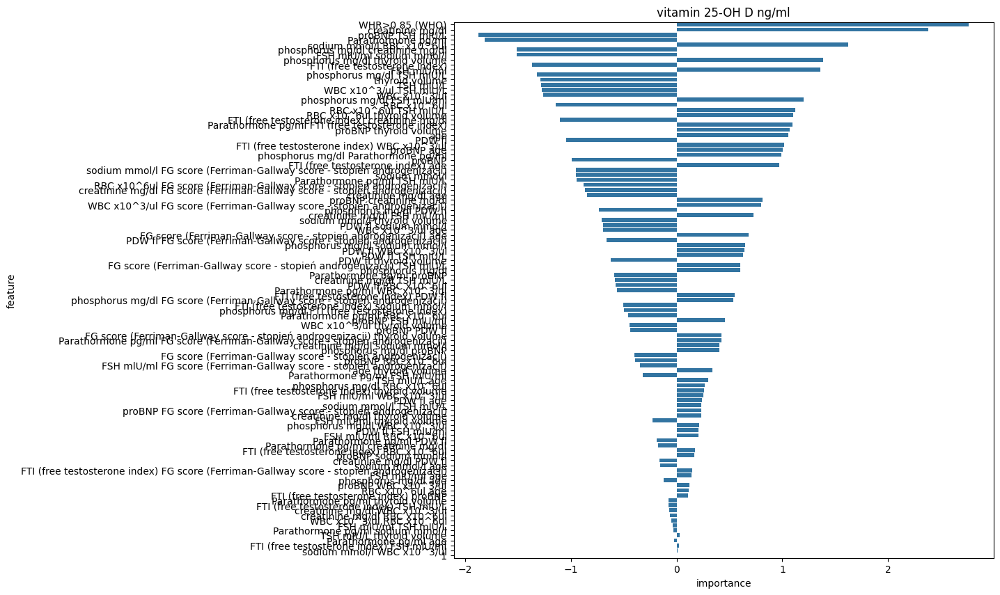

,model,data_set,mse,mae,rmse,r2
0,LinearRegression(),training,69.355,6.536,8.328,0.437
1,LinearRegression(),test,213.520,11.202,14.612,-0.512


In [ ]:
lr_model = LinearRegression()

vit_d_model_scores_df, feature_importnces_lr_poly = train_model(lr_model, VITAMINE_D, X_train_vit_d[intersection_all_sets], y_train_vit_d, X_test_vit_d[intersection_all_sets], y_test_vit_d, linear_continuous_preprocessor, categorical_preprocessor, get_feature_importance_lasso)
vit_d_model_scores_df

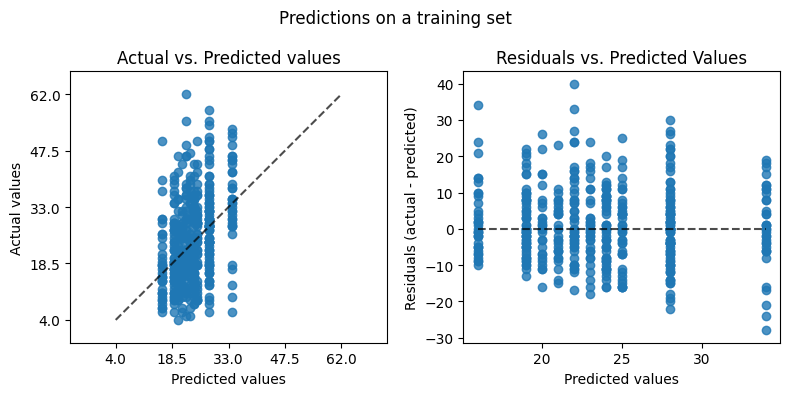

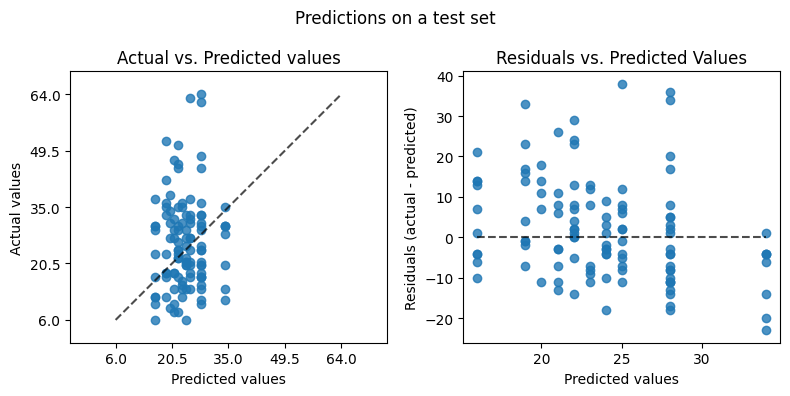

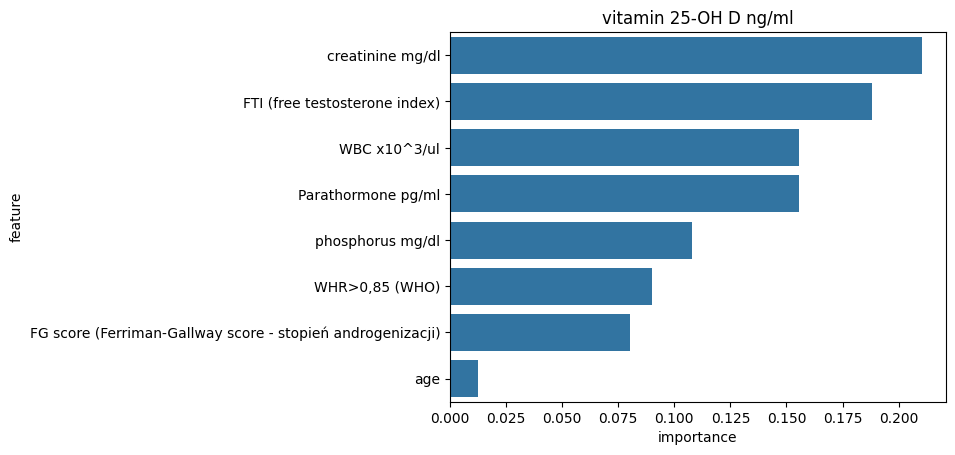

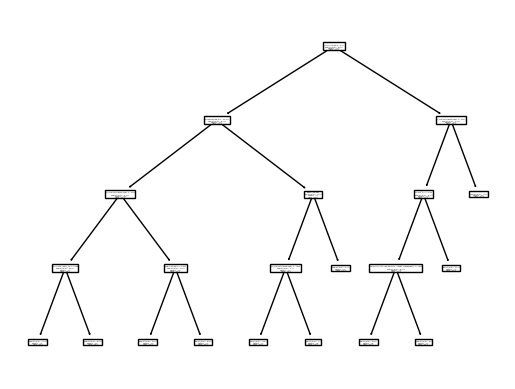

,model,data_set,mse,mae,rmse,r2
0,"DecisionTreeRegressor(criterion='absolute_error', max_depth=8,\n min_samples_leaf=27, min_samples_split=17,\n random_state=62, splitter='random')",training,108.677,8.054,10.425,0.117
1,"DecisionTreeRegressor(criterion='absolute_error', max_depth=8,\n min_samples_leaf=27, min_samples_split=17,\n random_state=62, splitter='random')",test,158.865,9.730,12.604,-0.125


In [ ]:
tree_model = DecisionTreeRegressor(criterion="absolute_error", max_depth=8, min_samples_leaf=27, min_samples_split=17, splitter='random', random_state=62)
vit_d_model_scores_df, feature_importnces_tree = train_model(tree_model, VITAMINE_D, X_train_vit_d[intersection_all_sets], y_train_vit_d, X_test_vit_d[intersection_all_sets], y_test_vit_d, tree_continuous_preprocessing, categorical_preprocessor, get_feature_importance_tree)
vit_d_model_scores_df

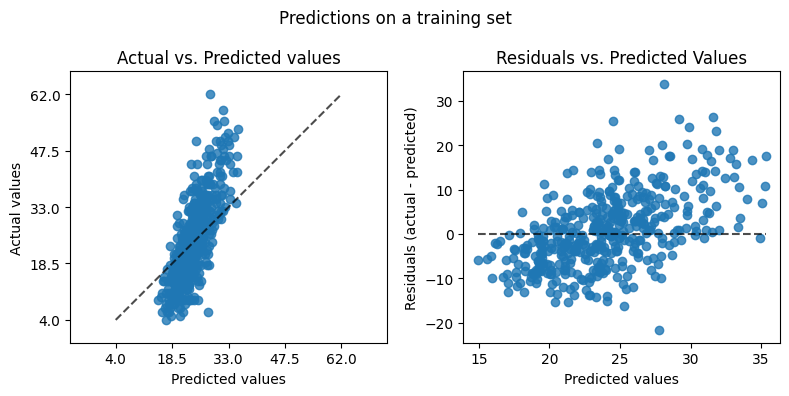

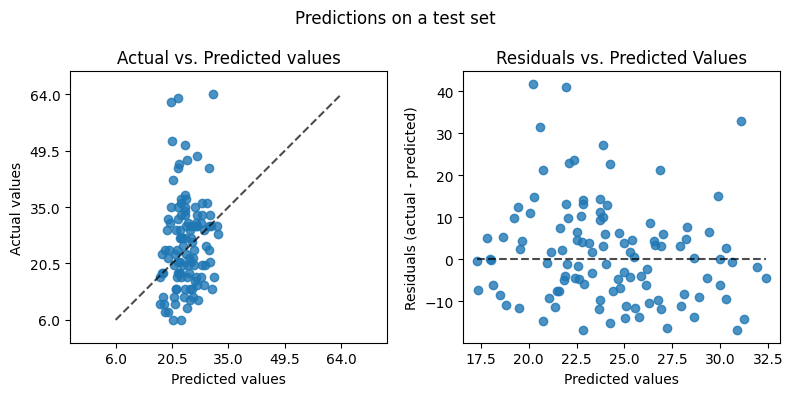

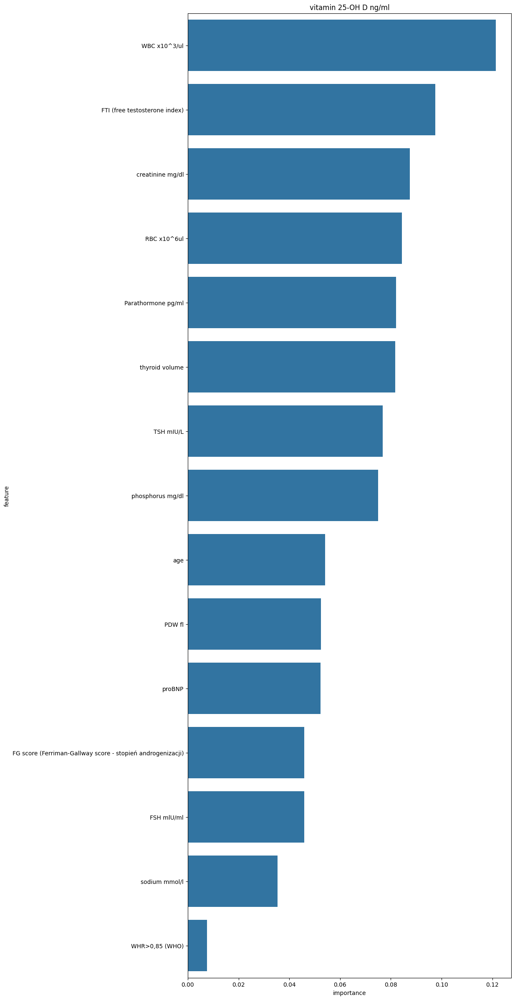

,model,data_set,mse,mae,rmse,r2
0,"RandomForestRegressor(criterion='absolute_error', max_features='sqrt',\n min_samples_leaf=7, min_samples_split=10,\n n_estimators=200, random_state=56)",training,70.468,6.563,8.395,0.428
1,"RandomForestRegressor(criterion='absolute_error', max_features='sqrt',\n min_samples_leaf=7, min_samples_split=10,\n n_estimators=200, random_state=56)",test,144.483,9.101,12.020,-0.023


In [ ]:
rf_model = RandomForestRegressor(n_estimators=200, max_depth=None, max_features='sqrt', min_samples_leaf=7, min_samples_split=10, criterion='absolute_error', random_state=56)
vit_d_model_scores_df, feature_importnces_rf = train_model(rf_model, VITAMINE_D, X_train_vit_d[intersection_all_sets], y_train_vit_d, X_test_vit_d[intersection_all_sets], y_test_vit_d, tree_continuous_preprocessing, categorical_preprocessor, get_feature_importance_rf)
vit_d_model_scores_df